In [1]:
%matplotlib notebook

In [183]:
!pip install seaborn

In [211]:
# Dependencies
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import numpy as np
import requests
import json
import csv
import gmaps

# Google API Key
from config import gkey
from pprint import pprint
#gkey

In [3]:
#Read LA county house price list
house_p_df = pd.read_csv("res_la_house_price.csv")
#house_p_df.head()
#house_p_df.rename(columns={"CountyName":"county"})
house_p_df.head()
#new_county=[]
#for row in house_p_df:
  #  print(row["CountyName"])
    #new_county.append(row) 
    


,RegionID,RegionName,State,Metro,CountyName,2018-05
0,12447,Los Angeles,CA,Los Angeles-Long Beach-Anaheim,Los Angeles,714700
1,46298,Long Beach,CA,Los Angeles-Long Beach-Anaheim,Los Angeles,633200
2,45457,Glendale,CA,Los Angeles-Long Beach-Anaheim,Los Angeles,927000
3,5534,Lancaster,CA,Los Angeles-Long Beach-Anaheim,Los Angeles,279200
4,40227,Palmdale,CA,Los Angeles-Long Beach-Anaheim,Los Angeles,309700


In [4]:
house_p_df.count()

RegionID      113
RegionName    113
State         113
Metro         113
CountyName    113
2018-05       113
dtype: int64

house_p_df=house_p_df.loc[house_p_df['RegionName'].isin(['Pasadena','Cerritos','Torrance'])]
house_p_df

In [6]:
#Read LA county lat and long csv file
la_long_df = pd.read_csv("zip_codes_states_LA_COUNTY.csv")
la_long_df.head()

,zip_code,latitude,longitude,RegionName,State,CountyName
0,90001,33.973951,-118.248405,Los Angeles,CA,Los Angeles
1,90002,33.950514,-118.245855,Los Angeles,CA,Los Angeles
2,90003,33.949164,-118.273156,Los Angeles,CA,Los Angeles
3,90004,33.786594,-118.298662,Los Angeles,CA,Los Angeles
4,90005,33.786594,-118.298662,Los Angeles,CA,Los Angeles


In [7]:
la_long_df=la_long_df.dropna()
la_long_df.count()

zip_code      528
latitude      528
longitude     528
RegionName    528
State         528
CountyName    528
dtype: int64

In [8]:
# find the closest restaurant of each type to coordinates

base_url = "https://maps.googleapis.com/maps/api/place/nearbysearch/json"
params = {
    # "location": "33.786594,-118.298662",  # zip_code 90001 coords,
    "rankby": "distance",
    "type": "restaurant",
    "keyword":"organic",
    "key": gkey,
}

res_name=[]
#RegionName=[]
res_address=[]
res_level=[]
res_rating=[]
res_location=[]
#lat=[]
#lon=[]

compond_list={"Resturant name":res_name,
           #   "lat" :lat,
           #   "lon" :lon,
              "Location":res_location,
              "Address" :res_address,
              "Price level":res_level,
              "Rating":res_rating }
# use iterrows to iterate through pandas dataframe
for index, row in la_long_df.iterrows():

    # get restaurant type from df
    #restr_type = row['ethnicity']
    lat=row['latitude']
    lon=row['longitude']
   # RegionName=row['RegionName']
    # add keyword to params dict
    params['location'] =f'{lat},{lon}'

    # assemble url and make API request
    print(f"Retrieving Results for Index {index}: {lat},{lon}")
    response = requests.get(base_url, params=params).json()
  #  results = response.get('results')
    #print(results)
    
    # extract first result and use pd.set_value to insert into dataframe
    results = response.get('results')
    pprint(results)
    for x in range(20):
        if (results):
       
            restr = response['results'][x]
          ##  print(f"Closest {lat},{lon} restaurant is {restr.get('name', 'Unknown')}.")
            la_long_df.loc[index, 'name'] = restr.get('name', '')
            res_name.append(restr.get('name', ''))
           # lat.append(str(lat))
           # lon.append(str(lon))
            la_long_df.loc[index, 'address'] = restr.get('vicinity', '')
            res_address.append(restr.get('vicinity', ''))
            la_long_df.loc[index, 'price_level'] = restr.get('price_level', '')
            res_level.append(restr.get('price_level', ''))
            res_location.append(restr.get('geometry','location'))
            la_long_df.loc[index, 'rating'] = restr.get('rating', '')
            res_rating.append(restr.get('rating', ''))
        else:
            print("No results for " + lat+lon)
            print("------------")
#print(compond_list)      

Retrieving Results for Index 0: 33.973951,-118.248405
[{'geometry': {'location': {'lat': 34.0450139, 'lng': -118.2388682},
               'viewport': {'northeast': {'lat': 34.04636372989273,
                                          'lng': -118.2375183701073},
                            'southwest': {'lat': 34.04366407010728,
                                          'lng': -118.2402180298928}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': 'bdc0c9353ceb91395214f3f84f0016059271acd7',
  'name': 'Shojin',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2336,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/100540448898812651487/photos">Roman '
                                    'Roze</a>'],
              'photo_reference': 'CmRaAAAATbfIXUCJaVJbJFXhCQODjdJnm70x3iphyGGjyMl3w_Acx8W8oTRLLLw7dIeRVCttEvJR9n2XdpIV4LwBkcG3_eIT6Gz7Y1Z6X_Nsi4Yh-YBKLj5WYAZ6NwHqUXb7Qh

Retrieving Results for Index 1: 33.950514,-118.245855
[{'geometry': {'location': {'lat': 33.9888277, 'lng': -118.3340017},
               'viewport': {'northeast': {'lat': 33.99026077989273,
                                          'lng': -118.3326526201072},
                            'southwest': {'lat': 33.98756112010729,
                                          'lng': -118.3353522798927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': 'bb2d61cc6f1163163009062bb95ce6afa4b8fb4d',
  'name': 'Mr. Wisdom Organic Health Food Hare Krishna',
  'opening_hours': {'open_now': False},
  'photos': [{'height': 648,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/113616406047891300708/photos">Mcclendon '
                                    'Tessa</a>'],
              'photo_reference': 'CmRaAAAA1JN3ttgTVNk417zwr5BJdY5J5kgIEijwzXgY4OtG7ZZhb_YyV1l2hjSbBzLXBSBMfk2QSXN8bCQ7cXn5LJ1b

  'photos': [{'height': 3300,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/111994958502807816474/photos">Tocaya '
                                    'Organica</a>'],
              'photo_reference': 'CmRaAAAA0AML14cxZySfw6M_QaIBmyqvwfxP35X7VDatzo3dsVT7pLfY74gpVomz-O7y-fgQRqXxm3ol74TGA8YMLacpGzhaqjrSVuaT08OGc4DQZm5ojNQXdiTIpFw8_nD0uTuWEhDUiammyWqZgw5FClW8tqgDGhQ7fobDJXVaflRUNsz9gYChz62o-w',
              'width': 4800}],
  'place_id': 'ChIJoe7dCrm6woARaDoWIuvoTH8',
  'plus_code': {'compound_code': 'XGPH+M8 Los Angeles, California',
                'global_code': '8553XGPH+M8'},
  'price_level': 2,
  'rating': 4.6,
  'reference': 'CmRbAAAATeaBv9-lY2h9QUYuMwQydccAaboVtswPuxdzAFCx65avwaf3yKhQMgx3t2nKVkwll5k7D21OsZw2ykPq-Is3sd2N7nqTqxwD3Lq5WNceYGiF-8zq0RoXvrU1kNQS5mzyEhDvny3YevxZuBl-MSeFZgTSGhShAiYoLQWFPoA0_ujYO4rEX4AE4A',
  'scope': 'GOOGLE',
  'types': ['restaurant', 'food', 'point_of_interest', 'establishment']

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAtxQt9OLksyZjAcJ7drNISlxGpYgDvQLpkpabQjJHZD-60zk2_eoZHa_k3F0vc6tqPws2WoQilkFLC7-0INMqKrXPG_ciO3qOrE9Wj9QHbnzDq0mnieiMPP8_SsTBS1crEhCWpog0S2M0eVdCwSnjrv67GhSJhN3PmiSjl6PWdo63u

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAbd6FFMAC3DrsDrWbZqdjDsJqJP4KoCCiKki7hRI1I2QosNo84zvL2Uv7-hK9f76DwwoTTaznwfO0WXXIYWMHNy1v-CurGJ1JS2Weog_IgAqcv7GO8KJJylZXB2MK_ExnEhCIkOYnQm5wt3pIBP3GSY56GhRisLPzo3Uy-spjkzuhS

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAvIEtyfptADYuRfH8Ciczbim0ko47qH7tG36SX1fPhi5bkfjPtnWgd5t1xTJkeCoYwAID803PjpSmyMySUlPvMsap5pCqa5cFfk9ccOsbBgNskiJXfnrMvpr1DIvxt3TWEhBhvCEHxcCq3aeMELVTVYFuGhSzwOrLtapwwXUOGHjvM

Retrieving Results for Index 6: 33.786594,-118.29866200000001
[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAwlZXe6el12-APF6IBjoW50qSSv8RYVdhb2Q32l0RNZKe4efvZuXvqPl348Le5ccjV_P1IYcKPX9ug-_szJB-FHfjvQwqnd-sgBzFe1Oh_ac_HIp

  'types': ['meal_takeaway',
            'restaurant',
            'food',
            'point_of_interest',
            'establishment'],
  'vicinity': '2943 Sunset Blvd, Los Angeles'}]
Retrieving Results for Index 7: 33.786594,-118.29866200000001
[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                       

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAVoiOCW2RM1GnNB-9mzO5MfubZPavFvEqywPbaP933jkDEQteyGiUFnUk4lt3fvupLHCSrja4_cFHtc23kCXHy2si0w7wmn93gmvELZOfcha3hjSChHnx410bW_X37jJyEhB0rergntedFWMpe0FxdfT2GhQt2LbkrMZhRHdxWfwN3

  'reference': 'CmRbAAAAUxr9CP3rzlgmmTT5SQkWNtkH0MeDLomB8FTnFVWkkam3TMrDK3CzSzAZbVk4xtYgv-_qlODAzhUx22QugS6zkkGIMzYde6lrpk4f-gFpUHK7dEK-z0ILjQNRQn3j1CHCEhCIbdXib-jJtR0RrUUUOKDdGhRVgnok2EKasIo5yjr5GbACogxvsA',
  'scope': 'GOOGLE',
  'types': ['cafe', 'restaurant', 'food', 'point_of_interest', 'establishment'],
  'vicinity': '639 N Larchmont Blvd, Los Angeles'},
 {'geometry': {'location': {'lat': 34.083804, 'lng': -118.273852},
               'viewport': {'northeast': {'lat': 34.08512132989272,
                                          'lng': -118.2725944701073},
                            'southwest': {'lat': 34.08242167010728,
                                          'lng': -118.2752941298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': 'bbd0c102c8b47dda6324b3d24b3738cae72f2fe5',
  'name': 'Local',
  'opening_hours': {'open_now': False},
  'photos': [{'height': 1440,
              'html_attributions': ['<a '
                            

[{'geometry': {'location': {'lat': 34.0427223, 'lng': -118.2529723},
               'viewport': {'northeast': {'lat': 34.04412892989271,
                                          'lng': -118.2516763201073},
                            'southwest': {'lat': 34.04142927010727,
                                          'lng': -118.2543759798927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': 'f1de9f4a1efebc3606ebac7086ee924c844c9d4f',
  'name': 'Wild Living Foods',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 3024,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/105216799928654181072/photos">sitosnilloc</a>'],
              'photo_reference': 'CmRaAAAAVeM3dwczEhudbI-LUB95onZbjienEMq8cCcr2zgaVUu1FLPLj3-SJtHFcUJQpT4bbmRaTwEb1CVplBLOcSGljnml6bF_Ag6ZhPtcn5_nTOLaVhAxEIptlD8f-5ducOl_EhCCs8A6WeyP4rpI7aTIx53pGhQRGQHCKa0xLxCIFERUIc3QZncuPg',
              'width':

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAAixWhkZfoAep0w3fGqs3I3JHn3jM37a0KWpRfXAOrwrnOSvTbAmO8AuNBDC5GZTu8A38XSq91o11U1SajjIA3ckFmYCT1yq87QpMnRP9HR63GHuv5sDVzQrI6ti2SB6NEhBUkKjuFFXi-mAwvriv1KBzGhQ4t5B5opSAo3HoCOI_Y

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAq-ORi_hizip1hlKnhPE2gFWYnR78eMaTsHoE0lsVtgQUsh_z2e_9mG7tnDrhw2Sh0WzrembONatRR-x7c_mgyzJDNXaL5m4OoiEL2PU_HLVsqt8B-cQp6-vrGhLgCYESEhDT30cKInphUM6X0jJu4NXJGhTuNW_hWz_2Azh70rBuW

Retrieving Results for Index 13: 33.786594,-118.29866200000001
[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAATg29W1PQLMcyzJdSMbotBCz1DP0KZzrGHASVx7lBjrTiKxAOzdXM_gVZjUE6_6yajfEyC7LFAjJgjGenEmvhFs8iB9X3FSj7ob7dykLbMj_AOs

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAu77ChjVAoDiczhJpxEDr5Q-UVkZXsxtdxP-Xc4GXh36RKT8B02f965D5vAovt7OgNECWXaTE36iGe_6-SuZ1rSbZv4GAu8VabXRC6GtEb93sROf7bqkGKtlvqXaMWp8uEhAZ8IFexCzR29tc1mYybl-xGhS6lGmdN4drs330-sGRJ

Retrieving Results for Index 15: 33.786594,-118.29866200000001
[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAA9mSg2tCaBNffHrbQ_VcygVL2moGh5JmSsITAhbn3ewYcrV_gZMITxSvrBOgvceXGSNyALavxNphFLM5RqsPeLFYNEtVGsumMOM_o_KVbOE26oA

                                          'lng': -118.2752941298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': 'bbd0c102c8b47dda6324b3d24b3738cae72f2fe5',
  'name': 'Local',
  'opening_hours': {'open_now': False},
  'photos': [{'height': 1440,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/112058939078955595328/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAA8hVM3nV7rGckn3mKSSjCaKez2NUicPOPmW5ZxiQTPYSoFiJTDLws1mUWEMomBoM6sbOi0kchtRVfDlp6fxHT-fDMmXTF8WcU8KP33Ax43MDX1SMTfWpHZJbcRic7cuH0EhBzC24g6X-npQB7JVNzr6s-GhQ8Fo-gie30EsBdLl9IESLERktd6g',
              'width': 2560}],
  'place_id': 'ChIJFxX5BT_HwoAR6nbXWcHJ6PU',
  'plus_code': {'compound_code': '3PMG+GF Los Angeles, California',
                'global_code': '85633PMG+GF'},
  'price_level': 2,
  'rating': 4.3,
  'reference': 'CmRbAAAAj2Utmb3SBO3vthG

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAA5ELK_KNgqpzOuaOg78qBk7SMXZy1-sqYoYvWXmrBzfjJmWH0H-I6hh21sS0RHSoft3Q00nKhKM-d1cn2JpPdDfTSXuBhBmUO5mtOhgz7o94swKPA0rAG0qV7bkGNDXmKEhBdI80DKviTaS8wsc1NNT2TGhSUV8AkjcY80tLzVVChN

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAArFS08iTB82WD_Hwa6sh0uN_XTPw_N8dMqcFXmk1374eJbuNN174l-jNjLCojW2wkNmmtQ2h_6okB-wAuVgUZuzciSUzmjYr8qGpxX-eekqnU2AI7l1XM-jfvdKUFKBTbEhAF5EtNF_LnlHUOgaNXbi3pGhQJUt9erRnlj8tIsFgQv

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAcgE1m6xoycA7tqru2OLhPQZvT_uayMhlQlYMo3ak88SIwUF9KqzRJpZV2UZnnJUIUNeLrPSLUEDqsv5hhx5qo7FAAOsxpW1fltd6yev1jQp5NnBBEW92pDi74woxbHoxEhBoeD17qMnrCUObF4aDC43MGhR8RNhWRogl2fvHF5sqC

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAA1ZCylHYQU6llU51F59TgjrTZa-vREc0mtdxLu91SG1cTxjCMIsRnSBXZZv8ZtM6QpI3PET47CPej937CzFnkr6TWwB5nHHYUCMqJlABTNTNFUQS30yB1Gs0FZo3t7wVwEhCIiiSgZVwJlvVplukDCD-jGhTsS4gQ1xh4FQyQ9OYkq

[{'geometry': {'location': {'lat': 33.9028094, 'lng': -118.053914},
               'viewport': {'northeast': {'lat': 33.90397877989272,
                                          'lng': -118.0525600701073},
                            'southwest': {'lat': 33.90127912010728,
                                          'lng': -118.0552597298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': 'fc44505a42b6f92adcef327d70efb78f36c18924',
  'name': 'Bionic Land',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/102054877762985657023/photos">Bionic '
                                    'Land</a>'],
              'photo_reference': 'CmRaAAAAFlxAV7wq3TLYpxlsxdPzo7dT8Qu4cAhhD2d3h29F9RdBriaqJLoknZ1oTGRNJUevN7LX59Jq3Oh1umH0JJ9yMSxpa6rBDc-ANvEdK0PEfugxQMhueZfrkhukPwF79SzjEhC4s8vxhzKFuc93mQX7jcoNGhQUBIqgMqedQTrsKXjepph

Retrieving Results for Index 22: 34.008262,-118.196055
[{'geometry': {'location': {'lat': 34.045623, 'lng': -118.2324544},
               'viewport': {'northeast': {'lat': 34.04683972989272,
                                          'lng': -118.2312061701073},
                            'southwest': {'lat': 34.04414007010728,
                                          'lng': -118.2339058298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': 'e6079b87496017dd25767531fa2d499d00319ad7',
  'name': 'Café Gratitude',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 3511,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/115281941221017080792/photos">Cafe '
                                    'Gratitude</a>'],
              'photo_reference': 'CmRaAAAAOoY76RhBAgPylZDI7yZaWPKw2R3HEkWxC237HFwzFaX46KE7miH7BisQ0PaRy5J5XJJrLsASnCSam79dq9WD-OEFcgEyMKW9ImoFIDTviU3aPCmyGT

  'price_level': 2,
  'rating': 4.5,
  'reference': 'CmRbAAAAUPsy34iVKhPPljOFVGhECcERzCygY7NdgBvIPkVK9yxouKpn0X39Zf4pYYZ7640TOXaIoH_HnXk2xM6pSFCkuPn1vrYmxnLmRMhFl15oNIfFqeuJgqSZEwrgl7SiAWSlEhB4Bikmc99zyaYGEusk31yuGhR0dfxy9X5okQzv8MII0-z5_CMKKg',
  'scope': 'GOOGLE',
  'types': ['store',
            'restaurant',
            'food',
            'point_of_interest',
            'establishment'],
  'vicinity': '4130 Sepulveda Blvd, Culver City'}]
Retrieving Results for Index 23: 33.786594,-118.29866200000001
[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': '

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAiELV2HtPCbr4hlt7cMjSIdddeYL0heoWimjKorPyuAaJBZGKDilQP14_AnvS6EmTk9Bl4l7gvtcNfj0pXj4IApdE6GFDp3L5UNoXz_KOs5SZG9aQyMWBB8lbcRI12Jd5EhBudAZWJILzYedsTc1UxG9QGhRzxlc1PBHHnPhyyn4JE

  'plus_code': {'compound_code': '3MMG+48 Los Angeles, California',
                'global_code': '85633MMG+48'},
  'price_level': 2,
  'rating': 4.5,
  'reference': 'CmRbAAAA54biDIm5O1KCTDxwhsOT7Bu25nHgFP-llEXyHgvv90YLKzF0_OaxafOLFaxum-dXJISVaKFzAWBh_L3tA1_ljpvmYsoM7llpakAVRYI3v7uG_8aNdmnnt_FT9btiSVxtEhCG2sn7lYUqCyDcYyT3isXzGhTV1iHv5qUWKmsf2sxujbcxukZJcg',
  'scope': 'GOOGLE',
  'types': ['cafe', 'restaurant', 'food', 'point_of_interest', 'establishment'],
  'vicinity': '639 N Larchmont Blvd, Los Angeles'},
 {'geometry': {'location': {'lat': 34.083804, 'lng': -118.273852},
               'viewport': {'northeast': {'lat': 34.08512132989272,
                                          'lng': -118.2725944701073},
                            'southwest': {'lat': 34.08242167010728,
                                          'lng': -118.2752941298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': 'bbd0c102c8b47dda6324b3d24b3738cae72f2fe5',
  'name

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAA8OVu2p-wUD3ooDF-vkWf8Ud_a6-74KHiR4aTwO1xqlOy78Z-Dooosgh5B9HYvd28Lf5Xb9QexbLu9BGLpIypKax8v9LJu3pkUa8PIp9fuRdTIfL-AAGv2NMUu3GglEesEhDNtCbPuMLzof2bVXaAYG7ZGhRbDXbVjetWMah6m6Hsw

              'width': 3024}],
  'place_id': 'ChIJaWQ_ELGkwoARaRHnRFYodVA',
  'plus_code': {'compound_code': '2GM4+26 Santa Monica, California',
                'global_code': '85632GM4+26'},
  'rating': 4.5,
  'reference': 'CmRbAAAAMcQ4z5IL-L8AJKJQ7wivke-Oj_PJFuZ3lZre1tZlQOuTRzWFD6aguCa1HXo9a2so2kNxy0dqqfuBxjpnkSyxnH4EAJuXGj0Ytj_5srBets47e36nRUVZ0t1MHZ59mwqjEhD7CPLeGlsQfp0i9Q1C_B-7GhTXtWXLjtWpNTtbSAQ2PAN7KAUN4Q',
  'scope': 'GOOGLE',
  'types': ['cafe', 'restaurant', 'food', 'point_of_interest', 'establishment'],
  'vicinity': '1426 Montana Ave, Santa Monica'},
 {'geometry': {'location': {'lat': 34.0828183, 'lng': -118.3241586},
               'viewport': {'northeast': {'lat': 34.08422687989272,
                                          'lng': -118.3225729201073},
                            'southwest': {'lat': 34.08152722010728,
                                          'lng': -118.3252725798928}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  '

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAFktRC2dV9Vax8Ny5L9oml-jKJXZo7Nxfdtm7MVaUeb6jcCcijFCN485awcKZqmesWQ9yglow372HQ_yM1Tvyy-lvbqUBIhYbr1n9bc4dU60T-NXzRuqlgfdRFkRyYb84EhALdpBdqAHwpoRe30t29XYPGhREGNCtrB6SftXtgZKTo

Retrieving Results for Index 29: 33.786594,-118.29866200000001
[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAA5cXEijEMlB6KqdDVN7_AWNkwkaUWaWmjoohKu4t4HFtf_pznZ1MZNB20JIm5zS1W_iIb75QxRX5BHQLho7xoG8aroNZ7H2_SiKpRiVbNHuGHX3

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAXClB8H-O0lQfb-8SOtRiBttUuGLmP0VIIDlDszq8mK2OZfHmdQkz0jFEtLIJPDHv5AirUZiThzHjbZkVH0jRP2xYa3rnEwE77tDDfsm01Bl4lUhgxgy8nDu12EyLQiWFEhARX2N1czNWsTBw_lBdqrcbGhR5gq0PzVq5G81lyM7DJ

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAyX7ACZbzwU8tW1zOhHBbx6T7JfP5ZFtk4QzJnwmYDKUl3-3uPUAyY9rFQv_SiodzmrpgDmZtnx1MYZxXEsI4jjaXvR5l_iobJ3hyNFVoBBUmcOMf7Dv7_X51qxu-dSovEhDIqOAjDBo-BAlROmPr7DosGhT_tEJEzlsKQkRULiYfl

                            'southwest': {'lat': 34.08242167010728,
                                          'lng': -118.2752941298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': 'bbd0c102c8b47dda6324b3d24b3738cae72f2fe5',
  'name': 'Local',
  'opening_hours': {'open_now': False},
  'photos': [{'height': 1440,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/112058939078955595328/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAA1vuE4gucCk-L56HlkAyq4zMWZIYrV-Myqcw6kMEoiZArdINFqZSwjmexcxwp6cfuVBcFmYZMdgPHW7iPW5nbJu09JMACOQrIF_XGnZeu6l1UbZnwc5MfYudwdzxIK9t0EhAFvDoOvALzuBQqqxXlM8e_GhQSI5kii8t2pZQi7m2STfOTwnmdkw',
              'width': 2560}],
  'place_id': 'ChIJFxX5BT_HwoAR6nbXWcHJ6PU',
  'plus_code': {'compound_code': '3PMG+GF Los Angeles, California',
                'global_code': '85633PMG+GF'},
  'price

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAA1RxczecWUQtY9rFB83BM0DVtU4iojSJRQMz3-NDa9163PrefymxeOUWWTLzTdy0flfVUkmDebebe3l_Eis7pA09Obe6CDiTKi3cyH3wVjLmTRrpCnpfk0MQ_MF3j5n-lEhDAyEeDgOYsaoV1rTLELOAwGhRLfcIEhxJaj04K9rGhm

               'viewport': {'northeast': {'lat': 34.08422687989272,
                                          'lng': -118.3225729201073},
                            'southwest': {'lat': 34.08152722010728,
                                          'lng': -118.3252725798928}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '21f5bb524cea1c8698187b817298300df290ad1b',
  'name': 'Cafe Gratitude',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 1365,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/115181038312887901832/photos">Cafe '
                                    'Gratitude</a>'],
              'photo_reference': 'CmRaAAAAkDSRu6fx0U5c8hYXXhCwDsOurFhFamrA0bJig_CbIZqGBAaybrNdHCWYeYytZP4ZY5RAehf8qz10yWhyn4QCwNYwWv7Tj2QFjuKvrfjJRPQ5kPfLZCohoAaHP5s4YvyDEhAV7LqtETW3CKVMZFIMlDmDGhTScJCW8Z1NolE8AaMMMGZoWqbh-g',
              'width': 2048}],
  'place_id': 'ChIJjR

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAeD-0JfnpZ1f2JNg9zj_pmRDTmgm08tamt1xK71i7dU2JYyBBqb_sGL8UECJhWsm7q_lE-o0ctFmFURKyMOcZPVbh9yWFl1iK_p3zNgcrkrK3GFvo-7psIVWOiHuG-s0iEhAPmmluyHemojLrQvcfUHjCGhSCFyKyZrdtCobJx1xy3

 {'geometry': {'location': {'lat': 34.0325744, 'lng': -118.4944729},
               'viewport': {'northeast': {'lat': 34.03397827989271,
                                          'lng': -118.4931872701073},
                            'southwest': {'lat': 34.03127862010727,
                                          'lng': -118.4958869298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/cafe-71.png',
  'id': '0f6a80d7df0edd0af2ff3d8f1b824e53923b9d6f',
  'name': 'Beaming Organic Superfood Café',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 4032,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/111912693773858789552/photos">Lo '
                                    'Shia</a>'],
              'photo_reference': 'CmRaAAAAQT5WaALVizHJer09Fz5d0KaFu5CgFT5XXgqJHb4GHc9YDDqys6YjJCYn0CrfASMKDKU_34yzYxYAMazXBoPSbX1ebtjnIS7sOQxLmxV7v7sQOfh21qybtRZaybkQom_nEhDh7PX-HZmqQOYna7o4wwLLGhQRM5yZJkK_9

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAASlURKGqSHXYzoBD1V4VpsC6oGUsRaIe8_DUSQWVBo8TSNrkRjEP-XGRjAIVsiubrhtlEh2cFbB8TVDMStKa5uyY8xDsbDfqWisaFbC2DLEuZ55QNYP8GBipI4VCJnRJzEhCk1P7b-v13ZWkGXmlFjpLqGhTo9eR4OUstQ1RB7wcsH

Retrieving Results for Index 38: 33.786594,-118.29866200000001
[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAALum9-lzJFbPBe8KD-bdqBfxRhl_hqP2wQVNBeyundwIf-DqTa9KWbk8pkbUWRqChEClMHQb4lMHFKf3hTmVeBO0uINUKCICsTfKv4gbaXZ0nM-

  'photos': [{'height': 1440,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/112058939078955595328/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAyo9OLfcq3L8IdELoJCV-IvO1PR8aLcIykbMushb4v4S_7SviMC4y30y0XqwQCBdZXCzpfTnPSWzz4BmhSul54hgGHDczeWNHjizMhCESN9zWUbdmav3_AVsNGy70HRclEhDe9dgzyCoUhXKwb1mPtpy7GhRGWtulQ1o0eu0sxmc9FajPHqFm2w',
              'width': 2560}],
  'place_id': 'ChIJFxX5BT_HwoAR6nbXWcHJ6PU',
  'plus_code': {'compound_code': '3PMG+GF Los Angeles, California',
                'global_code': '85633PMG+GF'},
  'price_level': 2,
  'rating': 4.3,
  'reference': 'CmRbAAAAPxxCCMKP_UG9k-I5vZwTGpDpZW27hPhTdA7Q0eWrrrusUIvz1hm8IRUN7Z5v1lVTMYAqnTIs4_iY0Cf-QkCY2AuRA5dP2AQ2cVXLpW_lihycE-FBaHoJy6O40-IOZm70EhDINxAn9eHW8fK1OHMTSnOLGhRHCkhIbaO6Mh-3RaxpkRR1o_xDGg',
  'scope': 'GOOGLE',
  'types': ['meal_takeaway',
            'restaurant',
            'food'

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAA0Sfcpi34qZ9zpE-ICsvF59nsQPMGatMmtJCwZLznhxKgnB4r9eLhEJYmJyrXIahDBedpzvWt2CVLtQaxC9fYcii7J_NUwFYDVvrq3mbnLk5wno_Qy5Qx3byEdnIYUGntEhCyDLmkTyeOGhW2Haa6pnvdGhQXBopn97pemS8nTD6gl

Retrieving Results for Index 41: 33.786594,-118.29866200000001
[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAA6Dtx0uDOidbY-M3V0ls18F4FqY9bgRKl2ra6HU97GqEhl34R1p0vS3kHlYCXQZSsGOKoBI3Xp2otswPQ5nGrihZd3YbUjxvcf8rhLuJ-C0CE9R

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAEDbjglSSkBRNpioHSA-JC9Yk2aSW2ytJa4KPKbnvcl--PiHVAITSVMoz3HNCXHuhY4XSciVu89HdnTX12hxs4lOczeOps3xvkW3Y_4kBYV65xuOkGf8MfLIlDUHDeTGuEhByeUoPJ4mRYnlC9YUk2oAMGhSkGhOGM9ua6sbu2NIMq

  'photos': [{'height': 4032,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/111912693773858789552/photos">Lo '
                                    'Shia</a>'],
              'photo_reference': 'CmRaAAAA1ipT58M1LRY2rNtAfT9fDCxiZOCwr2-pLBvT9Cx6xB2OV2YHJwM4-CK2yuVvXtjiL9UZfPb7jUz5tdXL3mkHeJQgBSWNI1mdGwmnrXrZwiEptNmvF6nh-IZbbeDmu8AMEhDdvPLjf7Oa_NUak1CVZUzTGhT_s-XTAp8C67UY3P2_J4H2EDFuqg',
              'width': 3024}],
  'place_id': 'ChIJaWQ_ELGkwoARaRHnRFYodVA',
  'plus_code': {'compound_code': '2GM4+26 Santa Monica, California',
                'global_code': '85632GM4+26'},
  'rating': 4.5,
  'reference': 'CmRbAAAAhspmL9vzgaPpg7oTKIQQ_wBctNWUBwtc1o5lo4WkcqlZcQ8mu52IiNRL6JmfKRCUy8g4evUlGz6QreWzegyXGagFnGjpfUHmrU-GO5kxAalnPmI6_mFrMUsFGdwtQYLsEhAwd13RlTdo7RGbsTzT3pC8GhT1Rjd7aeE-CkKoDFy5zTIEzbYOJA',
  'scope': 'GOOGLE',
  'types': ['cafe', 'restaurant', 'food', 'point_of_interest', 'establishment'],
  'vicinity': '14

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAE6vuEMLJ-exRPN22mNdJhIrE2vg-5yu9U-9wSdLsNW_i3Im3wjYxyXli1F0qE_4Fm5eUm1mpJGKxdgjunP5S_UB_ylhCJ71e8dYGoUc3MHl4Ph6tfv4A-emRN2_p2BiJEhCiEJDxh4BJIg0WW1GGAorZGhTXDYnDw4sik27eF360Z

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAlfnY1SZW__XUEx0EwB7u3Fx5yExKUCkB6uBKVArqfyyXfiJ6Ax4MmE53aeZkGVXQUKzOcJjnyRKeQAFmi9WLPBKjjbng-dDdlPYFitfad-uYnuFnUwr937FXd2vLAdy5EhDeu5v4DGS8o5Mtv6nrFkdIGhRSARyVnjAnWfG51ptiM

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAghQEcWXhVV_AQqoHPEwbcSsvWsCLZyFCzelFVYGmrq5-gdLbw1ZTRGrjAyzqDFFgWJqZ3O7bAsWGm3yTpZ0EZle3O5iPBRm41tvhO_J08RDcoa4Zcp2gIufTPJhlKiGaEhB7b9f4_nc_7LoX_bi9CTrrGhQlDPbQzE5sUQLDPX88W

Retrieving Results for Index 47: 33.786594,-118.29866200000001
[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAVdTkSWdjiS1btsELtdenfdwz8A_LYDMG5QODucnB2J0PNqdQ9maExAWAWrMa5I0gLBfK3R-QKjEzv0ZZFkaFqNWsOaRYy6Z48cFvyXyVJZbDI3

Retrieving Results for Index 48: 33.786594,-118.29866200000001
[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAr-N4JGZ0Ut0pomKFhuaHTBJFDJOeWI6bCjKaaSPuLTEVFboNiycLURGXScmyYyYDWlj1aChWTQ8-ppAVKXSsZ12amxI4d6Oj9eyNFEPWg9zvzg

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAATho58pwI2XuEeZ9KP7HeXCbAOhib-jN30I95lWK2Edt87b6mjDAUWC0CkePdbdXnb-wbFXb7srWFyQHkISUFMxjD3ulbOH9DInM2jH1EBjWtxJjkxywCllS2pehhNh8cEhAPJAjDYOsTVco9JXimLcb2GhSEZ_W9IlRBVxe3zd-tJ

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAACiBCQ1gRNeqx7ztcdZtb8OrmiGkj4gVo_mNiNAtdgomdBoKfrX-7sQukQEfZC2qCjlGgNOe_FGwhVNpZozkmNIcLj97suDWxv4xeIIdiCq9WoxDJ3fin2deQnTHLxm82EhAeNxPa-L3PLxUdC0tV4zG8GhTkFNbh5xb2Fkw9_cf4f

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAA-KOAZTd8s0q9pgCoRorCeNm0TcMCL4SVVxDDfCXlJuthi0x1-AYcdhtLhDD_xFHswdeF5Juxq_qj6-JiFPtmHUtBglsAmiBo-PU3FM1T62Vux_8BnmdGRGw9a8dyrw2ZEhDcU5QqaJz7SXS2RKLljcG2GhQ14nJRUg_AYvmRmIFCv

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAQGAmpsyNqujXARWgrcNzP8-6zdBKkaxgZpp8vjPmfEnL8wquwPQwsNFm7u-RtYr6qrM8uDePRafdM8pgvhuK8Od-qI0Z7nePX5vSDfRVNEu7GMT_lrSbqiYhEtspVaj_EhD-pWKunXLClGwm9M_DCIzQGhQ8Dfo5bX6nthJSAUg0n

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAMrFIa0Cx6E-Jm5942HCmA5mVTDU2P37Qzfs-OOCF5WIpx3VUDnP2EbEEuMz8FJ5L72i6JH6LcEmTUpXil15AEum81Q3uqRnhwPdbT66Esen6ICMYGtb-XfNQPhYMTrQ8EhADyJeehZXWxIJh54jjONTmGhQLOIapVd35P--2f6CCr

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAVUV-HuB8Y0zYLwyDDG_POkAmCYu_EXTN4FAwO6AaDBiUKPGvXYbU_S_JPw4STmMqjruiVJY8I6PTJJngHK1jDmy-ZrIxLWG5kt7YzKViHgtkqXqQFxAImDoAk-8IHWkBEhDFPxmoQiq-Y_q0Mta0kBotGhQ6f92cUB4_Jq979R4s8

Retrieving Results for Index 55: 33.786594,-118.29866200000001
[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAy6Bfk3SuL7gEQvvQ-ptWRjtQRO3UYxJycK_bQOEQ4IOJPy4X_U1ewGlKp5byhpCoP6PDlirE1amvy_j9qt1uFLKMenJanoCM2xYwifynnuwOiK

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAOPkP-rqrmPrZEqEw5xMU8UixHIM_h6d1iHu0VIW6palyS1ZxeDBrmPEV5zkZGXK07cQKEWUrQK9Lg2f6tU5xmor6QGmyd3gbR7EJ7hNWwKFDMFcHklLmGgh8tpO5Nc6pEhBWRKAzwUCvNPeUBTamOGd4GhTsNVXUSJ7ajVGpr9e9n

Retrieving Results for Index 57: 33.999433,-118.213255
[{'geometry': {'location': {'lat': 34.045623, 'lng': -118.2324544},
               'viewport': {'northeast': {'lat': 34.04683972989272,
                                          'lng': -118.2312061701073},
                            'southwest': {'lat': 34.04414007010728,
                                          'lng': -118.2339058298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': 'e6079b87496017dd25767531fa2d499d00319ad7',
  'name': 'Café Gratitude',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 3511,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/115281941221017080792/photos">Cafe '
                                    'Gratitude</a>'],
              'photo_reference': 'CmRaAAAAHYqwavcc9itebJaIqMUQUTPdAgEcfjbMa1-5JWqt1_-SyXkGMkjOGmKTG4ThNmvq4KABv2zTo39-XMKAPARGnqyUY-AHr-PEgejEsOIv0aQ0wJJp6I

[{'geometry': {'location': {'lat': 33.9633419, 'lng': -118.3515974},
               'viewport': {'northeast': {'lat': 33.96469042989272,
                                          'lng': -118.3504117201073},
                            'southwest': {'lat': 33.96199077010728,
                                          'lng': -118.3531113798927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': 'fd511bc18b283b04d8d37009eb55055088a01a35',
  'name': 'Stuff I Eat',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 3036,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/103926579013957734815/photos">Ankur '
                                    'Lad</a>'],
              'photo_reference': 'CmRaAAAAutZAnXNuYixjeMrODaHc8Qp7b6_6cb25jYyvRV_3oveuiXNij9KK_OKt3GzB0ZaczreNDYjiQdhkjptd2X_nJ5-9PKfiVXvT3cRq2R1oMzvksGbaAzYaycfIErHFWNzmEhC_bQj0CcV6kJsdLHe5QdmWGhSf_VLWO0y_Wcc2zIrt8-zJ

              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/116156430611797530851/photos">Ding '
                                    'Liu</a>'],
              'photo_reference': 'CmRZAAAAxxrl--tOEYrtNfxWEb2MzgGJUw5il-QYZOAMHHY6ZlZ6yOMy0EgqRoUd5fxk76uSHyRlaR9APMxBClvjnjeKRZFx1Nkg_nbaVXTQoj05Cjsj8og-GYvwQxgbw3U4e-UnEhD4MvTIRmtL40zEqyvGOeFjGhQNRZqgK4f3oFSC5LNKyIOxUjtYtw',
              'width': 4048}],
  'place_id': 'ChIJ1ya8UqC-woAR5MCk-2AWfbA',
  'plus_code': {'compound_code': '3JR5+8X West Hollywood, Central LA, CA',
                'global_code': '85633JR5+8X'},
  'price_level': 1,
  'rating': 4.5,
  'reference': 'CmRbAAAAqP41pI_pPYyQLR7dXHrTeXDVz3lD44CnikHjG8YwM9Mgx_FLPWd9M6-V6x2oZk8YzF9Antg6cNzRJoLfAFDlfQbymJgUvApoeEDliv5iKWcb1D8oZHoRd7Uc82U6UAufEhAY8eULWv7BuYMP66YFOk8cGhTQC1j0iRGNLHlsbGLP9atL6yhbcA',
  'scope': 'GOOGLE',
  'types': ['cafe', 'restaurant', 'food', 'point_of_interest', 'establishment'],
  'vicinity': '9107 

[{'geometry': {'location': {'lat': 33.9633419, 'lng': -118.3515974},
               'viewport': {'northeast': {'lat': 33.96469042989272,
                                          'lng': -118.3504117201073},
                            'southwest': {'lat': 33.96199077010728,
                                          'lng': -118.3531113798927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': 'fd511bc18b283b04d8d37009eb55055088a01a35',
  'name': 'Stuff I Eat',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 3036,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/103926579013957734815/photos">Ankur '
                                    'Lad</a>'],
              'photo_reference': 'CmRaAAAATJLgXspjAC5tY87bp0CXioYvRbptdB3txlZctAKliQsoj414_j4uwSbUKqEQYaAhFXd0279xl8TUPzj3OQDg-EHJtKHnB5LnFnlianRsrvfTtlbPU1z6JNfD01LLn20eEhCcJZ9S02xjkz9IEu6E9waFGhQ9GuBqxoDoeKAToiQutBGh

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAA40MlQEdfOUunKbMvf2B_xqXfj-uEYklTgcxSiVNJzyrvalR7JUtLLMApEYrpfqSNs5vFj48iHBI_Mh73g3BiUGdKp50FXVNm2fta4fj2rvKGAosNlpGltZO0-dgPxtnsEhCxvcWh57mCu1HLWo2bvSroGhSn1xwAl1H7E89H_IxFZ

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAHnxmF2EWs2T9DciolwTT7GEwtsoHiWt82q8nAk8zfD5aGKmKTkwIPVeFjhvr1otsZyi6DRiM9IL4TF8sh-qXyn8d4AkPl9Ncwyif4fITkUFhd5WzIWBIma4yzhtEFcGzEhDXNtUWW5bzhzdUZlHzxqacGhTMZTfE8tU8X-QVGqvFk

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAArA23pd1LsRkn7svWf0_DHGzaNyNwl80mCTp5vOAhXY-pnGB31x6iF1eF3JM9K3cTkSF89gzmvGSOyrO1LY_XOniqd9rlHnznbyFoI0Pqeb6x4meW5fNCwpZXMrOuj9ieEhCCB435qEcvTm-apU0YHbINGhRhhCWQxddoheUCBs87d

  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': 'bbd0c102c8b47dda6324b3d24b3738cae72f2fe5',
  'name': 'Local',
  'opening_hours': {'open_now': False},
  'photos': [{'height': 1440,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/112058939078955595328/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAA7mZ4NpT4fw_NA-LQoyyC8saJkXLSD8OKFuGlNJkgIo4qErGfPsPOl_qio7FVbfA7P6HiRSw8_7wXTNC3s-JgKmNKzmKkOTzIfKbutq0_o2jfCIQRrpiXpDmAJBLQnan7EhDz7n0dFlEZjfZLEPf6t10nGhQfRzeDQ2pGEqBJ_4cob1glU0j1Lw',
              'width': 2560}],
  'place_id': 'ChIJFxX5BT_HwoAR6nbXWcHJ6PU',
  'plus_code': {'compound_code': '3PMG+GF Los Angeles, California',
                'global_code': '85633PMG+GF'},
  'price_level': 2,
  'rating': 4.3,
  'reference': 'CmRbAAAAAGV819dUsAJ7D5_n_-Lx3g1tTFt52TvZZ2lnDTebLuC0wRttY6VQcDt63dn9TOHzSE-CrXMzOS9IgyhxI2lPqwv

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAzoNfGB539g-2UO09X2UtU8veyMBpwyZBCbtlg5Ifotr7U85EugMb9lONE5vukfOpDDGmBBpZl2puUcsp8X7VZOG3I18DIZD7YmEy024JKUZq91jRxlccOeyXybexCiFJEhAiHGKvdWOWf6IdO8daFMM8GhTIgrV3tnBI1JxoF5d6V

                            'southwest': {'lat': 34.08152722010728,
                                          'lng': -118.3252725798928}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '21f5bb524cea1c8698187b817298300df290ad1b',
  'name': 'Cafe Gratitude',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 1365,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/115181038312887901832/photos">Cafe '
                                    'Gratitude</a>'],
              'photo_reference': 'CmRaAAAA9MnqyYgvPOGxQcWSs_i2GDxifwmLIk_YF7juajPmm4Zq8TTu2FNeeC3fYWLVDpvUf-TFoPY2jsiLS-bYMhgF2VNZKNlLYC5Dyv-I8LpkhWRTstJshxOu5qoirMaCC_ulEhBkCNrJ00AKyjeCMluHIOspGhSG4M493lulJZKbrnRrSFtj4Fe1mw',
              'width': 2048}],
  'place_id': 'ChIJjRPL7sm4woARFcIwlfejAGA',
  'plus_code': {'compound_code': '3MMG+48 Los Angeles, California',
                'global_code': '85633MMG+48'},

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAeg4xcvriwtXB3Q7LLLToljUBrnhwDy6rvhrfNESlAvvTnq9sYVN8gYF9_A1NO8UObafSfAmW2SKnkeVLr8k8c-zDWsGkDpf0M9V0LAHyvukjX6tLPuYejW96z9sKqRRsEhA0LP50VJjVgBeMgkAcoxa8GhToCZlAvF72i3bdH7aaP

               'viewport': {'northeast': {'lat': 34.03397827989271,
                                          'lng': -118.4931872701073},
                            'southwest': {'lat': 34.03127862010727,
                                          'lng': -118.4958869298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/cafe-71.png',
  'id': '0f6a80d7df0edd0af2ff3d8f1b824e53923b9d6f',
  'name': 'Beaming Organic Superfood Café',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 4032,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/111912693773858789552/photos">Lo '
                                    'Shia</a>'],
              'photo_reference': 'CmRaAAAA-qbw-CO8w-Y_3-TktKsV0P87Q6RgF-M_NpLBBEzYKJZ1rH3AC0SolxZ9m_L_DlN0FAZhhy9yxzW9z7bUZYpkf3SBVBtgneKuvXFhOHWT-oF8Ibghqwf1KP9qWMBo-MfkEhD3v2bcm-dVkgjFPHy75m_gGhSXd0I5zFZ_17OicyqLrcbZBdVtQA',
              'width': 3024}],
  'place_id': 'ChI

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAXN0cQkAByJW7rMGSwfycE0O0JAe56yCz08hDxcOimvjNuuKiOctz98WcMRzBUXp4FsuL7KmCZZ-mUJwaMQ2Mm_Kw5AMO5pZ-q3Yzjg68Hay24nhq49ddJ57JsBL2nxbWEhCdZpOVPjxL_97rfJhVYr5WGhQCUlrKRXU_tZ0YwZqe1

Retrieving Results for Index 70: 33.786594,-118.29866200000001
[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAnnTvOoM3Ub-WrUtDfMrkYFxFyqiftwvycVxd1F9JyjKkcjF1GzFXfEFaE59yvCrvDU6fK1xueQlrOPK4iR8sa4CjklLIWojwFcDGNlIwQDCZel

                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAGdUdoqTmRbo9UeWW9UEwRX2ZTZKNk7G7nqX3tEk8fUYQ-PNm25uwt1Wp15-LAhcF4iEnTpnpjn1VouH5GlRoESMNGUmewTZAsVkucbwS_0YyBdOTtbJQTMEfD7XUrrU2EhAEYqP791hQIrOgyWLJj0ZYGhRrS0yfPE35E8VKDzxwYyBy8_1agg',
              'width': 2560}],
  'place_id': 'ChIJFxX5BT_HwoAR6nbXWcHJ6PU',
  'plus_code': {'compound_code': '3PMG+GF Los Angeles, California',
                'global_code': '85633PMG+GF'},
  'price_level': 2,
  'rating': 4.3,
  'reference': 'CmRbAAAAgQK5iSzCMFKOmb7jUeYU2ndiZqR8LPi7-kxtcuggjXUS3J6Cf-Z9OBShihHoGOtOqb-N0aIsr516Hk8jJ69gtrPtZ9UpVK8xoQ5IcRLOy_MZRH2xmbcJ1Xvv3tOa9v8aEhAQh10A3NPCKisXpod3o7FNGhRi8kAvjM6RQ-ngNvsTy1s2ra9Ldw',
  'scope': 'GOOGLE',
  'types': ['meal_takeaway',
            'restaurant',
            'food',
            'point_of_interest',
            'establishment'],
  'vicinity': '2943 Sunset Blvd, Los Angeles'}]
Retrieving Results for Index 71: 33.786594,-118.29866200000001
[{'geometr

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAA_kqKhY8KH-0p9mjHVczC9-6INIwuEo6oyJJkG0RFi0XixYSw0K1LB8b5O5HBWpvtvDhMCs9ieaGvwyZYBPJmCQ7-m9y2C2m9J62XH0yrc44qJpNbazaAt3y3PFUrgfwgEhAmQhY2rO0--duI3U3NDzE1GhTj3RttOaGdmSgjC4CFK

              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/115181038312887901832/photos">Cafe '
                                    'Gratitude</a>'],
              'photo_reference': 'CmRaAAAARYc4B5xsPF1BS_L0TFxjNv2QdRgc1fzLeZsuhfMpiFeeLM4IPo0YNYh4LeNly36s6KpdQ-zqDhMQxxn4Sq0EOGcPy9DvcS-VlaTKkWWn8vu95vH5j8MwaOKyhRySMoXbEhBoXngQ6V22QUGwSzGkFTZ6GhRU0JvOnP_K5BvE2jgx0tbZE72F6Q',
              'width': 2048}],
  'place_id': 'ChIJjRPL7sm4woARFcIwlfejAGA',
  'plus_code': {'compound_code': '3MMG+48 Los Angeles, California',
                'global_code': '85633MMG+48'},
  'price_level': 2,
  'rating': 4.5,
  'reference': 'CmRbAAAAoA-BxP7LCMNd-Y4Dkq2PCXgq87CjkPwXnaW3ub6NncnQWpQP6NkyDBZjPwZ7RirWUabwVamM9MzJdz9Nm1rSPN9zi9MWtaFeO0nIxPeehK6WX6YFYWh25Khd2j43dsXEEhDvrX6Wk10l0OnTvrJljJlDGhTI8ECfKheKcFt5H7YJRjCMJYfmSg',
  'scope': 'GOOGLE',
  'types': ['cafe', 'restaurant', 'food', 'point_of_interest', 'establishment'],
  'vicinity': '639 N 

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAYp2bUpqi6fRF8QgvrFVKB4GRIuC7p9-btCl3sCan19_V0NIEjZmhS3k5-DHMkLaMcWVoHpFHmfNgKzhhmBKYfFXZeBuUobChc4tAxJhz-Lk_JWgXk02ssMQPbbxS-oAUEhAV51qmCTr2-99qYmZNGD-8GhRzJxDRtsubvgUSyqSdV

Retrieving Results for Index 75: 33.786594,-118.29866200000001
[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAxsom1xggDwwEJ4JvrmkIoTZFUpln4tzhE0o8nivNWe2cZTzuY3GYbYtoZwJycOo6cvEvxkqXRJtoArZD4J69AFVbHJ3ej6EXfwJ2piWDKZzthx

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAA-mJZza0wq7eTwEIspSSv1vu_Ddhp6vOJjkYDeHdeJMCJaMkIY8hk3Gx0VfMCo7OOoadoy1tiaqX79BgZ3xCHFlbN-6pcFwBvzyvQ8yz5E82Wja1fzaBUQCX_5jn8B1rfEhAQsEFQa3cykrU-VVXxdfrcGhRCKNi2EHKrfYrqqKae9

Retrieving Results for Index 77: 33.786594,-118.29866200000001
[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAXda_3UO0pmGWaD6io6AvCaNe_Cguy9PJ2WXXJ4Uf1ln9l9WQ869OTytL-de0WikPaDsqe0BSNfise7E_VXRNojvdkcClJA6RBKKWo66QcIpIpa

  'rating': 4.3,
  'reference': 'CmRbAAAA4AhBKPcS0jSzqHR4xZ1oPR4FI1U23Y4QKgqfKwmR3xevntdX6hi2L8MtROi6fVUGn7At_FFBpoaXV4lMYAXtn3ak_z0rK4ERK0f9NOw9jv5pFHnmrQJnxZy_3n6C_WtREhCHsKFmuiTSawtulS2eaTUOGhSjq85K27KkqJaco_-FPHvYJJXIug',
  'scope': 'GOOGLE',
  'types': ['meal_takeaway',
            'restaurant',
            'food',
            'point_of_interest',
            'establishment'],
  'vicinity': '2943 Sunset Blvd, Los Angeles'}]
Retrieving Results for Index 78: 33.786594,-118.29866200000001
[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',


[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAApIwYcFFaOF51AVPPWVXB3B4hlStWZ3Kr70fHSS-ttYqgUwt-5aKACrGD8iP6MMQCamtihWZmCq7R4Ml-8LnULYMsrr2N93TyqDTecdYyrXnGhCNIxumRZO3EqwbAZJ_jEhAp8VPDx93pcgyeHGEXuoq9GhQXN717Mae-HlKQ2wc3J

                'global_code': '85633MMG+48'},
  'price_level': 2,
  'rating': 4.5,
  'reference': 'CmRbAAAAlqistqq5VjbEXuhuYiCmqemJCyHJ6Ll-unQS3BCzMXEcP5z9a6AAox9yCo91oWHucGzSf7j62QRBof5FG9I6lPNTqTFzyVGFiXCc-3Gjcs5ZJHWPpPld1YOId-OiLrZHEhAKAHwH3ejP8vMxTFnHEWUJGhRePCn12zwBVaUlrkkrBXidGwl7jQ',
  'scope': 'GOOGLE',
  'types': ['cafe', 'restaurant', 'food', 'point_of_interest', 'establishment'],
  'vicinity': '639 N Larchmont Blvd, Los Angeles'},
 {'geometry': {'location': {'lat': 34.083804, 'lng': -118.273852},
               'viewport': {'northeast': {'lat': 34.08512132989272,
                                          'lng': -118.2725944701073},
                            'southwest': {'lat': 34.08242167010728,
                                          'lng': -118.2752941298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': 'bbd0c102c8b47dda6324b3d24b3738cae72f2fe5',
  'name': 'Local',
  'opening_hours': {'open_now': False},
  'photos': [{'h

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAnWqUv5s4szmpTHF5pZVqcs77UJnxQfioJqj_GGI4oVBaHWzDDU2eUpwpwuDTnr7NJIAeqXnhQf5_Tfq4PDhDBdYZAazRNY9E1hlUKpYPXDm3TIDfzJANUKQyHBfT_FlmEhD5Wo_q2PJXlalGxRmPH3B2GhTaE8FXiPwWi3KqLU_2d

  'place_id': 'ChIJaWQ_ELGkwoARaRHnRFYodVA',
  'plus_code': {'compound_code': '2GM4+26 Santa Monica, California',
                'global_code': '85632GM4+26'},
  'rating': 4.5,
  'reference': 'CmRbAAAAp21IEVQa3y8u4lQCYM6aMjOyE21u3fKaLcFx4_JflVbgNr0Y9dDUlyjqUUrvCe4BqpFLgkY2_DaO2_04euDjgzSmiv1p1va-zmh-2Fu9YA6Ud1opKIDDdWr4fr9aMU0NEhC_zB5VQXI17Chr0NEge8n1GhT5OqGD1w8VDc52rA2yZmZWUeIuDQ',
  'scope': 'GOOGLE',
  'types': ['cafe', 'restaurant', 'food', 'point_of_interest', 'establishment'],
  'vicinity': '1426 Montana Ave, Santa Monica'},
 {'geometry': {'location': {'lat': 34.0828183, 'lng': -118.3241586},
               'viewport': {'northeast': {'lat': 34.08422687989272,
                                          'lng': -118.3225729201073},
                            'southwest': {'lat': 34.08152722010728,
                                          'lng': -118.3252725798928}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '21f5bb524cea1c8698187b817

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAfBsPQcl_4nxSD8ryilGl7WzhYMerNFnMP0gvyV47tkf1XG3rvcShoXKZl2dcxZKESW-fBMIOmaj7Bej0Ixw5vjtOpyYRfiwTBNE3j55Pzubm7F5KqPkvKisGohiGQUdZEhCG75uvd8NNNX8pP6aUhOGPGhQgEr6Qcr-IVNsM6AY0d

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAA0B-EKrk38n3QgsBBDSTQLl4CTdm_i-I8MY5ktx3U5pr-18jOKLTz8b_dZj7xiWiw10rs0E2AO2ypte_9bcVcevHYnYKYXdW20Uy7_uwL_OOG_mGYyj4FqSB-awFv7qRUEhD_KyQj4sWUdgXvUUNTueJbGhSr6OeS9xTBug_QkezON

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAA80qaOHRwb8d-CvTsabRFR-cgaBPlvEtcLvWtlCEjTHGNyxylaIYxRYXr9PvthKFzrmozT2f4mSlXvSNd2F8xR48qk-H3qk0uWHmMGqLptIBcj143HUPclko5UH_AdV2MEhBkkGFKmHlZpdyxzXz2MclUGhTD-ZbDlpSfBMYYoR4Er

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAWJb7wAC-G5x48mDxXEY3Ods3-_xJttV8EMYTqVuQ5pG8ClRZYAeQS_I9FXB7vANlMrSDSVCn8K4M1adLJLnFLhWTz6_U-G6_NRxhdlxLorOAU3plzD4lOCcSnYclYHNyEhB5wd6HBxmZ4PdAhMuTE51NGhS4GqjTD3KEHSx1Kmb8Z

               'viewport': {'northeast': {'lat': 34.08512132989272,
                                          'lng': -118.2725944701073},
                            'southwest': {'lat': 34.08242167010728,
                                          'lng': -118.2752941298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': 'bbd0c102c8b47dda6324b3d24b3738cae72f2fe5',
  'name': 'Local',
  'opening_hours': {'open_now': False},
  'photos': [{'height': 1440,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/112058939078955595328/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAQhIA2UcBXn7Pv8jnkNELXB839-lhcmunI0x0squ8lLsFeCCZlwQRIm7_PkbpE_H6-Q2hd5YeTuDq452JUN7l-W3pbwXp9rOFshIf2uvHIV8rGZDtlEBSPLccdJxqU79uEhDVWOtnTunLOWsZgMYr4r5nGhT3Mp_0PcILzbmahF4EyQxc0UQJBA',
              'width': 2560}],
  'place_id': 'ChIJFxX5BT_HwoA

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAApstVIdHffuM4gdVJBfFJyg27Lpb8lXVIqSoZBXBZlYyQfyxKISSFZeG70ej7knk7MQPMMvcUWDh4YKHbtXQcjYvsp8jBKpikLt1neR5szHq8QP2q8iVmQgDp0hvRpdkQEhBPhMYH8IJueghbHVwBkdy0GhQPrpyQXmvFbGLB1IqNl

 {'geometry': {'location': {'lat': 34.0828183, 'lng': -118.3241586},
               'viewport': {'northeast': {'lat': 34.08422687989272,
                                          'lng': -118.3225729201073},
                            'southwest': {'lat': 34.08152722010728,
                                          'lng': -118.3252725798928}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '21f5bb524cea1c8698187b817298300df290ad1b',
  'name': 'Cafe Gratitude',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 1365,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/115181038312887901832/photos">Cafe '
                                    'Gratitude</a>'],
              'photo_reference': 'CmRaAAAA8Kc1CUTojcgc5Ad3q5hv-56Po2fB0eICHt3X51u6pLBizNmNyTwPVtK6aPUvbEOgne4_Fsa3V2N2bJ15Z4b3TTQsb-PWiGwMusq8cGcu51J_XObxkRid6NkGpVkp2rJoEhA_BV0V39LNB4cVKUbd6Rz8GhQ3J_B_QHRCOd-U

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAA9j12OZGjd51uk168LttWvUf-L-RLcrws2QIPZyTKjTmTgXXIN3LsSF3UdqxiZ2CwtGTmLiCKJF6mITc1UD6Viz4Zfxq3PA-FohxcHidfuxPNT0bD7dAKUn0skG9jlBtHEhBQFO66o4HsgVgxTGq8c2ESGhSknZ6CIFP-dCJkBdPU3

Retrieving Results for Index 91: 33.786594,-118.29866200000001
[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAC0Q5TfHfl9NdrBhDrPP83rme4aU1jZhz18XakVAOunpa17Q5n_J2bh2vybe5Qiw9d12SOrXdeB9ViGgztViwmTewWgNaDOsTotMoEDv9ETf722

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAZdqvkkFWoPE3R1B5S-cu_0rDXA2MSdfX8Dfh61S8uQuEmF4x6hGntXNANd9AXOBCTPk-vj8CQdKd-GOPIcLzNFxqSujXUMQOt_hO1zYbHKOb4b892HzTO5uXlTM3NHRuEhC7GASs9lTYlnYKjflWmVPyGhS5Clr3FXsvvDk4gFio-

Retrieving Results for Index 93: 33.786594,-118.29866200000001
[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAsgBOs3pcQp1FaC-XxQptCWW5O24qX19fIGXiddZQGw_nKKwLAdgQNirp7FAp4cJy92YOdLjkKb16fNisYgxHoGTHxSgG3wFPm5FU1ji-T-1xdC

  'id': 'bbd0c102c8b47dda6324b3d24b3738cae72f2fe5',
  'name': 'Local',
  'opening_hours': {'open_now': False},
  'photos': [{'height': 1440,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/112058939078955595328/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAACoBYqfgXvH7w0SXpOqoRupxKLbr8voVS0N9usP0hplv5zTP8RVOLDGHCVW3g2GLbpL0BYJJ8k_XA9Bkmcckp7k1ui94nRqt2HQOuILdEIVA7-xzmY2wf-_SyXqKZ-vS0EhDRE0holtfNSHKCCl5nt2_IGhQlRHbxKohMrkuEk6choBZjcex2aA',
              'width': 2560}],
  'place_id': 'ChIJFxX5BT_HwoAR6nbXWcHJ6PU',
  'plus_code': {'compound_code': '3PMG+GF Los Angeles, California',
                'global_code': '85633PMG+GF'},
  'price_level': 2,
  'rating': 4.3,
  'reference': 'CmRbAAAAGDDRORmSm7xdrulTuCiN2pjEGI7e_MqYjOpfQFYgFXJ3JlE7YqQsku-KXjgv1h9k86uDLMXQ321W4On_u_somIeh_oaf1Hce7KG9xj2XwhTi53LBJ7I93pGxM6v1hBlFEhA-f19BTZOzX8djWdfAgrpaGhTvmu_M6o5WWMSc

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAEpV6KLRXB95LSeh6wnw8sm2SLsGSrQs_4KxxMVJWmyWOzn24YCuuv1Shw4XIIlrvgTNB0v3EDRQf0YvKc169t9_Uhi3uofJwPs9YpRJbuMS2rM15FUs0_SHhxucgu8NEEhBOIz4Zbf0Cd9q6n_W3zcVCGhRnoqjO5lIuR92xPqrUc

                                          'lng': -118.3252725798928}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '21f5bb524cea1c8698187b817298300df290ad1b',
  'name': 'Cafe Gratitude',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 1365,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/115181038312887901832/photos">Cafe '
                                    'Gratitude</a>'],
              'photo_reference': 'CmRaAAAA6-ySHTwGKrpzzOJ9MDJ5hQVmN6i5HW5RfYVQ3pfeWovlXSzvd2T-DEyEPN0DHwdwKjbxmeeZSwSawE_kOGl09xoXar5Kjymj2R8_353PnxpD4OpfGAwb8BmO3AmywqdFEhAKI30d9D9NaIdbrpVGTXyOGhRIL6YvSCNUVuOc4dqQ3Q4LT4V1jA',
              'width': 2048}],
  'place_id': 'ChIJjRPL7sm4woARFcIwlfejAGA',
  'plus_code': {'compound_code': '3MMG+48 Los Angeles, California',
                'global_code': '85633MMG+48'},
  'price_level': 2,
  'rating': 4.5,
  'reference': 'CmRbAAAAjRe1Au

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAl8hLqsmiFm92Ftk9AlltjiAoCsGjTdgg3fkJ0oGc8uD6pXCgejWmOaLUfP5N6uruihmYx9VC9ATbu8e-Lcjud3_5sT8F8vsOJYvLAm0fW98zeMpLpPorsk9pvxK5x-qeEhD12uixOKcp0qrpO5bFdVSqGhQppg_sRvg8b5t_LXzl_

                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAvRl4gWjr8LJndeD-JjaWXFqd0VQH_LpbAm4kJPhXZgbI6UX_kBNWiS4ala7meaFf9-7hiQVfMYa0s2DB0CLIYhnjVAAPbB9d9avcyL3XbgfiT24GrKOeykDLI9sJbldqEhAYcrVClV0HMn5hJiTd8hJsGhQnqfHjHWiMQ-K9YLLKnUTi_ZVbqA',
              'width': 2560}],
  'place_id': 'ChIJFxX5BT_HwoAR6nbXWcHJ6PU',
  'plus_code': {'compound_code': '3PMG+GF Los Angeles, California',
                'global_code': '85633PMG+GF'},
  'price_level': 2,
  'rating': 4.3,
  'reference': 'CmRbAAAAPXS_96C8xlNGusU440NhCdKvVXCOdqemLh_2dP_WM74ZHaLbX2QgUOPozzNO96g2QwX2jd2UH0UgUsal_nct8rkn0YbpL5QeJRcBRNcNmgx0GeqKXReMXMeuK8l4l4TzEhDy5XaB45ucEi_7g8fHd1r7GhTPwiKMM00GmXyYuyX6B335FXqPzQ',
  'scope': 'GOOGLE',
  'types': ['meal_takeaway',
            'restaurant',
            'food',
            'point_of_interest',
            'establishment'],
  'vicinity': '2943 Sunset Blvd, Los Angeles'}]
Retrieving Results for Index 98: 33.786594,-118.29866200000001
[{'geometr

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAgTD_VRAKGd0QNGMit09pMYBMKicl6EyUzerOKwRF6O0INYmaJvlVD3UEVDcQvtR1oiaGNMyWi1C2v0kj4q703NOFpLSev2ykRoKXyFiIWeZCgLGYpAWGVnKKPhsdofrtEhCLuZkP-5rDcHqzK_sg0e5zGhTUjOn6vuawGyVE52BWh

Retrieving Results for Index 100: 33.976663,-118.168903
[{'geometry': {'location': {'lat': 34.045623, 'lng': -118.2324544},
               'viewport': {'northeast': {'lat': 34.04683972989272,
                                          'lng': -118.2312061701073},
                            'southwest': {'lat': 34.04414007010728,
                                          'lng': -118.2339058298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': 'e6079b87496017dd25767531fa2d499d00319ad7',
  'name': 'Café Gratitude',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 3511,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/115281941221017080792/photos">Cafe '
                                    'Gratitude</a>'],
              'photo_reference': 'CmRaAAAAY1gnlSa2WeOpAap0PtiROBFVeAUhdFde-4AeKnxnWZNcT10mrNiPcxrENEOMHp307fhc-hiCAd8Wt-_xM8oMS824-D9_tUyEqhfx_jRreOH8IYW0i

  'plus_code': {'compound_code': '3JR5+8X West Hollywood, Central LA, CA',
                'global_code': '85633JR5+8X'},
  'price_level': 1,
  'rating': 4.5,
  'reference': 'CmRbAAAAEYzKUT2P9owl8A3yWMoiFf29edBgnuZLpPJ-LXQ7MVqJEFRi_8fvZUPN5LzNE_JZ8IXKTPPnq-gnv4lzl6TU_uJBaSZVbASlddKqMKiHLRSw4paJUdCglcGAjLlUVYXhEhCQtXWHYYZ358IKYVa_yiW5GhTSr7sjID28BihbXFaOsqKm5AnomQ',
  'scope': 'GOOGLE',
  'types': ['cafe', 'restaurant', 'food', 'point_of_interest', 'establishment'],
  'vicinity': '9107 Sunset Blvd, West Hollywood'}]
Retrieving Results for Index 101: 33.786594,-118.29866200000001
[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restauran

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAA_vpxcrajTod9szKyUWAPjsE2n4NiGCXd4TdNycQJHycEBoeoOMjIiDMTJz0uAzjehHj03_T-yzs6L5wxUhWeNjkf9bgMLtPJ58wRycYZ7NemR5iKsPo95TT7huA2J1BXEhC0Bjm1U4sR-x75NYHbZdZiGhRL9mXQy9TMLYwqTTXq3

                'global_code': '85633MMG+48'},
  'price_level': 2,
  'rating': 4.5,
  'reference': 'CmRbAAAAPMkGFBqhIVzX5glNmt6j5otqYA-JO8-2WlnKXFbVRtWU9qwEqu0dJqQ6ngXmHvnYR5CujhM-NtfkypV98c236y4rou65bP9jdcr5oi4OWFAcMHMQTsf5E8_L6OTFDPGOEhDtYWJtFoMC3nYl6PfL1-6OGhQQP0Jra3hiJ5mdPkDyg0iFZVUUNA',
  'scope': 'GOOGLE',
  'types': ['cafe', 'restaurant', 'food', 'point_of_interest', 'establishment'],
  'vicinity': '639 N Larchmont Blvd, Los Angeles'},
 {'geometry': {'location': {'lat': 34.083804, 'lng': -118.273852},
               'viewport': {'northeast': {'lat': 34.08512132989272,
                                          'lng': -118.2725944701073},
                            'southwest': {'lat': 34.08242167010728,
                                          'lng': -118.2752941298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': 'bbd0c102c8b47dda6324b3d24b3738cae72f2fe5',
  'name': 'Local',
  'opening_hours': {'open_now': False},
  'photos': [{'h

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAhamUtmpLQJ5z9hxBhdawQU_6_YJ5iGUiJMyvxtCNXzw1m398rVq8yYhBdBucskn1C-lPbNKoCFzqAnnH0oH7_7znIK2M8IFuVtbI-ARkk-i0HOwA6EIqSL1op32hu9HxEhAoe4j-bDCf9qUNAjWpQ5i8GhQ9uZYehQ1iUv2Qwk1IK

              'width': 3024}],
  'place_id': 'ChIJaWQ_ELGkwoARaRHnRFYodVA',
  'plus_code': {'compound_code': '2GM4+26 Santa Monica, California',
                'global_code': '85632GM4+26'},
  'rating': 4.5,
  'reference': 'CmRbAAAA6sNdRzxFcs0bCTqEtGsPj0kqrb9lpvlmY8fVPyhRAxf9AwVbxypnbw2KQK77729nD1q0aLNM9k4akVlWdV8RW0sA8kHPHVE_BAbojTb5w9rqKN2fxS1lcrqyoKTSbBJ8EhCMhwLfFU_OBxw2IwxxZ8fTGhTU962OZ1imsIh_QyCC2gsl72kaQw',
  'scope': 'GOOGLE',
  'types': ['cafe', 'restaurant', 'food', 'point_of_interest', 'establishment'],
  'vicinity': '1426 Montana Ave, Santa Monica'},
 {'geometry': {'location': {'lat': 34.0828183, 'lng': -118.3241586},
               'viewport': {'northeast': {'lat': 34.08422687989272,
                                          'lng': -118.3225729201073},
                            'southwest': {'lat': 34.08152722010728,
                                          'lng': -118.3252725798928}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  '

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAFdAGAzOAKsEl1raDECrjrjZ6MYmmwrD8RWcFolfJvY6VFXOGddfXsuvPTdW20fpCENXWfR2wbLV8dl5U1Qts944BsmWv6mKXKD7H6Lk3Y6X0rMXVVJ0NESGdpQ_QMsN7EhAvCSSt9sazIAlza092890DGhRTrpb8ylupDBNlEW3To

Retrieving Results for Index 107: 33.874815000000005,-118.24020800000001
[{'geometry': {'location': {'lat': 33.7706309, 'lng': -118.1822109},
               'viewport': {'northeast': {'lat': 33.77191802989272,
                                          'lng': -118.1808602201072},
                            'southwest': {'lat': 33.76921837010728,
                                          'lng': -118.1835598798927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '766462b0f6308755f6d80f2ce7158f3e040fd979',
  'name': 'Steamed- Organic Vegetarian Cuisine',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 3120,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/107498595909136613994/photos">Paul '
                                    'H</a>'],
              'photo_reference': 'CmRaAAAAXvhycAlpxyK8xDD77B0thJ6Q2YOPzPQCxP9pH6qn5qDJnGh2zFNA6ulHB8LD3JhMauCGk9nNEIPeEldKSV

[{'geometry': {'location': {'lat': 33.8366772, 'lng': -118.318935},
               'viewport': {'northeast': {'lat': 33.83787732989272,
                                          'lng': -118.3175959701073},
                            'southwest': {'lat': 33.83517767010728,
                                          'lng': -118.3202956298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '5d7544a0a56d95a23bf61e383dbe41b5ad2db43c',
  'name': 'The Good Cookies & Beyond - A Gluten Free Bakery',
  'opening_hours': {'open_now': False},
  'photos': [{'height': 2048,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/113604004153716980290/photos">The '
                                    'Good Cookies &amp; Beyond - A Gluten Free '
                                    'Bakery</a>'],
              'photo_reference': 'CmRaAAAALuPT8wAtmeBIL9Ifnei_0lALGk2THQvVBinp_mNi3Q63HYConoPc_1dop

Retrieving Results for Index 109: 33.909915000000005,-118.235654
[{'geometry': {'location': {'lat': 33.8366772, 'lng': -118.318935},
               'viewport': {'northeast': {'lat': 33.83787732989272,
                                          'lng': -118.3175959701073},
                            'southwest': {'lat': 33.83517767010728,
                                          'lng': -118.3202956298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '5d7544a0a56d95a23bf61e383dbe41b5ad2db43c',
  'name': 'The Good Cookies & Beyond - A Gluten Free Bakery',
  'opening_hours': {'open_now': False},
  'photos': [{'height': 2048,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/113604004153716980290/photos">The '
                                    'Good Cookies &amp; Beyond - A Gluten Free '
                                    'Bakery</a>'],
              'photo_reference': '

  'name': 'Green Corner Cafe',
  'opening_hours': {'open_now': False},
  'photos': [{'height': 1365,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/101942480276884042928/photos">Green '
                                    'Corner Cafe</a>'],
              'photo_reference': 'CmRaAAAAy8HafUaNQWPy5OMChqNqnySzaN07fLpHuaXCVdY1j_uuvaKc1ESIVHaVt_4-yJliFJruQkmqep-2tuU4efqVsl_sWmaOiXgivs_Yu2Xk3WpNbNvTehf42FYYtJZR8gMSEhDIF06UxxsLfE-a6gZtl1-MGhSInbwOPYUsKLP92IXK5D_RBNew2A',
              'width': 2048}],
  'place_id': 'ChIJq9MhfkbAwoARyDeyxr9ajH0',
  'plus_code': {'compound_code': '5P5M+M3 Glendale, California',
                'global_code': '85635P5M+M3'},
  'price_level': 2,
  'rating': 4.4,
  'reference': 'CmRbAAAATIGtAJr7rPCOyAftiBjdTqlgieRh1tjFxxXD8PNHbdM0ofekwPrSSnrNIdsXj--3ysoocqOGHxDKeSWicTe5VcXflwz-P3lvLRinPwfKa4wZFWkMalMLxO70VrXVAjYFEhCDtdP-abKxKHtynuCJDEKpGhQTZqPCRZkiOUNWzzeusDl1nnT0BQ',
  'scope': 'GOOGLE',
 

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAA_E_xcZ_MHX6hXhvWlMzumKUGCGsqBHfCYVZE4rxG2iFUzdTzfFv07i51-kwgcCwlJVOla9VmcacQXEuZlk3-r6Ew5LOk2PUEaRCG2Y1yWDAIrqwbsSn_UV8JTcPOERpFEhAqdAc5o-j4KTFQyih1oMwBGhR8WFgu9pYn-q5X6iizU

  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '21f5bb524cea1c8698187b817298300df290ad1b',
  'name': 'Cafe Gratitude',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 1365,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/115181038312887901832/photos">Cafe '
                                    'Gratitude</a>'],
              'photo_reference': 'CmRaAAAAgowMLcQmw3g45AQTItbpN3ZCYufcjFJVHhgGsF0yYmuzoARGdsFeuUYZdPgrsZk5BkLEDRhvMxSry4SvVr41aee8Gu6rqPHuQPPtPMFX86FCJcHEEsAhhj8qNQA5yMb7EhAFsrLlTV9WUuu_aocKDU-iGhSYmlY66Q3CBPawt90MAYVMCFTDyg',
              'width': 2048}],
  'place_id': 'ChIJjRPL7sm4woARFcIwlfejAGA',
  'plus_code': {'compound_code': '3MMG+48 Los Angeles, California',
                'global_code': '85633MMG+48'},
  'price_level': 2,
  'rating': 4.5,
  'reference': 'CmRbAAAAbf_46JqjVHpAJ2Wnw71arW5dV5Ea5HEYSRv2un_ZplFyuD-Xv7rAuiKgZb8d5YunXBsdybLXdhkOVo

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAADigDFAeMJRqCtnd06-gE6FYrO1P-xUBpc77GgEFrbGVAxUekdRz7O-_izYNmXDlmqAmfCCmLViVzXEhLJBBKM80q5TlguDCbH95BAs7qvd2O_wHA_0tsme_gaLxWCgRPEhCwbEpAqDJrNUtWEpMuvswVGhT_RL7anxEE5PkMF8hde

                'global_code': '85633PMG+GF'},
  'price_level': 2,
  'rating': 4.3,
  'reference': 'CmRbAAAAT39OpPa1Ncp0jcTpswlvJolYrnIC5lYXlX2nSOzGZrwnjxXxuFSo21TA6es-HEEnQ6HA0mBV6iwVZ-bM_o7hfzXnMd5MzOij2QsIaEazK9pSgQLYo5D31nTtcOQ0oP97EhDBpX2JapKndEgT0-IxaeyPGhR3GouWf5zcQszlRxh4PCgCsz98xA',
  'scope': 'GOOGLE',
  'types': ['meal_takeaway',
            'restaurant',
            'food',
            'point_of_interest',
            'establishment'],
  'vicinity': '2943 Sunset Blvd, Los Angeles'}]
Retrieving Results for Index 114: 33.786594,-118.29866200000001
[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '0

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAA7F55DNlDTxvRytCetOpcgML2vRLFSb_GcyNRgDFsO5QSdGghrYtMiHv3mmRCqAoZdXEQoPXXbHaMi8G5boW2f1tRbBUku56BAH6L1uAtnRNXgilWy_Mz7Gu-3PLtSLrSEhB7PAOSrDsTSUxlF-jelDF7GhR9n5gruO8PQtb51BtZI

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAEc1GavM1nwUDm95EyCq9UhJFRpBEvqlbesBKJnHExbfkoblwZg3GUmJvvsgEXFoh4DiOzuIZxMBV9OAI25hXUzCR94tUbsU-QzB5_Jq-LiYAkQqcIjfTGgj1uiQHtr1PEhBH5WZR022_gZOrAhjAWF_HGhSXs-UGJV6XbqACgtpey

              'width': 2560}],
  'place_id': 'ChIJFxX5BT_HwoAR6nbXWcHJ6PU',
  'plus_code': {'compound_code': '3PMG+GF Los Angeles, California',
                'global_code': '85633PMG+GF'},
  'price_level': 2,
  'rating': 4.3,
  'reference': 'CmRbAAAAv5wn3y6arn83qtNJA9z5-PlaXSKxO-Ti7WF0mAEFTBUlhIUUGZ7Kp9pmftIXEfQfidBrC9FIt0cVneGBEWo6i12kg8Ohwih8_3ASvJL9phamwfD7W__QYNfPLLMNnBhOEhAXprrGJchLZ2HTIBEAdtYrGhTYVDrEjgSyI6-uzfe76YoF3zDpwA',
  'scope': 'GOOGLE',
  'types': ['meal_takeaway',
            'restaurant',
            'food',
            'point_of_interest',
            'establishment'],
  'vicinity': '2943 Sunset Blvd, Los Angeles'}]
Retrieving Results for Index 117: 33.946363,-118.11946100000002
[{'geometry': {'location': {'lat': 33.9231931, 'lng': -118.1318514},
               'viewport': {'northeast': {'lat': 33.92454292989272,
                                          'lng': -118.1305015701073},
                            'southwest': {'lat': 33.92184327010727,
                 

[{'geometry': {'location': {'lat': 33.9231931, 'lng': -118.1318514},
               'viewport': {'northeast': {'lat': 33.92454292989272,
                                          'lng': -118.1305015701073},
                            'southwest': {'lat': 33.92184327010727,
                                          'lng': -118.1332012298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '9c20011655c9f396da85b0f3fe6e7d27313bf69c',
  'name': 'Fresh Griller - Downey',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 1944,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/107950663010553167272/photos">Sergio '
                                    'Ponce</a>'],
              'photo_reference': 'CmRaAAAAqcV3yohu5jkBof3r7alGYzz19KqH0nkSGPf0yjfo-zyUdK-72xngUBxuh_QnzvBSEPO17QRzf5lg98qOo3bEt8n-fmD2uoKk7XvfzTacDF7wlIxXtS9_9Mw6iAFWUCXmEhBfzrr5UoFPczdJ_P44LSqVGhRTDKi9ru

  'price_level': 2,
  'rating': 4.4,
  'reference': 'CmRbAAAAQ0oZCXMl5RV0-LqZ_976i5mXQk8LG-veyAvyUD95r-AEq941pKm5G9OKVandnSusm0xeAqtJntHtwFDh1iR--ckHLvNyLYcMAjrsR2R-Ha8jPqn5VYIZoWiB1pei-qQKEhDwc9Cqou7lAAk9TaRInuF0GhRBNJfzx2XCGY2qMMMID0Davr_46g',
  'scope': 'GOOGLE',
  'types': ['store',
            'restaurant',
            'food',
            'point_of_interest',
            'establishment'],
  'vicinity': '604 W Glenoaks Blvd, Glendale'},
 {'geometry': {'location': {'lat': 33.817329, 'lng': -118.387987},
               'viewport': {'northeast': {'lat': 33.81873142989272,
                                          'lng': -118.3865099701072},
                            'southwest': {'lat': 33.81603177010728,
                                          'lng': -118.3892096298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '38ffcef5f4edf09a1e6d9632cc3cfb83264ea089',
  'name': 'Turquoise Restaurant',
  'opening_hours': {'open_now': True},
  'p

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAA0flfaGONA2I1MwmXYVVEtSQSoca1HiWEP7PWBuOjdRf4_LM4ez7Jj-boGVC7tCb792OrpBUQo2ZxpdFhsDp7a2Mh-6pj7qTLIMfGdlX8i3PwvJTZfEjMtoKSw5NfkOMUEhDV_JIMtyCozQdEOFNxIjqQGhShb1peRD5kMTFeSuaBO

                                          'lng': -118.3252725798928}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '21f5bb524cea1c8698187b817298300df290ad1b',
  'name': 'Cafe Gratitude',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 1365,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/115181038312887901832/photos">Cafe '
                                    'Gratitude</a>'],
              'photo_reference': 'CmRaAAAAVdKiriSsJ_-dFwmPdtCcS04dAO-fyugvYABYQ37PFTlyNN8yf9XF7EkNLvuWMFdRsQg-Y1YYiK8WUCJlqexWJmS-wa3UUv4y58OF2mik2fcew-TRMJQZTOyTcf5nAF4EEhD1bTWG_NgIxFTRJ0wlwsDFGhT4Gktoik16xssDlWfhsZKlHNiNUA',
              'width': 2048}],
  'place_id': 'ChIJjRPL7sm4woARFcIwlfejAGA',
  'plus_code': {'compound_code': '3MMG+48 Los Angeles, California',
                'global_code': '85633MMG+48'},
  'price_level': 2,
  'rating': 4.5,
  'reference': 'CmRbAAAAbxl6Sc

[{'geometry': {'location': {'lat': 33.8366772, 'lng': -118.318935},
               'viewport': {'northeast': {'lat': 33.83787732989272,
                                          'lng': -118.3175959701073},
                            'southwest': {'lat': 33.83517767010728,
                                          'lng': -118.3202956298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '5d7544a0a56d95a23bf61e383dbe41b5ad2db43c',
  'name': 'The Good Cookies & Beyond - A Gluten Free Bakery',
  'opening_hours': {'open_now': False},
  'photos': [{'height': 2048,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/113604004153716980290/photos">The '
                                    'Good Cookies &amp; Beyond - A Gluten Free '
                                    'Bakery</a>'],
              'photo_reference': 'CmRaAAAAB-DaUuDGip7AS4fbWFsCoPr5CpYPUWu02Vugx2OQ8564Ezc0Gs9NWbHjI

Retrieving Results for Index 123: 33.858866,-118.29910600000001
[{'geometry': {'location': {'lat': 33.8366772, 'lng': -118.318935},
               'viewport': {'northeast': {'lat': 33.83787732989272,
                                          'lng': -118.3175959701073},
                            'southwest': {'lat': 33.83517767010728,
                                          'lng': -118.3202956298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '5d7544a0a56d95a23bf61e383dbe41b5ad2db43c',
  'name': 'The Good Cookies & Beyond - A Gluten Free Bakery',
  'opening_hours': {'open_now': False},
  'photos': [{'height': 2048,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/113604004153716980290/photos">The '
                                    'Good Cookies &amp; Beyond - A Gluten Free '
                                    'Bakery</a>'],
              'photo_reference': 'C

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAjsHrDitcjRpDAtK2XgktEwu8wISoE2hPpZspm_XBs6fR9Go5nW8EpoiB_ADnSvg8VTGVve_6DUt7czJJ5a9p5lYlDchI75mRXFGUEOaToYpzIPfhRDp6DWVfsORCUOpDEhBXFJ303KVG6nOa_gl185nOGhRdWKqhfL0hRqQfE6Y14

Retrieving Results for Index 125: 33.786594,-118.29866200000001
[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAArv0m_zjGCZ7X83K6l98M0T0qT1k5TFvyZhQiElzdSh4EiFR_jravxIKftu5YPT6nuNT1hoaV_nDHuOljBp_yU-ftDJ1D8rLE_sKE8ne6yXLfH

                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAACj_WdowD7seRBbQJkwrcTqonzOUfg-feGIRlxMDaw7b4-xWfiNkq2K2kKMcLDD2Jx4X5G6jdfMaYFFBwSAcEBDN3cNoquJjcxoUN4mxIGK4jMqwhDv62MlZVL3_jJ25dEhCeBwpoRYYXSpYXxcOIEx7hGhTMnZj5OxN-T5ZBvEjw6oIB6esImQ',
              'width': 2560}],
  'place_id': 'ChIJFxX5BT_HwoAR6nbXWcHJ6PU',
  'plus_code': {'compound_code': '3PMG+GF Los Angeles, California',
                'global_code': '85633PMG+GF'},
  'price_level': 2,
  'rating': 4.3,
  'reference': 'CmRbAAAAG8F2BLdSroT7Dd4RtX0Gb7x0ldYnblVxMCZfy_TlPXmRbJmAFSz9Wk1eQ1fQ7O7r0KY-VJ6bO8gOrS6TnnHQnhhGi1-6i3ERNZ8sGpyxBq-ZETBqob4pdr2xpykUhjmQEhBk9lH2t7vC10ifn38ApwARGhS9emScvU1Y6UpBC-XvqLH85IXt_g',
  'scope': 'GOOGLE',
  'types': ['meal_takeaway',
            'restaurant',
            'food',
            'point_of_interest',
            'establishment'],
  'vicinity': '2943 Sunset Blvd, Los Angeles'}]
Retrieving Results for Index 126: 33.786594,-118.29866200000001
[{'geomet

[{'geometry': {'location': {'lat': 34.045623, 'lng': -118.2324544},
               'viewport': {'northeast': {'lat': 34.04683972989272,
                                          'lng': -118.2312061701073},
                            'southwest': {'lat': 34.04414007010728,
                                          'lng': -118.2339058298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': 'e6079b87496017dd25767531fa2d499d00319ad7',
  'name': 'Café Gratitude',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 3511,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/115281941221017080792/photos">Cafe '
                                    'Gratitude</a>'],
              'photo_reference': 'CmRaAAAAUkpCrybG5PYnON9kuuvTAc5EtQbD2gf9OjRzrAdOwZSAh_c8176eMnIZt8YGISKB_5VCE256wQBHOfgk-ouc7qt1Mstq-ed9FWE4pGDRt29_TuUgQIZ65qf8ntd7qoU_EhDyLakY_bi20U8yT8663oZIGhR3DnFRr14xFp9Kg

  'photos': [{'height': 3744,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/112459688724200387135/photos">SunCafe</a>'],
              'photo_reference': 'CmRaAAAAsTR3QSv8AcPAUmT9dRc3Ety0KjBLSuD_GL_RPz0WPtTyQlnjMFltKCeWpWeLbYWXxM68U651JnwZHaDW7G47gcJHjuRJFB3KX3OrdEETs__V7lh7HPKcTtSc1vTbJFRoEhB6lTR6JSbp0LOOnomgJ9VyGhS57X5feQum34gOIT-qIoZsZ_VGRA',
              'width': 5616}],
  'place_id': 'ChIJj2XzOkS-woAR0LVPCRsgs-Q',
  'plus_code': {'compound_code': '4JQM+C9 Los Angeles, California',
                'global_code': '85634JQM+C9'},
  'price_level': 2,
  'rating': 4.5,
  'reference': 'CmRbAAAAcItHY_RMOYJmy9fhIr96Oz1r3gWvcLxMVEaCJ7MZCEB-iXOu_iaNQnxJuiz36kJyrSacEKFCkbZ9m0CxGe5jA26v4WP1iCJGQCuZF0QXMW9WF9ZwNj8XZUPRKhGfNUFREhDxgJKhbtqnAcviWW4rRfh4GhTRZU6JHMlm77tuoyzOFyzFvxkQNg',
  'scope': 'GOOGLE',
  'types': ['restaurant', 'food', 'point_of_interest', 'establishment'],
  'vicinity': '10820 Ventura Blvd, Studio Cit

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAA8NacGo8ovmhF7ZsrqJYSae_9GvK9GBNan8YrmLlOySct-RonSxsQEsPxkGNGnWhjBJbugyumcJX8dfNB2eNSgqQcScV82l-W8v4_mDZvGU5nNH871L0MFlAhscrqEKi6EhDicRnnXS5xchfJT6wsOnczGhRhtkfDAGqk98HcLZmcx

  'photos': [{'height': 4032,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/111912693773858789552/photos">Lo '
                                    'Shia</a>'],
              'photo_reference': 'CmRaAAAALe18hhTHrO8kwziO6uiToL4gaN9_TkuUg1ZWmN2cnLJrJ1eQz_wsfaPDj_HAvLvDQAkGHZ3HlnjSFY0j5Z2JrxRJgMHcs3nMQ8qcEUcz-hzh6e30vSRvaYpT1UWZ2QbnEhBZrlZiCid6Uf9d0YYJDOicGhTwg4fN389NdiUbokmXgXG14kI80g',
              'width': 3024}],
  'place_id': 'ChIJaWQ_ELGkwoARaRHnRFYodVA',
  'plus_code': {'compound_code': '2GM4+26 Santa Monica, California',
                'global_code': '85632GM4+26'},
  'rating': 4.5,
  'reference': 'CmRbAAAAEKov7VcDPZH8_bMLa0-Vn2RI0MRDMUWyWtZL1Ld1A_grK4ZCZd7_RohT7l_O6EZlOiP_Tw1XSAfNdVI8kT4iwMNyG63DYcbMbyYA5Q5UppqqvlknSoGCoSDKl3WmtkkJEhAHJ0QOiCR0j1HXBzfkhnOgGhSkCApnb9-OvDw4dKADqKOgKoBzRA',
  'scope': 'GOOGLE',
  'types': ['cafe', 'restaurant', 'food', 'point_of_interest', 'establishment'],
  'vicinity': '14

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAA9dj7nNIXwDRFKpJvxaY7PwYkI_wQt1xVH3YhnZx1pKS8vlvj20zuWUSL2Gqj6cc72VVEgcLd5_xgSAokigXWLvkJ03rDS2GQfaE2EZ-4UZXIqcU1A5j-_yXikulGZideEhD1LNfc_D6cgBM-v0j4SgGIGhSjFhgtpTdPL147Qr3Ar

Retrieving Results for Index 132: 33.786594,-118.29866200000001
[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAQCUn7dLXwajxabbxC9eY-X0sAFSYJBjx9aUdt3KdkAdZ5hOf2MGRIW_8lkDCaie1DnvKGY2CayvqzZBOr8X9xTQ2gK-81T6i8yCZRWIwNhZYR

            'establishment'],
  'vicinity': '2943 Sunset Blvd, Los Angeles'}]
Retrieving Results for Index 133: 33.786594,-118.29866200000001
[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAKUKQGQfL4VvdBFVnRSXDO-hPG45RWgy

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAA5sGTaajnFMcxzyxSIS5sFOG0_Sq3gVVagrdWABCw2pXFTBdsFPZSnhDS2Fn8fzx_fjrLr69QRO5pB-9kAkVfId3_RyhEwVksj6vliMZuT4uX9OKmpWkRyS6Fj1erebdtEhAsGYTc-TVQmC1mAkJ6FKdHGhT8sTlFtuJ-MQIAWNTp0

  'vicinity': '639 N Larchmont Blvd, Los Angeles'},
 {'geometry': {'location': {'lat': 34.083804, 'lng': -118.273852},
               'viewport': {'northeast': {'lat': 34.08512132989272,
                                          'lng': -118.2725944701073},
                            'southwest': {'lat': 34.08242167010728,
                                          'lng': -118.2752941298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': 'bbd0c102c8b47dda6324b3d24b3738cae72f2fe5',
  'name': 'Local',
  'opening_hours': {'open_now': False},
  'photos': [{'height': 1440,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/112058939078955595328/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAATtsTpZm4_CLF8iVMWdWmwRr66LQJFlMx8eN1wtLWbAtIYny20pF8FncI1o441yPMLBT4wsGxHCtAD_jXAXCvZV8rkhP3iTSV46Xhf4-DXlkSL-ebjEQ2miazWt7hSi3

[{'geometry': {'location': {'lat': 34.045623, 'lng': -118.2324544},
               'viewport': {'northeast': {'lat': 34.04683972989272,
                                          'lng': -118.2312061701073},
                            'southwest': {'lat': 34.04414007010728,
                                          'lng': -118.2339058298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': 'e6079b87496017dd25767531fa2d499d00319ad7',
  'name': 'Café Gratitude',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 3511,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/115281941221017080792/photos">Cafe '
                                    'Gratitude</a>'],
              'photo_reference': 'CmRaAAAAOip0Q8TZIUQQCbWHmdEsHgI8CPA7Y--us5L8E3livf2PcqdDY5d_OKI4VWFKQqYFPJnlMT7LDkJktbjCt4TizX-rmOc_QPJFRhcI9xjDYenLYNVyGYSVq0ASfZz0nfXvEhCnUH7MhxNCu0vwIbqu7TS8GhTuVx96D628fTTiH

  'vicinity': '8720 Sunset Blvd, West Hollywood'},
 {'geometry': {'location': {'lat': 34.090791, 'lng': -118.390096},
               'viewport': {'northeast': {'lat': 34.09205052989271,
                                          'lng': -118.3887456701073},
                            'southwest': {'lat': 34.08935087010727,
                                          'lng': -118.3914453298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '5671326577009f99ee10d5efbfcdbfae226b93d2',
  'name': 'Gravitè',
  'opening_hours': {'open_now': False},
  'photos': [{'height': 3036,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/116156430611797530851/photos">Ding '
                                    'Liu</a>'],
              'photo_reference': 'CmRZAAAAeAZFZasMSKkrt6sW0Y1jEtRfCUMiRKVZk_2bWAib6-IFfFLur72ETQvsT28f8ErLCNglxsUiLNktdQ-4RCMSro67TSY8Qqd23njk_ZEuQ1_0baC0j8claE0Q4JsGMfPHEhB

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAYYxCuJsecDv4prtC3eNgpGkox3W6RYGpa-fDDFgBq5Nw7RwqD-e5fQcDfpVy552s0zc82EYBJ-GAOCI1XoElz2s_5vu8Hb-ETDoEyCpmkc3hB2BlgQ1_q85ll3mSVYCVEhBeJ1PieDHxFoWzbdkpj1wPGhSVdrrv81_ZS1qP_BE7p

Retrieving Results for Index 139: 33.786594,-118.29866200000001
[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAARofFoGCjWvqsShW8fCe2K9K-rfYLAfuSRVYRJSRHKLeTpL5Edn90hA8hQNF30fQJLzDoSq7ClLyMMzO8j0-qWZU82NK2BPl8lIzp1nY7o48yE

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAbnwc7RTjZXboIf3Fc17f5WD2ViK0jhPtWPxSAUKuNJFXd0IPfXkABTBi8-t8gQhBX4J-ZtnCDbMQghOzumk9kZlfiC6hsC7PNgJqcjV0v0dgwAkxKqRCWlmzXAhW53yxEhCzzqYBMRagPY9wYSYpOZbBGhR4QiUvYNRZ1QKeNJQ87

Retrieving Results for Index 141: 33.987613,-118.179754
[{'geometry': {'location': {'lat': 34.045623, 'lng': -118.2324544},
               'viewport': {'northeast': {'lat': 34.04683972989272,
                                          'lng': -118.2312061701073},
                            'southwest': {'lat': 34.04414007010728,
                                          'lng': -118.2339058298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': 'e6079b87496017dd25767531fa2d499d00319ad7',
  'name': 'Café Gratitude',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 3511,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/115281941221017080792/photos">Cafe '
                                    'Gratitude</a>'],
              'photo_reference': 'CmRaAAAAHH8FupDASKZHDkIOEYYj9akiRi7OgJOu2gB6PcRWUbrJ99BA-fN4K61Bza7bKbdwyi0pUHDZO8Jfn9hXE_gDEVHMlGTPgm6N4gBvCuaeEDDK1uWXF

                                    'Liu</a>'],
              'photo_reference': 'CmRZAAAAmeGLzuhmMG9ikbec9nUlI9ALKiZzEtktPwGubNPvTkM3uyjFLp7S1OnICAb_7JMVDx2T2QxTryoObzCWw5C6SwsCznKlwKPpkDrYfZYCDHkrMrjYH04zgzAoYTHxnBLSEhCivcsapUUiVTtnIjNGz5MSGhTa9z6MqCzocMAqLweePcwg8qeFYA',
              'width': 4048}],
  'place_id': 'ChIJ1ya8UqC-woAR5MCk-2AWfbA',
  'plus_code': {'compound_code': '3JR5+8X West Hollywood, Central LA, CA',
                'global_code': '85633JR5+8X'},
  'price_level': 1,
  'rating': 4.5,
  'reference': 'CmRbAAAAyqY7_9Wu56-il_1YWqejJEiqu7n3UX4FzZq8vos7e8Iv8x2ThNsYZ2BP91vfRPVUks4_yP71uBev2U_DPUszb2klxklP1GkK1gFOj98JRaFDrw2HipGkCG6GL3dIT0yqEhC-EE-MOARDhKptnTXPKNooGhTtYeozrV2TezwrA-hHXHP9z7ZeRw',
  'scope': 'GOOGLE',
  'types': ['cafe', 'restaurant', 'food', 'point_of_interest', 'establishment'],
  'vicinity': '9107 Sunset Blvd, West Hollywood'}]
Retrieving Results for Index 142: 33.937714,-118.193403
[{'geometry': {'location': {'lat': 34.045623, 'lng': -118.2324544},
    

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAC8O04BoqJ0IjvWnRGBUHJ5AVd6IjdMe5hCEGvrWGzyIbEXeMpnjbvT-2L4i2GT2fpshytBSu6Dpv14HY6InlLMIM81o0FAB55rjxJhyXWE0cHTzkRGHCZpdQvpa7kl2LEhC1E7JhG0HFOxQHyKRXL_7vGhRx_XQuJkQsAs4C0ayu8

  'plus_code': {'compound_code': '3MMG+48 Los Angeles, California',
                'global_code': '85633MMG+48'},
  'price_level': 2,
  'rating': 4.5,
  'reference': 'CmRbAAAAHZiQ9dXuLNGcdJsi_6LvEwndGrfKnlEY-7Nukf3LZiwUUJ3YfEsBkOMvkG45lzxyoI1IYBvWJypiEAn1rPKo8jyWPkJfMbQw6Xru9VOUmMAkUpZlZguy-mjv8AhHHuf0EhBZveUIylFW8pNYaMqU4t8AGhTmhR-Zmpqg0FGhasd8kM1vq3PYTw',
  'scope': 'GOOGLE',
  'types': ['cafe', 'restaurant', 'food', 'point_of_interest', 'establishment'],
  'vicinity': '639 N Larchmont Blvd, Los Angeles'},
 {'geometry': {'location': {'lat': 34.083804, 'lng': -118.273852},
               'viewport': {'northeast': {'lat': 34.08512132989272,
                                          'lng': -118.2725944701073},
                            'southwest': {'lat': 34.08242167010728,
                                          'lng': -118.2752941298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': 'bbd0c102c8b47dda6324b3d24b3738cae72f2fe5',
  'name

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAPwBZhF0uV7M4AYPa5ai88NV2pra-BZMsUpOTY15J94mtEZpJq6wZMMqoGC02OYIQ_5c2w2TOQ6D_aheMIlXNeeDmO0IFEoOF2h8-R4S9nEOisRB9xKb_cBjkQvWLsQgAEhCD_-bDGKtTBjSqO64tTt9ZGhTYtbhoLzROF-kXKC1Ic

              'photo_reference': 'CmRaAAAAxU2ZSD9-RYDu-_3HkV4XcUTZ5vzzP-BIEujDJYyAFAjcD03yhpc7vgDTky4EvUAha3W_dcXL_qIrOG0CpjpQD8iCw_2_HQBhoTVE2GSSNmEUDH6G7tmSQJ-yQBrp2H1sEhAnVFpwcGseTmbrPDrFUwJxGhS_6DEyVxmIy2c-JgTR25Na0nKH-A',
              'width': 3024}],
  'place_id': 'ChIJaWQ_ELGkwoARaRHnRFYodVA',
  'plus_code': {'compound_code': '2GM4+26 Santa Monica, California',
                'global_code': '85632GM4+26'},
  'rating': 4.5,
  'reference': 'CmRbAAAA_iqc5Yz_ZPVlDqJSNqeCzGKVmcNJ7dI1Fgzdi_htXtD6XLY48xMlNm7OU8eTDdDt3SZRM8-VLgOFDdaGt4JdOQIl0WV2oadDoZMJAddT2DiJ3P5AaAKGFDbGbb8AQoL8EhA7fFu-Oqy-TOj1L4knRjzxGhT6PUsp7M6SjTmIxyEarQY4rpd7kg',
  'scope': 'GOOGLE',
  'types': ['cafe', 'restaurant', 'food', 'point_of_interest', 'establishment'],
  'vicinity': '1426 Montana Ave, Santa Monica'},
 {'geometry': {'location': {'lat': 34.0828183, 'lng': -118.3241586},
               'viewport': {'northeast': {'lat': 34.08422687989272,
                                          'lng': -118.3225729201073

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAApXJrDQ0UZ7YqlRg_-lvRlEuaE3ZHxm4oY7SMG2BAa-TJtfLGP08LoNe1TC6edekAfKaKoBNRCx5fLugG6B6h5Tqmb8Xi3oXCJxX9GRgQBe2TdSjQmmBf4dwkY4UzTSviEhAW8KcYkct9WYU2er49XesxGhRqkT8St-AHfx1hO15XH

Retrieving Results for Index 148: 33.786594,-118.29866200000001
[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAnpJKfb4oCo_5gKv96Z_cTakG8JTwlulXIeToL_G7R7SmAthdTSt3h3T40aSCeOupkv7k59ZhQfGYItDoDNH6Mk478W8qWxFQFi2AlV9uK_4fQ

  'vicinity': '2943 Sunset Blvd, Los Angeles'}]
Retrieving Results for Index 149: 33.786594,-118.29866200000001
[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAAsSrVW3a1jz2rEQWMmNKFwbdeV5M6iE6F7Q4m160bO5OWDIu9eSI0FdnstcqV

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAEDAFPh0eux_mnx6J-OMLdAYDntfHnlB7RVRBOTQgF-xdkG6JkFCYzj-1i4rITuLk9wZ-SFAv1yrBdLSmlNIC1DFkewuvVC1XTneLYjKRMGKk_wp9DSn19gMYhEcGprAcEhCWBfqXgBCpV0vWSzvCq6HcGhTnWPS6Th4FL5dTmz_Uv

  'vicinity': '639 N Larchmont Blvd, Los Angeles'},
 {'geometry': {'location': {'lat': 34.083804, 'lng': -118.273852},
               'viewport': {'northeast': {'lat': 34.08512132989272,
                                          'lng': -118.2725944701073},
                            'southwest': {'lat': 34.08242167010728,
                                          'lng': -118.2752941298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': 'bbd0c102c8b47dda6324b3d24b3738cae72f2fe5',
  'name': 'Local',
  'opening_hours': {'open_now': False},
  'photos': [{'height': 1440,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/112058939078955595328/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAARnvQbnutxh20ksOmgScmYGgfRtfVUPnVhBr3CVLEk6zajhk6BTusjlk7UIlTPunpdBDA5Ojg5E50qX--Q-22bS8QjpcfHmDzuZ1sjIUdQB6sZURWmwEFfHwQphOzt9L

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAdzHG6FZP5i1J-MC4OfEM8O06MdXFLUxkvdFimqHpkgZyylQvSpzMtT7M4H20aVWM2swAu239D2JRDFA8gUJ-AwI-w6dnHYjrjWBGm0WwqoP_V3ji3Q31shCobCvD0Wx3EhBvERYsW3DO8JLRs9M4AgjDGhSbGAH2qFmc_vzUOW0Mo

  'scope': 'GOOGLE',
  'types': ['cafe', 'restaurant', 'food', 'point_of_interest', 'establishment'],
  'vicinity': '1426 Montana Ave, Santa Monica'},
 {'geometry': {'location': {'lat': 34.0828183, 'lng': -118.3241586},
               'viewport': {'northeast': {'lat': 34.08422687989272,
                                          'lng': -118.3225729201073},
                            'southwest': {'lat': 34.08152722010728,
                                          'lng': -118.3252725798928}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '21f5bb524cea1c8698187b817298300df290ad1b',
  'name': 'Cafe Gratitude',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 1365,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/115181038312887901832/photos">Cafe '
                                    'Gratitude</a>'],
              'photo_reference': 'CmRaAAAAOjNfwJ4-utddNHoiY

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAEf6WL12KCb-B_Su8OuAKI2n9eXLBzyTRaIbQBhwhtBYxki_iUmk6gE4YSqUa_55Qi3RJnpDBj9qm56GqeIOblSXK-2vmwrBusG8eEGN4eSbvfgabK4VY-UzgIAjD3bOQEhBxtG-K_gjqlpinhtP2LwSsGhSriGAB_m1IbqiTFJt_c

Retrieving Results for Index 155: 33.786594,-118.29866200000001
[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAD8Uk7Ks91RxRPvutWJ8xodBWNwr8_1FXA7DlP8GHCPoED3u9eOSO7hVtXglcDZrbgcaiucFKxTrXXbImoGV7V65nMuGwUhUj9YtRN0z02LJIl

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAA4vRqw9RWD5OkTJYHDQwol5SqpXjtVaQ4CuCNnekzkll3Aj4bpKKDELivnm8IQAZ2tntGGn-uUyjhhOZ0VnUJnfxFVYdl-tcsVWOCSNnj2oE359a-zHFCDssW9x7s5FhyEhBGil8_pgaNph7dBYLWvxJuGhQatSz4_fm3SYZG_FANq

Retrieving Results for Index 157: 33.786594,-118.29866200000001
[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAUj6TgVH4k5O9fh6g1qaVKx77JKDARAoyIWXwvC9vatouCyu3ZvAf2ViouZGtJBv3Oexjod3xD6iPfqsZVkaQ2Aq-bHcDarBNgBCm0LUTSoqsv

                                          'lng': -118.2752941298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': 'bbd0c102c8b47dda6324b3d24b3738cae72f2fe5',
  'name': 'Local',
  'opening_hours': {'open_now': False},
  'photos': [{'height': 1440,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/112058939078955595328/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAaOAMm1uQAXielZD7lBUXkFjrU1BmdYuUqOm5r419m7K2Sq9CaMCcLANLMH76QM3zmB6AbtFtqU90cRsUqdDcjtdTystziztVocIdI9E-EgpVHkScPC6usEvJZeXIad42EhDbah1ULU5ucfpOheuN0m4mGhTF1PtYqsp0nVW2oEF1KYPy8Fazpw',
              'width': 2560}],
  'place_id': 'ChIJFxX5BT_HwoAR6nbXWcHJ6PU',
  'plus_code': {'compound_code': '3PMG+GF Los Angeles, California',
                'global_code': '85633PMG+GF'},
  'price_level': 2,
  'rating': 4.3,
  'reference': 'CmRbAAAAOLEDg2JlS2TXLzj

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAyemBg11rdpCIrJ9RZWIoOyNmcloaXhCHD5wx8OVZXYbyn7o-fu-HmgSFdk2zTwUCkzuwrWmm8NZsfgku3TvnPKKQNxUklmsKMfa6-U9eECU8N0nVnqioRAi2LS_Z4pv8EhCY9iWWvJzCGghNKh7Q8yyVGhRnOzL7CKdWCMN47j44A

                            'southwest': {'lat': 34.08152722010728,
                                          'lng': -118.3252725798928}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '21f5bb524cea1c8698187b817298300df290ad1b',
  'name': 'Cafe Gratitude',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 1365,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/115181038312887901832/photos">Cafe '
                                    'Gratitude</a>'],
              'photo_reference': 'CmRaAAAAPdKvisS5_8fVZYMlHOMv9aNc4_iO5KQkuhnsXNvEHehsPGTqXgzIixAQgO1tlnX6vYSFBENeBiRZOhHy5GWkMvWNjac1ym2b-9Uf8dOqf4-KBqEhrkYZy4HO4jSLfGwKEhCc9S7m8tg4sQAz-kHVbKhuGhQd3T86-_eMka1OAVNDIEiTQ0Xxpg',
              'width': 2048}],
  'place_id': 'ChIJjRPL7sm4woARFcIwlfejAGA',
  'plus_code': {'compound_code': '3MMG+48 Los Angeles, California',
                'global_code': '85633MMG+48'},

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAfX1a8DIrV6HGdJCpsy5A6x4Deswwd8Z-wBnaWY7aaoCzd52raqyMBcDikr252ANRkqmHGEjNZXzWmOcjBl-VTZXNTGLPgmYsc66H0O580xD3_e0pJKj2ePdr42IjyoDvEhDIh1W8mtkkttY6cWNv6RQTGhSicgbi73WmoF3Xs-XkT

              'width': 2560}],
  'place_id': 'ChIJFxX5BT_HwoAR6nbXWcHJ6PU',
  'plus_code': {'compound_code': '3PMG+GF Los Angeles, California',
                'global_code': '85633PMG+GF'},
  'price_level': 2,
  'rating': 4.3,
  'reference': 'CmRbAAAA7Y3TfF5c2-IENB2i21TogJttWLjI7rrxbHJZwM9u9nGHbUsxaILaFlhvFtnINfIlb-iKjLnPDSbJCBtGr5ZsziSGMpFbdV_ncq5MhsLwljXIeBZDL1V5pGXe1OoVCCxMEhDxNx28loSiJv5_DzlwG0p5GhRgeUyFRPYVsKCm83kXq9qqGRdzKw',
  'scope': 'GOOGLE',
  'types': ['meal_takeaway',
            'restaurant',
            'food',
            'point_of_interest',
            'establishment'],
  'vicinity': '2943 Sunset Blvd, Los Angeles'}]
Retrieving Results for Index 162: 33.786594,-118.29866200000001
[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                   

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAs6DS0bDlvrp4Pzrx97TpTPnG65iJqbzPPIC4xDB9OJCGxf5rO6OlNmDp6JUQalF8BuWDauKTgHGToxI_RCysnMa_ovZYiwYgN6NjJtQ8p-4b_DCEHt6kP0YIgYp43mWBEhCJw-QMqPcxi1GeXG_KRSi5GhRWX3BLhODwT5m0JVb-Q

Retrieving Results for Index 164: 33.786594,-118.29866200000001
[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAA6_NWZWo_FaRNZibO3agh2gGGBwTZM_Qcacxf0_SRuc4IMDlbJgPqjrpQadgUtix9Y4b97EZ1YxGvp4Uknu56PU9WznuXoZU0KwFE2e40AWOqe

              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/112058939078955595328/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAnN6yzr3qW8cEXPou4ZGSqvm41xUBcTRpOhOS_Q69rYWsmneoNFvtctG5iYC3-G9Pb4DehBZimwAF5nSNU3APNro4nv_9HVS1Y_tlvAJFhVkBuuHEYufluDi1gM-IwEzqEhDokRpz-Ur6MVPY1dJFXTHWGhQneNtJdmrIqceNUcaO1KoKU41qZA',
              'width': 2560}],
  'place_id': 'ChIJFxX5BT_HwoAR6nbXWcHJ6PU',
  'plus_code': {'compound_code': '3PMG+GF Los Angeles, California',
                'global_code': '85633PMG+GF'},
  'price_level': 2,
  'rating': 4.3,
  'reference': 'CmRbAAAAMR8pEPDHnfz0WXZTlqAYQKqmU_nk-8yUXD0fDu5N1G24aIXRKsHOXC0o5c3GK6cODBsm2X7EiuNXS2DvlPIFucTzePwQAKJAJdEF7WDt3gIQLKUSYol4qWb6tFVJHIgVEhBrF44akG8KpljnmYhbWBN-GhSz6sqpI1SlfVLBRp2vG8rQDvYjWw',
  'scope': 'GOOGLE',
  'types': ['meal_takeaway',
            'restaurant',
            'food',
            'point_of_intere

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAA4TO5iYUioJokyDPm1QjCGUKLQXX7YbIHk00FoUzrGQcG4V9MS62gb-faU3thvYHXXjfMxSPlej2c3gZgDcKEN5NbDQCoaSTgHPcHMmj199Df-_FODYlmLNBcHfHpoH3FEhAaUrMCm_I-Grovntaj9HGeGhSgY0B-8tYBcNZ254VJB

  'photos': [{'height': 1365,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/115181038312887901832/photos">Cafe '
                                    'Gratitude</a>'],
              'photo_reference': 'CmRaAAAAO4Y62e56McaFtTojHnMGDiqdZRn-17ODqqYAsL-nH_2Z85qY1Ehx6VaYO396r0L2HZnTYEqIh0vzgU4f2Fc7eAqR88jpUyJpdqRMB4GlgdkIlJPgpNLZ3wMVx7JdUTsREhCPaYxhX6t0FkVYQ69_jXO7GhSGNiJe34iw4cp0H80t5TCNcQMP4A',
              'width': 2048}],
  'place_id': 'ChIJjRPL7sm4woARFcIwlfejAGA',
  'plus_code': {'compound_code': '3MMG+48 Los Angeles, California',
                'global_code': '85633MMG+48'},
  'price_level': 2,
  'rating': 4.5,
  'reference': 'CmRbAAAAg46oRdO6V1kCBBxWAilVPaQ9Wsrdph7HTaDhZtw8veH8-Wou4EmjYOFExm6i5tKkjM53po3bDG0o8YiavorMfDnrqMWPiFSqdELteWxDMqc17Sa3OdAZYkKEVcjKJQ6FEhBPiRS3yg3DC2N_6jmWhNrQGhRKu4_7GWRXha8hLxLK6YM7_2RLAA',
  'scope': 'GOOGLE',
  'types': ['cafe', 'restaurant', 'food', 'point_of_interest', 'establis

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAAwx4wuuBz6j7p8yg_rOXEhVG0KomOylGuYbrMkBWrJgQ4e1mdk-U7V4TMx020C2-eZ1XbjV7bRGu9MqV9WDPtkt6YQkjPY2VOIX2QGqwPu6TkxG2yZ3n3tw0lnJFG5oYEhB0tZcOo4Ql2PxuHtg9t4AiGhQCpIqtxfAxBR8N8WBG-

  'photos': [{'height': 1365,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/115181038312887901832/photos">Cafe '
                                    'Gratitude</a>'],
              'photo_reference': 'CmRaAAAAUdk-c8HHKaZ55xpi6fAow8BQjtiBdmXySoewCLdHA3H45p4l1eyY0gZc-vda0KL0dyNNEEm2JIGt_5Xc2MRyNt2-LnAF3kpf5ykenJkvEARsKsinX99P8deKgJpBFvf3EhCIdXKSH4DgqC-IpAxjd_f9GhRhsv3spFZ4-jF2I5mgJrYpKHqChQ',
              'width': 2048}],
  'place_id': 'ChIJjRPL7sm4woARFcIwlfejAGA',
  'plus_code': {'compound_code': '3MMG+48 Los Angeles, California',
                'global_code': '85633MMG+48'},
  'price_level': 2,
  'rating': 4.5,
  'reference': 'CmRbAAAA_8U9BoWMPpopT_9AAJCqAc8ZpbmZIz8UDokNo36ByrBd8_d6zsl7FThLYQsS6mJb2c8LGVmwT4wkz9d8uvt2Z_YLf8PW1FJqGKZpbhTXKtxLtHLuFRKgJ0q3V62IT6GmEhDt5VcWWQshxrr7amG1StcMGhTfFv4AGKDn5wyqLwFa5wSytdpVKA',
  'scope': 'GOOGLE',
  'types': ['cafe', 'restaurant', 'food', 'point_of_interest', 'establis

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAA0PWL18KgE1CpV7FGZ8XltYm8cvrUbVyAHDO3JPfKaA2SdiNxlunMHVrNXC1kYN97TjeFwIUUAAW802JW55yJ6aRNPHKWi6tKEWBklXE3-iICAhxp9DsnxQ5K8UMeoJXCEhCA_IotkPJMgcWnAaHP1waJGhQD416ozKd2bXWttjFF1

Retrieving Results for Index 171: 33.786594,-118.29866200000001
[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAnvMXzNEG3NTBNWMZkBi99LBfzTN_eNcEU6OB8RHEuwDyFl2e9E0vAfLs2hiMrkvnVXMwob9AKqsQJYYoAMLtfRdKECIq2Wun80UoHD24cTMEV

  'price_level': 2,
  'rating': 4.3,
  'reference': 'CmRbAAAAxczw6xZm0GlbJWH9WNz5cp6zjw7hKC0yhA1v7jRoSIXQSgNutRurEIkdSBYKcZ67_YUlNPoWVvYil_ESTUKGbqEro5NcD8hu00tZCy_PCRRt_9p1uE2qYO11dO40a_NoEhCSf3ysr91YshiShmYCw8_PGhSfYMeEvLUkRNkk_uv8JzGUz7qFHw',
  'scope': 'GOOGLE',
  'types': ['meal_takeaway',
            'restaurant',
            'food',
            'point_of_interest',
            'establishment'],
  'vicinity': '2943 Sunset Blvd, Los Angeles'}]
Retrieving Results for Index 172: 33.786594,-118.29866200000001
[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'na

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAA7mxodK5iMM_vY3PpjUAFNhTshB_sFVT8dKU8Enik1iJ9b0BzCSYQaT3OHfMQeiR7r4M8yRRRqwnA9BW_peZ3orpbVRJXRVj-09csKtxpIwB4mltVZ9skfKwbdn5b57DSEhDC_PvszSYZng9D84Pv1ouhGhRdBZJH0JXqH8AAyRmFB

  'plus_code': {'compound_code': '3MMG+48 Los Angeles, California',
                'global_code': '85633MMG+48'},
  'price_level': 2,
  'rating': 4.5,
  'reference': 'CmRbAAAAeYgZMxRtqYbmcqzHaDsd17eBUpV_ia4h5chmlrpIyq_O_iGqY0RoL2JaeOSITI9Yp8qKqGyOUrexLByL4DPAoe4QDT6WcXFd90CTMD_ON8miV-fVlniUlP9Rzhf8S9NEEhCDyjJILZ9s4J3pQy6t7KNlGhTtq9U42nZ6Fx3C3-BA1tEGPYO-Pg',
  'scope': 'GOOGLE',
  'types': ['cafe', 'restaurant', 'food', 'point_of_interest', 'establishment'],
  'vicinity': '639 N Larchmont Blvd, Los Angeles'},
 {'geometry': {'location': {'lat': 34.083804, 'lng': -118.273852},
               'viewport': {'northeast': {'lat': 34.08512132989272,
                                          'lng': -118.2725944701073},
                            'southwest': {'lat': 34.08242167010728,
                                          'lng': -118.2752941298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': 'bbd0c102c8b47dda6324b3d24b3738cae72f2fe5',
  'name

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAA-G-JpmFKGd6Jb3KX9sd-EMYOQm1fckXA-pPsnYKuTbnBkWIXDf-41H2IDKP9AV24jyui1ZVWG_chguB7ZnGaM6Ls24DE750IsAsbysFVBwfLp7gLW0CW2yek-cEsCupmEhCKONUqrhpKQH1Kl-uYZGx6GhQNTWf1MFBjeh11Xkk1E

              'width': 3024}],
  'place_id': 'ChIJaWQ_ELGkwoARaRHnRFYodVA',
  'plus_code': {'compound_code': '2GM4+26 Santa Monica, California',
                'global_code': '85632GM4+26'},
  'rating': 4.5,
  'reference': 'CmRbAAAAFiQLi49f67Vke-kgRcLLTRUUYn5bl579RQPvOQlhtq6_iiovgGHOxICF-CHGkFP7bD8867DOv7ZndzpeNgk8SDQV10HAHjr88YWhOeu8BOQRNPAZ8kZY4irH3YEKva5QEhBG4U7POvN_q53ZR4cCK3teGhRY5-BBUMP626M8_OJXdBpOvULP7g',
  'scope': 'GOOGLE',
  'types': ['cafe', 'restaurant', 'food', 'point_of_interest', 'establishment'],
  'vicinity': '1426 Montana Ave, Santa Monica'},
 {'geometry': {'location': {'lat': 34.0828183, 'lng': -118.3241586},
               'viewport': {'northeast': {'lat': 34.08422687989272,
                                          'lng': -118.3225729201073},
                            'southwest': {'lat': 34.08152722010728,
                                          'lng': -118.3252725798928}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  '

[{'geometry': {'location': {'lat': 33.8366772, 'lng': -118.318935},
               'viewport': {'northeast': {'lat': 33.83787732989272,
                                          'lng': -118.3175959701073},
                            'southwest': {'lat': 33.83517767010728,
                                          'lng': -118.3202956298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '5d7544a0a56d95a23bf61e383dbe41b5ad2db43c',
  'name': 'The Good Cookies & Beyond - A Gluten Free Bakery',
  'opening_hours': {'open_now': False},
  'photos': [{'height': 2048,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/113604004153716980290/photos">The '
                                    'Good Cookies &amp; Beyond - A Gluten Free '
                                    'Bakery</a>'],
              'photo_reference': 'CmRaAAAAxVvLuQEvi3qYD57WWlQS4fPnOW8g_RUInmNz0C_4floA6eEKoi86d8FkI

Retrieving Results for Index 178: 33.786594,-118.29866200000001
[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAA1fGMx1FsYigai_rx6FDgeECEGOZLMK-2IsgrRFUr2egm0KahaN4Rdk9iVagF59CL7AkBT9wdqvM5U1ZO2O_MjKMBuLVYSqEOvZ2O5UmhjrA2h

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAbafY_k4_AyIeQuEup5YCW_gOwkOS9TKvZ2FJvag417mzYxxQqpn8QFB0jD3kfoO2TUV8Lg7_UmBSeoOBVJA9ZgChyVd3ZIT6WnAXsOz_8uxcY6Kh4AF43dONouTnxD6yEhD9OW5ZXKcUxtYuyvroqU9yGhQEeHXsU3WQrSJyz2eLT

                                          'lng': -118.2752941298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': 'bbd0c102c8b47dda6324b3d24b3738cae72f2fe5',
  'name': 'Local',
  'opening_hours': {'open_now': False},
  'photos': [{'height': 1440,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/112058939078955595328/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAW5TYtsDjd4HQodr7TY98okjW58S7-W8Z1yCpfZjvd4I5uwl4nVp4tiLBxtKs3S-QcOoDBrseME67-d8saOETXU7i82gjs4eA-2V5V_xe3_lgm3MlRLLk8yzMiStkqC5LEhBPShUSlBKO5omsrdjGUyjTGhQZjKi5wRCQggifwcNleMP6DxX56g',
              'width': 2560}],
  'place_id': 'ChIJFxX5BT_HwoAR6nbXWcHJ6PU',
  'plus_code': {'compound_code': '3PMG+GF Los Angeles, California',
                'global_code': '85633PMG+GF'},
  'price_level': 2,
  'rating': 4.3,
  'reference': 'CmRbAAAA-qYc9p-zIAfINA8

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAA6pNScvdCaKhD59zVOUhp-k_xd9q-mZ70tdMiKBXKr6giF73aUPbKBjOACGibZpkx9BIo3CMV8APLjCuW9su8poYBueq--uN9ImDEts18T0CqrObcnGNDKAS8rQ5acwZGEhDJHJ4MlTdWF7fDK07tztugGhR-5UvEl5zttmrJyg3oy

                                          'lng': -118.3225729201073},
                            'southwest': {'lat': 34.08152722010728,
                                          'lng': -118.3252725798928}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '21f5bb524cea1c8698187b817298300df290ad1b',
  'name': 'Cafe Gratitude',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 1365,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/115181038312887901832/photos">Cafe '
                                    'Gratitude</a>'],
              'photo_reference': 'CmRaAAAAGXJ-fsl-1jj7Pr-0ZlV8WAH--LU_2AyWsjPs3f_B-dK4bW9Pa0RtksuVsySXxjypzo_JSoCfWrmtELRMll6ESXntcgxfJ8jU-QHF4GB1bCu8TozyrBgxmsV9iT0Ji9XbEhCQhVGTfVUaK6EW5aT9J0PCGhQDFk2s_wRf89kbuP2bMm3hq8__aw',
              'width': 2048}],
  'place_id': 'ChIJjRPL7sm4woARFcIwlfejAGA',
  'plus_code': {'compound_code': '3MMG+48 Lo

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAA0ZxtJ6ABfUWq-K8J7tr0swYRrzdBVer7wo_mZhPT8Lhhq9NOQnUtmbNYvDA_83FJ-yOfYbT6HUE-3jiFajrP4kez9uD-Uj0b1uS1x96pxU7kVSV0cza3W4VxasJTrxGXEhD8J06bUlF84cMto2OaFzObGhT864dQVnBWW-AbSC5h4

              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/112058939078955595328/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAFg_LHYW_6YiGVU_SORB3hnHX_gjSsPng1SxEjt40CVnirzXJyTiu_sOxTjW8JFCJxJZpDM8iD6fLKOO3BTPNTjx5cX5TEAQxQmuC_D60Nnc2gQJuiBelmlbZ_0EvFa0-EhBOVc-QvQkCk1PZ7ko3u4MJGhRJmc2DBhnLKDSO_dHeugVHFGPYjw',
              'width': 2560}],
  'place_id': 'ChIJFxX5BT_HwoAR6nbXWcHJ6PU',
  'plus_code': {'compound_code': '3PMG+GF Los Angeles, California',
                'global_code': '85633PMG+GF'},
  'price_level': 2,
  'rating': 4.3,
  'reference': 'CmRbAAAA7ZCsag5lq0M0GgCkGdeaU83vhfNUxUnokHGZ4U91wPAe1XP4BeclPK8e-PQVVE5XzHdoinqrEX9wHER305cIfFjVBwQN89ibJLqGYE9Xh6xh_XNljaOvaKV2XVmDt8i4EhD1NmOdJxPZy9XUjswNhmdgGhQUg8fYFJj5rEErSsj56lFI1I2buQ',
  'scope': 'GOOGLE',
  'types': ['meal_takeaway',
            'restaurant',
            'food',
            'point_of_intere

[{'geometry': {'location': {'lat': 33.9770382, 'lng': -118.0375915},
               'viewport': {'northeast': {'lat': 33.97838802989271,
                                          'lng': -118.0361294201073},
                            'southwest': {'lat': 33.97568837010727,
                                          'lng': -118.0388290798927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '5f7c64db232bf764cc91af07fc6900549c8262d1',
  'name': 'Alka Smoothie',
  'place_id': 'ChIJV1VFa-vTwoAR6_ghPsY7MiA',
  'plus_code': {'compound_code': 'XXG6+RX Whittier, California',
                'global_code': '8553XXG6+RX'},
  'reference': 'CmRbAAAA5VAUrw_rzR9_wiq1BkHiGkg2_w-uJ-r5cJpHcfbgu622cbPI8pelX5ddjXFbJWht3dHvZislnBt5nqYtcEp5S3qD7A4QVWRLVsLlR2ewBtUW_kExyJVwCuThcCvlDLvgEhAij0WMMaTd-Mf9O__5d-kCGhSr0p9P7qjldj32M8f25ulr6r_uPQ',
  'scope': 'GOOGLE',
  'types': ['restaurant', 'food', 'point_of_interest', 'establishment'],
  'vicinity': '7201 Greenleaf Ave

Retrieving Results for Index 187: 33.971839,-118.036578
[{'geometry': {'location': {'lat': 33.9770382, 'lng': -118.0375915},
               'viewport': {'northeast': {'lat': 33.97838802989271,
                                          'lng': -118.0361294201073},
                            'southwest': {'lat': 33.97568837010727,
                                          'lng': -118.0388290798927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '5f7c64db232bf764cc91af07fc6900549c8262d1',
  'name': 'Alka Smoothie',
  'place_id': 'ChIJV1VFa-vTwoAR6_ghPsY7MiA',
  'plus_code': {'compound_code': 'XXG6+RX Whittier, California',
                'global_code': '8553XXG6+RX'},
  'reference': 'CmRbAAAAQB_bMWDI7D7JD_KqyAmp8Cm1V47hLafbbShdyU4y8iQQZTkJrS0EhL9I03Tpx7QPnNBgFeh0G55M1ypvtucCpaUWb2SuYbmoUtr9YRrd6OdnuM_AKX71r_8nTrElYtW8EhDXbZRMWOuwsCwyTbRDBEU3GhTSYPVSwT-PXtFoAqu4PlohjneBnA',
  'scope': 'GOOGLE',
  'types': ['restaurant', 'food', 'point_of_intere

            'establishment'],
  'vicinity': '604 W Glenoaks Blvd, Glendale'}]
Retrieving Results for Index 188: 33.947371999999994,-117.995297
[{'geometry': {'location': {'lat': 33.9633171, 'lng': -118.0335383},
               'viewport': {'northeast': {'lat': 33.96466692989272,
                                          'lng': -118.0321884701073},
                            'southwest': {'lat': 33.96196727010727,
                                          'lng': -118.0348881298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/shopping-71.png',
  'id': 'ceeee2053c1456d4b4ae7fcfd31779a05c1d2365',
  'name': 'The Bee Hive',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 3000,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/115638577687843020974/photos">The '
                                    'Bee Hive</a>'],
              'photo_reference': 'CmRaAAAARTI_P7USFwAbtGn4kABt_g29hZQuSlO

Retrieving Results for Index 189: 33.932663,-118.00908500000001
[{'geometry': {'location': {'lat': 33.9633171, 'lng': -118.0335383},
               'viewport': {'northeast': {'lat': 33.96466692989272,
                                          'lng': -118.0321884701073},
                            'southwest': {'lat': 33.96196727010727,
                                          'lng': -118.0348881298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/shopping-71.png',
  'id': 'ceeee2053c1456d4b4ae7fcfd31779a05c1d2365',
  'name': 'The Bee Hive',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 3000,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/115638577687843020974/photos">The '
                                    'Bee Hive</a>'],
              'photo_reference': 'CmRaAAAASXCAD8xBG7hQfQSTnB6Nr1ZKYEGUdmGmLvrRvE5_mUJdn3vlt1VFhYy0o4mTiDviH9OYFuwNp_iwFVZeTb_CVpsd3KwlLm1xmHkF6zfV0tNVzA

              'width': 4032}],
  'place_id': 'ChIJi50mD1De3IARFqNpmAOrLJg',
  'plus_code': {'compound_code': 'M45M+68 Newport Beach, California',
                'global_code': '8554M45M+68'},
  'rating': 4.5,
  'reference': 'CmRbAAAAx-ME4Ly2kfnxs9Qm3yqVMHn5sjwkIDc8IoRGg6TkhMinNnqZR0mEJizMqX-3A1XtWL807QM1tdMd_5xTPZH2JcwMjH_0ejJGBwniWefetsPJKQtCti8avcm53MQwNTetEhC4PTmr7XiXczUKDToIxx_3GhQYYLfBKHMwjAFqaBonBP_BMjZy-Q',
  'scope': 'GOOGLE',
  'types': ['restaurant', 'food', 'point_of_interest', 'establishment'],
  'vicinity': '1000 Bristol St N, Newport Beach'},
 {'geometry': {'location': {'lat': 33.8780712, 'lng': -117.6490233},
               'viewport': {'northeast': {'lat': 33.87982167989272,
                                          'lng': -117.6477545701073},
                            'southwest': {'lat': 33.87712202010728,
                                          'lng': -117.6504542298928}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': 

[{'geometry': {'location': {'lat': 33.9633752, 'lng': -118.0334515},
               'viewport': {'northeast': {'lat': 33.96472502989273,
                                          'lng': -118.0321016701073},
                            'southwest': {'lat': 33.96202537010728,
                                          'lng': -118.0348013298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/shopping-71.png',
  'id': '37a0a98c64fda37a4f24c54a5693690e75e33f04',
  'name': 'The Bee Hive Market & Deli-Whittier',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 747,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/102083110490691547196/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAQdwQg1CB_009BhuXMYrOZaoMZWzgxsMTn3H5QGnAd44bw746lnuUVplVfOFWaPybBZsALTpCPE_WwL4N1Fjwu7IMY1rLVlfx_lO4KpsjgUr8ifx3HmqJuSJyQYNrcXFHEhBN3N8qAdGr-hHZMgyKF9-

                            'southwest': {'lat': 34.04641447010728,
                                          'lng': -118.3289443798927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': 'dde6fa6c6208a4129217da393182397a457b28a9',
  'name': 'The Grain Cafe',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/104570920275498586314/photos">The '
                                    'Snow Queen &amp; Ice Princess</a>'],
              'photo_reference': 'CmRaAAAAxcRT1rDNr2IQOqirlefxxaHxj7w0EeVG32C_Fd-w3mWkU3EF-p3txKVbE8x6yQGdoTHYyCq6Ef_MpuD6v8-ReoJcDKn8E7qJ9S1fsY4f4gtQMOUq7YDGOgVWIa1aABciEhCTTOfYPDCC7Ofge-Qr_ApLGhRAbDHRVGzHgNi5-68FIRDe1aGUiQ',
              'width': 3264}],
  'place_id': 'ChIJ8yz-7PW4woARqSQ7R2-gM9Y',
  'plus_code': {'compound_code': '2MXC+3X Los Angeles, California',
                'global_cod

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAATw1bgs6M-2E8iMPZpSk_wdKuMwYNg80ryTZwsyns0g_VK2twNNbYhlXR4cpabh8fAJ0PQT_fVOYimshOEVWKasc_YgK8MlNlgrY6HqdpWz_6pqiWbncc9n3xRF3hEMydEhDhCzDblAdF6e-scREyUcjTGhSn-k_HYc5JdiYSOKbSZ

               'viewport': {'northeast': {'lat': 34.03397827989271,
                                          'lng': -118.4931872701073},
                            'southwest': {'lat': 34.03127862010727,
                                          'lng': -118.4958869298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/cafe-71.png',
  'id': '0f6a80d7df0edd0af2ff3d8f1b824e53923b9d6f',
  'name': 'Beaming Organic Superfood Café',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 4032,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/111912693773858789552/photos">Lo '
                                    'Shia</a>'],
              'photo_reference': 'CmRaAAAApVOzO-_NFb9rKMezZqHQDoEtijMW-0oXyHSxOXYhRd-Rl4unoPj_X6Axrf9iEIEWyi5houga0G39TNUW4RNqOymRzN0a220EFEpxSjNqVY0ql5wg2oP9s1vQ3rx6b9yZEhB44C-SyP6wGCFEebWzefc_GhSScblyulk4b1WrOYVJP8IC6BPB6Q',
              'width': 3024}],
  'place_id': 'ChI

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAYVBhizOkwE7FIcx4coCU-yFbkpsfxVJyjfje-3culcyB6IoB8FBzS99D_T6smEOWfCnqD1JlpizUu9d_8OPNiF2G5wmO5PU0m4IHgCtnUlQ8XdHY1bySHT2VTevA-TrgEhBr-P7uO4Tjs70lNN9QRrGYGhTRE1IDXvi4SEXaAsedP

Retrieving Results for Index 196: 33.786594,-118.29866200000001
[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAA6hiIHRCkesZVGp1L3C6WSABuyS_LApO2UPHa2aMZnjd78hPhLg2M379_cq0mm25UF8B5Z-sEP7CRR8UAL6xKJnk61RndaJMUHqmKCgfhSCetk

              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/112058939078955595328/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAixrmHGSdeeUyd4xVEGfABQIUiY4YVdOhcM34sM_JlW7w2SjXAYbsXl5WHDxerCSNzR0ZoclKjkHzdPQqUjGjiNCPgyCSfYbH6T41cS5MBwHKA4FXHLUcE5-WOJZW1uz_EhDSqw6kvP1YPAHbkdioA-dWGhTgGQ2ct0th-pL5MTWxoy5CznasRw',
              'width': 2560}],
  'place_id': 'ChIJFxX5BT_HwoAR6nbXWcHJ6PU',
  'plus_code': {'compound_code': '3PMG+GF Los Angeles, California',
                'global_code': '85633PMG+GF'},
  'price_level': 2,
  'rating': 4.3,
  'reference': 'CmRbAAAAK5VrkBIruzzk7BmbIbUxnzp7NVJmb09JInh822KIPupHUMwEUoRXiuLPDqOFXa1RVrfKDM1v31wlXIk2tGoUx5n_0a03GslZX4ImyiMLzaAthBuwaBnDtpJMvQ-KgVcjEhBy0SgDD-yVdwcDtd7_eRBSGhSHkpqkjnckUnel_FNR1cXSgSX3cw',
  'scope': 'GOOGLE',
  'types': ['meal_takeaway',
            'restaurant',
            'food',
            'point_of_intere

Retrieving Results for Index 198: 33.900863,-118.007297
[{'geometry': {'location': {'lat': 33.9028094, 'lng': -118.053914},
               'viewport': {'northeast': {'lat': 33.90397877989272,
                                          'lng': -118.0525600701073},
                            'southwest': {'lat': 33.90127912010728,
                                          'lng': -118.0552597298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': 'fc44505a42b6f92adcef327d70efb78f36c18924',
  'name': 'Bionic Land',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/102054877762985657023/photos">Bionic '
                                    'Land</a>'],
              'photo_reference': 'CmRaAAAAvHaOxKtZ_Syx4orcdSspGWreBfT8sKz__Iv2HIWq55ONL9EDymDYhMutONselzrXqA2GI5BKBuluvjQ63LyezUe4ov3bdt5pZv98oHbcOj6kIxRuHkJRXNw

  'photos': [{'height': 3120,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/116109397902899155610/photos">Dave '
                                    'Stewart</a>'],
              'photo_reference': 'CmRaAAAAPgpNQGYtySOadJuczEtVs_FW0yriExrmMI5SgkK9Q4X256px-lc_LoTn_3w9A6IId3jd2CL6dlwW3uS1BRZZGwZ6hZD90fi8rc5_Np5AgZfSJFJAy5VMlrzfgDqSqnhnEhAPkRZnMRwGf5HuUytQTMmiGhTqXJqfiJW8o8tLIeBN3IGXBRZy1g',
              'width': 4160}],
  'place_id': 'ChIJXWK3KyzP3IARELFiGgu-zCc',
  'plus_code': {'compound_code': 'V9H2+69 Corona, California',
                'global_code': '8554V9H2+69'},
  'rating': 4.2,
  'reference': 'CmRbAAAAYTvFlm-bVpXBAJGkwbVKa0UXC0Li6ADU_3r8frFNRU0d46tdVBhYu2yPteanRFdSGjgON_JjC-2Pg5Y5BkIAAImgp40Zk-FH0zs1m7c8Vq3XCKm7JP8iZ-jB5KwA6cwNEhArJnCDQ7JO-l_OmuUAgtvJGhRy8R5DDfATj-8eID2thZn7FmVCjA',
  'scope': 'GOOGLE',
  'types': ['restaurant', 'food', 'point_of_interest', 'establishment'],
  'vicinity': '4300 Green 

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAl17unD2Bt2xnQhSMneSBLLXOh30xGI0h5pnoNdKHBV140r64sbmwLbUNBXyXQiOdT0WGVJLtFY1SiWDn0_2h3bX-XsssYFBLomNd84ot0qT9z3qmOfhMcTmy_K5-6mD6EhCFeqWXIaUx1O8_hzEUuhBfGhROSpfUEE9L0tgFPNzbA

              'photo_reference': 'CmRaAAAALluvBICmJCGi_v5CUKp_ojUWBvqKAqvb2R3bb66408mG3nIdpIuUVYX_z69hGaAc_nod-9V0759ESkfauOHeZ7Kcb0RsBnoYO9C8U-vaGipxcrOH8NHSwO6T6hXi17U5EhASTBxLLkeXks93O_fRFW6qGhR64hADKpDAOSuq4VJexGQFh7xBdg',
              'width': 3024}],
  'place_id': 'ChIJaWQ_ELGkwoARaRHnRFYodVA',
  'plus_code': {'compound_code': '2GM4+26 Santa Monica, California',
                'global_code': '85632GM4+26'},
  'rating': 4.5,
  'reference': 'CmRbAAAAensbNibQIm4CrqbUK5k69J3mjMDr_kF8SFaVrfmUDXLdPSOKEFKdZgs0Q6dHasAtpO4kD8VYf_4Jh3jYLnDWPb93DVEoGEcaNXtF6Qj9lEkk21xC4Rz1IdCVFJgJEDbREhDeVZWNX8dt-MJUI7u6kxJ9GhSBEeG2Nz9UINnmt897wCzKd8tgjg',
  'scope': 'GOOGLE',
  'types': ['cafe', 'restaurant', 'food', 'point_of_interest', 'establishment'],
  'vicinity': '1426 Montana Ave, Santa Monica'},
 {'geometry': {'location': {'lat': 34.0828183, 'lng': -118.3241586},
               'viewport': {'northeast': {'lat': 34.08422687989272,
                                          'lng': -118.3225729201073

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAplYhmjbTSFHH_bvepkFxHzYivG5TiJP3Dj96V4Qpypg-e884xXWoecpZOnC1Puf644Lnpem8BKxpo9AO2hkCS5j5MehxwE-nbwWdQ19zUsQrq6rCNQbWJj6XxMtTTLP2EhDfKMaZUTaDyW62QrrODbUoGhSuxs56x9ZmwnjzJ3erz

Retrieving Results for Index 203: 33.786594,-118.29866200000001
[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAeEYRCcwecdMzY1UoVtYs3feaaFJYUEaoasAuGaqAUoOQv_kwIgTgkYqIggRVNSDN4UIeLkviQR9uf7RIB2ZlsSWltYjKWj20BjxLImYz0bVlt

  'vicinity': '2943 Sunset Blvd, Los Angeles'}]
Retrieving Results for Index 204: 33.786594,-118.29866200000001
[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAGTRFxb5CYc3o7lwwaaldeXfEoJbwbs20KZIeEW9XoDMNoROBwZXBZJVv_uKc7

Retrieving Results for Index 205: 33.985812,-118.08878700000001
[{'geometry': {'location': {'lat': 33.9770382, 'lng': -118.0375915},
               'viewport': {'northeast': {'lat': 33.97838802989271,
                                          'lng': -118.0361294201073},
                            'southwest': {'lat': 33.97568837010727,
                                          'lng': -118.0388290798927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '5f7c64db232bf764cc91af07fc6900549c8262d1',
  'name': 'Alka Smoothie',
  'place_id': 'ChIJV1VFa-vTwoAR6_ghPsY7MiA',
  'plus_code': {'compound_code': 'XXG6+RX Whittier, California',
                'global_code': '8553XXG6+RX'},
  'reference': 'CmRbAAAAXL-OCR1rmq01cRQdIDw3hhyguK4PHeqr_BosBjIH4nF38t-DQ7ZAmK0GuBXHE8sdbNswtpqKtWnhuGCVv8Og2Ymg6C_-6uldt7ABG90zfhy_ZOScKd7ygN0xbI-FXUxbEhC_RkArCGCO1XHNUdiid-_4GhS1XeBWgVIH9VflMzuB6lQImUZaVA',
  'scope': 'GOOGLE',
  'types': ['restaurant', 'food', 'point_o

  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '9c7efbffa8bbce752faa25b4300ef5dae92df5bd',
  'name': 'Tocaya Organica',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 3024,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/112435068535378263563/photos">Berrin '
                                    'Yavuzer</a>'],
              'photo_reference': 'CmRaAAAAR5B5UciP51NlY3d5CzWiP9uPtcwY0zR0cAlr5NCA2J2MIhwm-yVFzTCEHw0FVKj0SzEL5vMeiYhLOz6X5a--vQ8TiMrv3LgFQ9fxYXnDfCsKNLvBX7yzt9I1V1kZaFTNEhAg2RqDOkH6Aozqg-h8YA9kGhTUsnHv0y3lVvgZu5NTV8B_BNr4Kg',
              'width': 4032}],
  'place_id': 'ChIJSawNy7y-woARHnuQTZxYiD8',
  'plus_code': {'compound_code': '3JR9+HH West Hollywood, Central LA, CA',
                'global_code': '85633JR9+HH'},
  'price_level': 2,
  'rating': 4.5,
  'reference': 'CmRbAAAAL_XVedWE-XPx-vrPq_PcKH3UZn3AEw6qjFsES_fsXu7mEJMp6BOV4VNWdgYha8cJuc-Hg4

Retrieving Results for Index 207: 33.786594,-118.29866200000001
[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAA0AU_hNgQ14sDq4Hm7FwWgCPOneoyeDDrtm_2dGki_xdlWxrBGyBU-U2C10UkKYTF6sx01UypAf8IRnfFS0SWMqLXHT_3rcsHiuTbudPuwI04J

  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '21f5bb524cea1c8698187b817298300df290ad1b',
  'name': 'Cafe Gratitude',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 1365,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/115181038312887901832/photos">Cafe '
                                    'Gratitude</a>'],
              'photo_reference': 'CmRaAAAAHluoI0-P4pBC2pUkYgRHNF3S8uMOXWReOqmdzXlw-9xavA5WdR_hTITZGG6JZjb820rbhjjIrEWJ14kRYHxZfwYZxPpyWraJISefD-nFwkXWqSAJBUqYAwp4ZGtAHkPwEhDQuuAnMLSSA64psuQl7qzCGhQ6zbvKCgGp_lSKIcHs43TKwRpgQg',
              'width': 2048}],
  'place_id': 'ChIJjRPL7sm4woARFcIwlfejAGA',
  'plus_code': {'compound_code': '3MMG+48 Los Angeles, California',
                'global_code': '85633MMG+48'},
  'price_level': 2,
  'rating': 4.5,
  'reference': 'CmRbAAAA_z_8JTWCOT3yioQiYHe72Ea-uNZc3QoT_7jkfUUMQ-GU5yGBXNeBWI140IVTA5CuFXrAb2m7EyynNO

[{'geometry': {'location': {'lat': 33.9028094, 'lng': -118.053914},
               'viewport': {'northeast': {'lat': 33.90397877989272,
                                          'lng': -118.0525600701073},
                            'southwest': {'lat': 33.90127912010728,
                                          'lng': -118.0552597298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': 'fc44505a42b6f92adcef327d70efb78f36c18924',
  'name': 'Bionic Land',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/102054877762985657023/photos">Bionic '
                                    'Land</a>'],
              'photo_reference': 'CmRaAAAAi7t90b5cgK6ufau3LS36N1UVLzKnuVZBYTNP9bwVl-zBDc287cYvhGkpDLVd6pP0vDzu4HLlsst5PReMn6FuxrPZvSoO3unr05p6fMQTuYV-CSEF2knirS7A_xBk25JQEhC9amdZhSbgKDpzBaXUobJPGhSGCZK7hICpq-hGcBwqXI2

                                          'lng': -118.3307564298928}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '6f077e7974b8d7994cdcd190845cb86862e2030c',
  'name': 'The Running Goose- Restaurant and Organic Herb Garden',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 3036,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/116633762380321965919/photos">Menoman '
                                    'Martinez</a>'],
              'photo_reference': 'CmRaAAAACaBuCJsr2WwhQtIvphBqpP4JJ9u17FAMUhexL5vj-ik4HhcIkQ07Xj7Z-E71DYEsYVJoPBBbSLumE0exsKyjDWS7cTSpJ2jlAv_yxoypyCI4jfAfjfzw5rAl-6WdiSBaEhAuSRUUW5cXHCOkZF10FgvXGhRCyxVPcoxfc25XhBn5UZLeIFxaeQ',
              'width': 4048}],
  'place_id': 'ChIJ18Rb0ju_woAR62u9t9xtwzc',
  'plus_code': {'compound_code': '4M2C+67 Los Angeles, California',
                'global_code': '85634M2C+67'},
  'price_level': 2,
  'rat

[{'geometry': {'location': {'lat': 33.8664609, 'lng': -118.0927985},
               'viewport': {'northeast': {'lat': 33.86744707989271,
                                          'lng': -118.0914461701073},
                            'southwest': {'lat': 33.86474742010727,
                                          'lng': -118.0941458298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '790af31e54df11509cf4b7b885f860cf497d6aa2',
  'name': 'Vegi Wokery',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 900,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/112759080422637667248/photos">Uli '
                                    'Wooly</a>'],
              'photo_reference': 'CmRaAAAAxMGhqoFvbhvnlVQAB81uokgxZyMRMUElxdvF3F190ryucjiKGshhIS_Ll6_BzcBgBM96-1fQSj-fzfxudpngczRAqb2xTXbhEuosvUL2Cx0lBYFhfMkZJxVtIjXoCWqxEhDyiRdZFASvySrq8Q6nf5ejGhQR6vozjtFKBanbP3OJzIoiy

Retrieving Results for Index 212: 33.786594,-118.29866200000001
[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAgC0gmmjEppWfDjWeTW2BFjSYHWWvcYZTTt4PXO9cxcjIM7f59n2PUmkoh1OAU3JtlEWoRof1VhAu0VIzti3xbnbMuVqYQSwAPmoaQqWG7VOaT

  'plus_code': {'compound_code': '3PMG+GF Los Angeles, California',
                'global_code': '85633PMG+GF'},
  'price_level': 2,
  'rating': 4.3,
  'reference': 'CmRbAAAAdEpR9Zg2_5H659Vu5KXg1oxZat_wfHHWn5SQim3tN5QF4bOHSOO2SvkwFBeL7OX8F95mEivoZkYAVP8FZrf2R-w-qbFB7Yo9vafdmeBN0tAadDu_RNygsIHJb2qyVur5EhBnrDgDV_H_UoNOeJSS4xnhGhS2ScK_QeD_Mixv8KMpHuJoqvbOpA',
  'scope': 'GOOGLE',
  'types': ['meal_takeaway',
            'restaurant',
            'food',
            'point_of_interest',
            'establishment'],
  'vicinity': '2943 Sunset Blvd, Los Angeles'}]
Retrieving Results for Index 213: 33.866914,-118.068648
[{'geometry': {'location': {'lat': 33.8664609, 'lng': -118.0927985},
               'viewport': {'northeast': {'lat': 33.86744707989271,
                                          'lng': -118.0914461701073},
                            'southwest': {'lat': 33.86474742010727,
                                          'lng': -118.0941458298927}}},
  'icon': 'https://maps.gstat

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAwAiPv2j74IqGmBGR4ba-cr0ac1yTRTwip_ijj4ELBsZ9CqeqKcUO1nUGIdbGP08C-F5Bdsm9Vt5BB7EQ2h-nt-Rw4xdbavKWrdghVM_2DI7-7lQyrYZHv1a0Da5p_XtpEhAKV-NMinu4lMGQSxhZj1r-GhSk0QyruFuAXG0z-c9pV

              'width': 2048}],
  'place_id': 'ChIJjRPL7sm4woARFcIwlfejAGA',
  'plus_code': {'compound_code': '3MMG+48 Los Angeles, California',
                'global_code': '85633MMG+48'},
  'price_level': 2,
  'rating': 4.5,
  'reference': 'CmRbAAAARAl2OfsweFR7gAya3j7TUV4g0Y4Oz8ZCruIsG7d2kWYmTGuh_P_qC2t6vCAzrYbTSGULRqukkCP78xa0L_YIqBwT3qOV_9Uy_S44sO_5Y7wpWzb9YFk7SCMlqVbebdBaEhCgB7Ut1vQC31D2pg8QikZ4GhSxahFFvm516WqhF6Gz2j4EBUAzjQ',
  'scope': 'GOOGLE',
  'types': ['cafe', 'restaurant', 'food', 'point_of_interest', 'establishment'],
  'vicinity': '639 N Larchmont Blvd, Los Angeles'},
 {'geometry': {'location': {'lat': 34.083804, 'lng': -118.273852},
               'viewport': {'northeast': {'lat': 34.08512132989272,
                                          'lng': -118.2725944701073},
                            'southwest': {'lat': 34.08242167010728,
                                          'lng': -118.2752941298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/res

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAADkqQcXJVLtnqVVjL1sxqGcpzeOpVrY96VNCpLxpboWGCFKcpKbH2dUsb0B4IsfjoOLT1kWuxkteJPz3_VilahT1wuQKXPPe3EOlq2nBnaAEebN9eCR65VI1jjQgvBXr7EhCWoJQn2UZPf7kKlVywZY_SGhTlzddgVALxAtnPGwYVy

                'global_code': '85632GM4+26'},
  'rating': 4.5,
  'reference': 'CmRbAAAAl9esORPY3cREI68HYPQl0b4zpcNiTEH4IOKb8w7n3L-a_dS2-AlQPSmkHWfY6JloMdVErf-1fDz6x9V4Jz_ZtnZSDqvtLd5JcOJBSzj-XHMEbXKI9y6Dc-kdUzRj7imnEhBJbQQAgOhcVPYcH_DI4w4qGhSLHKbijDDSlFBpfwZgq6iBnfNqEg',
  'scope': 'GOOGLE',
  'types': ['cafe', 'restaurant', 'food', 'point_of_interest', 'establishment'],
  'vicinity': '1426 Montana Ave, Santa Monica'},
 {'geometry': {'location': {'lat': 34.0828183, 'lng': -118.3241586},
               'viewport': {'northeast': {'lat': 34.08422687989272,
                                          'lng': -118.3225729201073},
                            'southwest': {'lat': 34.08152722010728,
                                          'lng': -118.3252725798928}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '21f5bb524cea1c8698187b817298300df290ad1b',
  'name': 'Cafe Gratitude',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 1365,

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAX6DV9QbXauQHT_3sH3-hJnTtM8ksLHM49wzide5Lg6vcP2Ky7K0VH_hvArLo4wtNzs6otvdHvSdjTx9EmTYN_vS2MMFBdOBiU8S8XuR87IvPyH3Xe7UOUU9bWaQj3mIOEhBrNAc-Cf-aCTXxnEgOLIz5GhRYBO24fs6ummiJ3-JVQ

Retrieving Results for Index 219: 33.845624,-118.14645
[{'geometry': {'location': {'lat': 33.8664609, 'lng': -118.0927985},
               'viewport': {'northeast': {'lat': 33.86744707989271,
                                          'lng': -118.0914461701073},
                            'southwest': {'lat': 33.86474742010727,
                                          'lng': -118.0941458298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '790af31e54df11509cf4b7b885f860cf497d6aa2',
  'name': 'Vegi Wokery',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 900,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/112759080422637667248/photos">Uli '
                                    'Wooly</a>'],
              'photo_reference': 'CmRaAAAAqOTP-W3QhhY6aAzjF8e_PTJ-YWiTqgFHEhD0fJosGEmRibyF4sJ1ZwxfOOhFEZux5kHkOKsnWLdj80xZ_eg4DuDP2ohigPfVxhuReodB2mL8Q0NcsiJVhw_0_c

[{'geometry': {'location': {'lat': 33.8664609, 'lng': -118.0927985},
               'viewport': {'northeast': {'lat': 33.86744707989271,
                                          'lng': -118.0914461701073},
                            'southwest': {'lat': 33.86474742010727,
                                          'lng': -118.0941458298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '790af31e54df11509cf4b7b885f860cf497d6aa2',
  'name': 'Vegi Wokery',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 900,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/112759080422637667248/photos">Uli '
                                    'Wooly</a>'],
              'photo_reference': 'CmRaAAAA_njjQuNrvcG3fwFmWKDkxuug5Y6FqkwWbKyErkB5EihlAkNSV309VVqfHjhXh0qcqWlgt8HnjLDZFNRry516XLukzHXAjf2XAo69Xdn1tfaeucNVmBM2Ev2XRgDwuaSWEhALjaWXphGBSzGAovXEPNYpGhTIPl5D_qhnCoEIeftBKPiwd

[{'geometry': {'location': {'lat': 33.8664609, 'lng': -118.0927985},
               'viewport': {'northeast': {'lat': 33.86744707989271,
                                          'lng': -118.0914461701073},
                            'southwest': {'lat': 33.86474742010727,
                                          'lng': -118.0941458298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '790af31e54df11509cf4b7b885f860cf497d6aa2',
  'name': 'Vegi Wokery',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 900,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/112759080422637667248/photos">Uli '
                                    'Wooly</a>'],
              'photo_reference': 'CmRaAAAAIUoSU_hJe2jsaYcb7ddm3loqoz_mlfp21PI2y6LBQnj6e80RyYpHOqteMAievcvYeYJYxuaSeNIBL_E9QwwPhZNrJszw2W1xPu1kJnrKRK-2mnqxY3Xqx1KuMCWoBVxPEhCkTWxteCzxRdnRevxhkyCFGhS7y5ldFD5yyjakklIppXKTT

                            'southwest': {'lat': 34.09916627010728,
                                          'lng': -118.3307564298928}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '6f077e7974b8d7994cdcd190845cb86862e2030c',
  'name': 'The Running Goose- Restaurant and Organic Herb Garden',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 3036,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/116633762380321965919/photos">Menoman '
                                    'Martinez</a>'],
              'photo_reference': 'CmRaAAAAClM6HL1Mpb1NIgLjQpKZ40jdRSU-jULRF--lI8jfG11y8Q3_YbOUjkNc8qWuY2hZuolgk8Z9Oa5qywIIeI7Mpa7jZbN_HKqh8jDZALNgel_wbQbWkqysgjbnc94nbwr5EhBnAPFQWKFTq7ISumWyhqJJGhQMDyK4U2GLBhEGcFtHYY_wnYUalA',
              'width': 4048}],
  'place_id': 'ChIJ18Rb0ju_woAR62u9t9xtwzc',
  'plus_code': {'compound_code': '4M2C+67 Los Angeles, California',
     

[{'geometry': {'location': {'lat': 33.9028094, 'lng': -118.053914},
               'viewport': {'northeast': {'lat': 33.90397877989272,
                                          'lng': -118.0525600701073},
                            'southwest': {'lat': 33.90127912010728,
                                          'lng': -118.0552597298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': 'fc44505a42b6f92adcef327d70efb78f36c18924',
  'name': 'Bionic Land',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/102054877762985657023/photos">Bionic '
                                    'Land</a>'],
              'photo_reference': 'CmRaAAAAwUnZdy5QF4o-GAAo_zQs2yOsajxdKq4DQervPRmzpV6RHD3HHaHR8CgkO8Susv2y9WVHOBqsfxzkG1CB77x_x1VSwzTinzrrT59qef1CCywFMlu0GTDcAuMhokVbhZRaEhB7t15XE1UQ-EdsFqiO_FQqGhQx12odcenrqSWgQ5xK235

                                          'lng': -117.8338114798927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '0db717bf10c19ae092488cf95162e0aa82bdf13b',
  'name': "Babette's",
  'opening_hours': {'open_now': True},
  'photos': [{'height': 3024,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/107015317563166140407/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAUhHn2db_DwTiUOR12GBh7Au6k6dQCnWhbhkbpsUzPyLxDhjcQeOOeAgAuVEFp_vx_W0iCFsAWOcfK-AZLQ90BIoG6LT8RqlKeKd-Vq36xq8KY73oSQdBm6mbrNvNqlb9EhAnSJYxu8XjkXzVyfN8H7LAGhTpE2CMbfQTJftUuP1aWxgAvK8HDQ',
              'width': 4032}],
  'place_id': 'ChIJS50IFUvh3IARoARAF-EtHQo',
  'plus_code': {'compound_code': 'H599+W3 Newport Beach, California',
                'global_code': '8554H599+W3'},
  'price_level': 3,
  'rating': 4.2,
  'reference': 'CmRbAAAABB-Ks6IEC7

[{'geometry': {'location': {'lat': 33.9028094, 'lng': -118.053914},
               'viewport': {'northeast': {'lat': 33.90397877989272,
                                          'lng': -118.0525600701073},
                            'southwest': {'lat': 33.90127912010728,
                                          'lng': -118.0552597298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': 'fc44505a42b6f92adcef327d70efb78f36c18924',
  'name': 'Bionic Land',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/102054877762985657023/photos">Bionic '
                                    'Land</a>'],
              'photo_reference': 'CmRaAAAAh6TPtkQjCWBUJrqLVfxy66-mKaDLjC279zD-ejlJi9CPpFk_u3i3qTJojEw1Ug8Oqeo2WuqjxwNRqxB6KebT9lVNTySivPzcfLe-Vs_XfbjkzGtG-b9yzBaW4zv25fbuEhBtBLtA8I9c_t2iQBpIN2owGhRxDq_1pykd1CY3TzOD1pu

  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '5671326577009f99ee10d5efbfcdbfae226b93d2',
  'name': 'Gravitè',
  'opening_hours': {'open_now': False},
  'photos': [{'height': 3036,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/116156430611797530851/photos">Ding '
                                    'Liu</a>'],
              'photo_reference': 'CmRZAAAAyTok-BmohovQz2xtgls-RP8l5gePjBQxP9bmqIiTj6vqWuJF6wrGtfGBzDwdu93bVfF2rohbzRTiu2fx7M398uOqB19jcEg5Lhf2kKs4jAAPzwWMQXtBrjbOLA2uN9GpEhCl9v_WGY16YmdFuMmryBa4GhQtkT0Iy8QdrtiZmheVHS-c05IsoQ',
              'width': 4048}],
  'place_id': 'ChIJ1ya8UqC-woAR5MCk-2AWfbA',
  'plus_code': {'compound_code': '3JR5+8X West Hollywood, Central LA, CA',
                'global_code': '85633JR5+8X'},
  'price_level': 1,
  'rating': 4.5,
  'reference': 'CmRbAAAAGuTUtUfZg7UTr0w1N9EVbDlgv7AtVj3fi27q-S2qkEkAqTozOfCtWN2lmGHwylqtTytRo_HNr4nuf7-hMWI

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAA_tCaVlgBNe200ReCo66DlGlurX-JBTcVoQCL3_G27X5O4YPKvTpQmsQ0eSsTQ9-_nobGKzew7_6v5PZ3AcTgdN_hyzAglxLCb_DTNdHTvl6ugATD2zmaXk0QuVW4fZnnEhDvzCp1IoJrJXQOQZgq-WxfGhQKf6KXr6TD4I7nWpf_x

Retrieving Results for Index 228: 33.786594,-118.29866200000001
[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAA2fmNlVVyBNgyoBQkNgKbK6A7GuGAE2HkA-SkoTc7qn4krn3rjmPL6Eu57UNRf23kAbsG8BhIgF5IqmRHLllR2PJceHWEAhTJg9dtbTvh6N8x6

                'global_code': '85633PMG+GF'},
  'price_level': 2,
  'rating': 4.3,
  'reference': 'CmRbAAAAISjdH-hDu5uOE5HIzjz0CzCPeXtsGC_0k7e8Hc56sdLQWfN42zdOmHpSDAeD9f1hAenHYZFVBgHSZTem8LuVBplfvXGAFgJXOff8uo8p7nAC-XIiWqN29LKybmmdaJwKEhDrpWnQ5bGhYa9viHIXQRpQGhRcb8Bppb3EdOYYx41iHBaDMLBjeQ',
  'scope': 'GOOGLE',
  'types': ['meal_takeaway',
            'restaurant',
            'food',
            'point_of_interest',
            'establishment'],
  'vicinity': '2943 Sunset Blvd, Los Angeles'}]
Retrieving Results for Index 229: 33.786594,-118.29866200000001
[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '0

Retrieving Results for Index 230: 33.779416999999995,-118.253853
[{'geometry': {'location': {'lat': 33.7706309, 'lng': -118.1822109},
               'viewport': {'northeast': {'lat': 33.77191802989272,
                                          'lng': -118.1808602201072},
                            'southwest': {'lat': 33.76921837010728,
                                          'lng': -118.1835598798927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '766462b0f6308755f6d80f2ce7158f3e040fd979',
  'name': 'Steamed- Organic Vegetarian Cuisine',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 3120,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/107498595909136613994/photos">Paul '
                                    'H</a>'],
              'photo_reference': 'CmRaAAAABYU2Ta1nmYg9_qRvFMZz8JM7lqjeip4Dnwb3IThzepBv2uhYLiP1IcPCOXBSI-yei_b2fwsfdp3Iwb_V3dQyMT3lUF

                                    'Cafe</a>'],
              'photo_reference': 'CmRaAAAAZABd7gm6cJJTFwd0XvVqbfQ747CNK-sMh9pO8qNpkpA9IGd_8Hy0LZ-NadjQN9JsIKy6urf0YO6DFzMqynMyBTuF5EnfQ6Ry5v6k1ecuVK-VLNJvADU-0OUzztRlGVs2EhAS-3p_JWgeylmyOPCwSzyvGhRxBta1eSz9_gNx-h7is1adAB7VkA',
              'width': 3264}],
  'place_id': 'ChIJ34yhy8ikwoARb27Kvqnu1_4',
  'plus_code': {'compound_code': '2GC3+4C Santa Monica, California',
                'global_code': '85632GC3+4C'},
  'rating': 4.6,
  'reference': 'CmRbAAAAdO0YlV_qcGG1Jz85ea639fsmjFdLat2sXbAFhelHiY2Zix4U_v7Idc8--XiJkg7KpGCmiG9qOseyyVepaEumBGzBkWsPc1m00O5BsUq5LECWjElOfrD7Ru54fYu-7blEEhD3tD_So3tPNK7mdJzl9a9JGhQW3MOYLNMw3r3eKB-y4Xza-yxjzw',
  'scope': 'GOOGLE',
  'types': ['cafe', 'restaurant', 'food', 'point_of_interest', 'establishment'],
  'vicinity': '530 Wilshire Blvd, Santa Monica'},
 {'geometry': {'location': {'lat': 34.100517, 'lng': -118.32927},
               'viewport': {'northeast': {'lat': 34.10186592989272,
                    

[{'geometry': {'location': {'lat': 33.8366772, 'lng': -118.318935},
               'viewport': {'northeast': {'lat': 33.83787732989272,
                                          'lng': -118.3175959701073},
                            'southwest': {'lat': 33.83517767010728,
                                          'lng': -118.3202956298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '5d7544a0a56d95a23bf61e383dbe41b5ad2db43c',
  'name': 'The Good Cookies & Beyond - A Gluten Free Bakery',
  'opening_hours': {'open_now': False},
  'photos': [{'height': 2048,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/113604004153716980290/photos">The '
                                    'Good Cookies &amp; Beyond - A Gluten Free '
                                    'Bakery</a>'],
              'photo_reference': 'CmRaAAAA4ODFBvE1hb40xrKRS27gnZWrzz-BlUR91McfqQbZcOGd6gZnrYGvt_b0Q

  'price_level': 1,
  'rating': 4.7,
  'reference': 'CmRbAAAA7XlpANjcuWYFbuRcdHjfTYBrsgdV8lbTGaUXYw9r9byYXOqHKNU2-buasZ5_hGy3eflak53_AFrQiAWTwisWBckKTOYcCxh1uNGBJWVL_ehUoaf0YeIcitzAfTXdrzizEhCHpLRyAvvoMRO2dQlxoOs6GhQK22EJSA6lu6R6wtrB8r5VUxEklQ',
  'scope': 'GOOGLE',
  'types': ['restaurant', 'food', 'point_of_interest', 'establishment'],
  'vicinity': '1028 Wilshire Blvd, Santa Monica'},
 {'geometry': {'location': {'lat': 34.0203454, 'lng': -118.4963926},
               'viewport': {'northeast': {'lat': 34.02178442989272,
                                          'lng': -118.4951477701073},
                            'southwest': {'lat': 34.01908477010727,
                                          'lng': -118.4978474298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '8ce16af51f05eee16baa4e1f6ba27310b2c1bc79',
  'name': 'SuperFood Cafe',
  'opening_hours': {'open_now': False},
  'photos': [{'height': 2448,
              'html_attribution

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAfEBycY3la9_gsBr0NHS_ruOstWNzqhmc2M6BvEmoqfpJtkyZVENSBj1mB2YQy84sZeDaGTRqOucI91WLuTvnuT6epqSPtdBDEAh1WAptF518Wtbo63SWBlN9ivW8eGEcEhC9L8Sn17XW9eQ3fv7Y7ZyUGhT5dse195p7v1gRgiZvI

  'reference': 'CmRbAAAAZpVcYjowseVhj6N4B5zO6qGCSTVLXQvemgdmmGJhxsbYaMoDK-CTZiIeBo2m_7DrvigC274vTUJyJW0B4uEn7rVz6PRFyOGoJZQj4yJnPtmw2UFiB2SmUOnxZK46LP8cEhAoCB3lsaXf3W_7PAASOYanGhSVNn9jNRCc7oHCIb3J-2UdyspZ0A',
  'scope': 'GOOGLE',
  'types': ['restaurant', 'food', 'point_of_interest', 'establishment'],
  'vicinity': '1700 Sunset Blvd, Los Angeles'},
 {'geometry': {'location': {'lat': 34.0325744, 'lng': -118.4944729},
               'viewport': {'northeast': {'lat': 34.03397827989271,
                                          'lng': -118.4931872701073},
                            'southwest': {'lat': 34.03127862010727,
                                          'lng': -118.4958869298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/cafe-71.png',
  'id': '0f6a80d7df0edd0af2ff3d8f1b824e53923b9d6f',
  'name': 'Beaming Organic Superfood Café',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 4032,
              'html_attributions': ['<a '
                    

[{'geometry': {'location': {'lat': 33.7715281, 'lng': -118.1882445},
               'viewport': {'northeast': {'lat': 33.77296857989272,
                                          'lng': -118.1868938701073},
                            'southwest': {'lat': 33.77026892010728,
                                          'lng': -118.1895935298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '098859fb5123cf716a863251d3134712668a08b3',
  'name': 'Ahimsa Vegan Kitchen',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 1080,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/105962815567011938027/photos">Galina '
                                    'Chen</a>'],
              'photo_reference': 'CmRaAAAA8Y7HqeT0xg-ZbyLEs82sMCxVt5Vg6y5Dt972s9v2pRWx7Bw2Z4WLgZ434U1ZVlea3SMWFVhkrxW3GbUXc7c1F58GoOlkbpxlQaNDI6VhLQRhW6SPVvlGBk208a07ThBDEhAzN87lFI-glP1j9Rlk-uu5GhQPd-DIUg0cB

Retrieving Results for Index 237: 33.756024,-118.201101
[{'geometry': {'location': {'lat': 33.7727037, 'lng': -118.1925526},
               'viewport': {'northeast': {'lat': 33.77405777989272,
                                          'lng': -118.1911266701073},
                            'southwest': {'lat': 33.77135812010728,
                                          'lng': -118.1938263298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/shopping-71.png',
  'id': '0ab034f8d165827403f8c0e6997331a710e7f657',
  'name': 'Kress Market',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 3456,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/101183189993115226419/photos">cmilton111</a>'],
              'photo_reference': 'CmRaAAAAn5X3Vbe1tK9_EdniRZJfmTpE8itxeQAZfPUuVjU0HzQ5FUIthXTLr9UQhex8gG1mgK70VlWFoCkAUtUOUoBzjB6l-xuh1RnZ9wbAZlJOg-VEiWOUvpefXp9-EsAUJB-oEhDLt9E5vS91txKuIsRoZvwNGhSZSxg

  'place_id': 'ChIJFxX5BT_HwoAR6nbXWcHJ6PU',
  'plus_code': {'compound_code': '3PMG+GF Los Angeles, California',
                'global_code': '85633PMG+GF'},
  'price_level': 2,
  'rating': 4.3,
  'reference': 'CmRbAAAA6KNNLv9IP704_3z7YmmxlyL9zbKEUpDcUoqJAK-0G1QjOSPJA2oOqpt8FxSs3b-_BuLWgtDJGEXO2AK-xrk5Ylaab2cSaO-Hs4MGyrgucfoDm8g2MKCtVnGeC9yVJg2gEhDtvzsFIQHloFP8fwzcm0DLGhSk1JasmIIocha7TJq8V4antuVE1A',
  'scope': 'GOOGLE',
  'types': ['meal_takeaway',
            'restaurant',
            'food',
            'point_of_interest',
            'establishment'],
  'vicinity': '2943 Sunset Blvd, Los Angeles'}]
Retrieving Results for Index 238: 33.759885,-118.13016
[{'geometry': {'location': {'lat': 33.7569941, 'lng': -118.1247693},
               'viewport': {'northeast': {'lat': 33.75841127989273,
                                          'lng': -118.1234003701073},
                            'southwest': {'lat': 33.75571162010728,
                                          'lng': -118.126

[{'geometry': {'location': {'lat': 33.77186349999999, 'lng': -118.1414352},
               'viewport': {'northeast': {'lat': 33.77313182989273,
                                          'lng': -118.1400837201073},
                            'southwest': {'lat': 33.77043217010728,
                                          'lng': -118.1427833798927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': 'd9a5a90987ac0e3a6045cbc35159bc0dc8a9d4e6',
  'name': 'The Grain Café',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 1864,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/103306120413303285930/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAApQx5ZXaPXCEVAdNpIXA47q9r1lXORC8hZgaVUNpGMR0k7-yXkw5g8dbIlxKTS35X6e1tyHgYwKH9CWv1jtKV3jGU65wC1nsYjs7FlJdEmOmrmhKU2cC1S4xnLHloYOddEhBDEiM8wCvbhoRYe9mwVhlzGhSXsus_Jz

                                          'lng': -118.2752941298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': 'bbd0c102c8b47dda6324b3d24b3738cae72f2fe5',
  'name': 'Local',
  'opening_hours': {'open_now': False},
  'photos': [{'height': 1440,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/112058939078955595328/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAQsR1r0OycqKqhmCHb9TCiNlLZpGFqtgeX2Q7mrxC0rpcXZVpkF4KzQy6qzgH0_5hHEll0m9Ys-Rty-VUMOxyTPFW7H_w96LPfyPYt6QO0Qyeo1z-91MVUQJZyzcsDRsXEhAdH7-ZZ6hYI0uhfIXOl2-pGhTjUevu4dJ3lXgQIkUnfeZaFO8EjA',
              'width': 2560}],
  'place_id': 'ChIJFxX5BT_HwoAR6nbXWcHJ6PU',
  'plus_code': {'compound_code': '3PMG+GF Los Angeles, California',
                'global_code': '85633PMG+GF'},
  'price_level': 2,
  'rating': 4.3,
  'reference': 'CmRbAAAA57MNnihbQUm9wb7

[{'geometry': {'location': {'lat': 33.771823, 'lng': -118.168613},
               'viewport': {'northeast': {'lat': 33.77311897989272,
                                          'lng': -118.1672634201072},
                            'southwest': {'lat': 33.77041932010728,
                                          'lng': -118.1699630798927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': 'b6fbe18b5bdb303eafd5c31aae7fe2c9bf29391f',
  'name': "Honduras' Kitchen",
  'opening_hours': {'open_now': True},
  'photos': [{'height': 1371,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/100042261137046368186/photos">Honduras&#39; '
                                    'Kitchen</a>'],
              'photo_reference': 'CmRaAAAAwsxcmtRft64VjJiqtXhB4T78XSFbMSc24ybGr1Huhs2YRbge1CQJLJNz2oFzvhJoisAzazK1GInK6-PMQ_p9-D-ssQRTE5utGcncQ54hUUEfFk8lfWQ3CPQOHtV-bnlNEhBGPRkWvwhln2D_hH9hiZ2kGhRtxSFm

              'photo_reference': 'CmRaAAAAFfRmbB1ltUl3yDbdKD028hkPiPdk4qN3u5JeNI-lrEEC9pDLeaRgRcm_sdZsDjz-HkBBXf4V1UO6WDErLdDIRnqy2wC1XutAR8IgUtAbMoY8tzo-PFU5VDw2nTAa_xxMEhA6sn-lcrCVcttg3ogvhuwUGhTjMne06L_WQpm3hHchWSoHVv2e0g',
              'width': 2560}],
  'place_id': 'ChIJFxX5BT_HwoAR6nbXWcHJ6PU',
  'plus_code': {'compound_code': '3PMG+GF Los Angeles, California',
                'global_code': '85633PMG+GF'},
  'price_level': 2,
  'rating': 4.3,
  'reference': 'CmRbAAAABlhTbAnZMzOSZQBPlIeC5___4m6st54wI1uIJpV9r_a54eBnLeG3GYXJfs2AshCq3pE_3Lz5s7BStVQ6q_imJgbZecx4rWky-SYG4DVj5wn7oBdf8iuYDswICPcYdsKDEhDOLLL7kqHo1guBZO4EnuITGhQW2dLTyI3w0Fj4hBaPacslYF9tKw',
  'scope': 'GOOGLE',
  'types': ['meal_takeaway',
            'restaurant',
            'food',
            'point_of_interest',
            'establishment'],
  'vicinity': '2943 Sunset Blvd, Los Angeles'},
 {'geometry': {'location': {'lat': 33.9866368, 'lng': -118.471642},
               'viewport': {'northeast': {'lat': 33.988038779

[{'geometry': {'location': {'lat': 33.7747922, 'lng': -118.1199155},
               'viewport': {'northeast': {'lat': 33.77635812989272,
                                          'lng': -118.1185704701073},
                            'southwest': {'lat': 33.77365847010728,
                                          'lng': -118.1212701298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': 'aa1dd257c86e3c0e42f117531aea1a1463e71364',
  'name': 'Organic Fork',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 1836,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/106663761381845994661/photos">Jim '
                                    'Shao</a>'],
              'photo_reference': 'CmRaAAAAjnMW4k_PmY_F73bsA5TJ0i5sn6OcOU_T9g7oxFJ5_F4IYF4l73AGSvTOBKlJ0CczULagbHS711ytpDucxTFjhdp_mjQeqZbxJsBtPgy6q4H2bUGmblJJ-hk4t00k27MkEhD5kT99tACeoFBTCyoIfbqDGhQGnR2RFeaw0QGgVZ7Th7S5

  'types': ['bakery',
            'bar',
            'store',
            'restaurant',
            'food',
            'point_of_interest',
            'establishment'],
  'vicinity': '3062, 20305 Yorba Linda Blvd, Yorba Linda'},
 {'geometry': {'location': {'lat': 34.083804, 'lng': -118.273852},
               'viewport': {'northeast': {'lat': 34.08512132989272,
                                          'lng': -118.2725944701073},
                            'southwest': {'lat': 34.08242167010728,
                                          'lng': -118.2752941298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': 'bbd0c102c8b47dda6324b3d24b3738cae72f2fe5',
  'name': 'Local',
  'opening_hours': {'open_now': False},
  'photos': [{'height': 1440,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/112058939078955595328/photos">A '
                                    'Google Us

[{'geometry': {'location': {'lat': 33.7706309, 'lng': -118.1822109},
               'viewport': {'northeast': {'lat': 33.77191802989272,
                                          'lng': -118.1808602201072},
                            'southwest': {'lat': 33.76921837010728,
                                          'lng': -118.1835598798927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '766462b0f6308755f6d80f2ce7158f3e040fd979',
  'name': 'Steamed- Organic Vegetarian Cuisine',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 3120,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/107498595909136613994/photos">Paul '
                                    'H</a>'],
              'photo_reference': 'CmRaAAAAcnUJ6xdXfVVfUmBP_Cc-maOtL3nJ2RJ4CxIkA1gsOAT8mnml-T44J_yDksiC_0CiiXeBxiq9xKeepByg7geiNNFaL8GIrUMy0W4-HUHe8GBDs2B_FU1jswoIm-R3nnj1EhCwinQNKICrBQOoac4uSx-uGhT

  'types': ['restaurant', 'food', 'point_of_interest', 'establishment'],
  'vicinity': '8720 Sunset Blvd, West Hollywood'},
 {'geometry': {'location': {'lat': 34.090791, 'lng': -118.390096},
               'viewport': {'northeast': {'lat': 34.09205052989271,
                                          'lng': -118.3887456701073},
                            'southwest': {'lat': 34.08935087010727,
                                          'lng': -118.3914453298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '5671326577009f99ee10d5efbfcdbfae226b93d2',
  'name': 'Gravitè',
  'opening_hours': {'open_now': False},
  'photos': [{'height': 3036,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/116156430611797530851/photos">Ding '
                                    'Liu</a>'],
              'photo_reference': 'CmRZAAAAzjtrLmwlyd0Iw1eZmOJ1vywgzW0CxISkoQl8KCflyqFSW_YBLG3BTmS63x

[{'geometry': {'location': {'lat': 33.77186349999999, 'lng': -118.1414352},
               'viewport': {'northeast': {'lat': 33.77313182989273,
                                          'lng': -118.1400837201073},
                            'southwest': {'lat': 33.77043217010728,
                                          'lng': -118.1427833798927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': 'd9a5a90987ac0e3a6045cbc35159bc0dc8a9d4e6',
  'name': 'The Grain Café',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 1864,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/103306120413303285930/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAT5JKoDodZfkCTs8r5bnMiAOgOACNNzSBd7086B5wYrlkkdmrHTN7PIgnG6iC5X_adjrmXOlIiYGcQLd3OJrwwB16Dj82P332nuFROUp5B2cd_fIrOCagb-vSVoNAHmUsEhD-HD3akMlmP7-iwqS2wJt1GhRDxNHb6a

Retrieving Results for Index 248: 33.793516,-118.11461200000001
[{'geometry': {'location': {'lat': 33.7747922, 'lng': -118.1199155},
               'viewport': {'northeast': {'lat': 33.77635812989272,
                                          'lng': -118.1185704701073},
                            'southwest': {'lat': 33.77365847010728,
                                          'lng': -118.1212701298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': 'aa1dd257c86e3c0e42f117531aea1a1463e71364',
  'name': 'Organic Fork',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 1836,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/106663761381845994661/photos">Jim '
                                    'Shao</a>'],
              'photo_reference': 'CmRaAAAAZBQuTppsdW9G0FqVPmC4TNcrkbpqQtI1qpRdk7cK2e4Z20y_uQuetv1NZWrCEm_tJfwYJ9WLL5fZ9CTz0ZUl_vHGTQf5SLjREfWvfIfSrg5up4jx

[{'geometry': {'location': {'lat': 33.771823, 'lng': -118.168613},
               'viewport': {'northeast': {'lat': 33.77311897989272,
                                          'lng': -118.1672634201072},
                            'southwest': {'lat': 33.77041932010728,
                                          'lng': -118.1699630798927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': 'b6fbe18b5bdb303eafd5c31aae7fe2c9bf29391f',
  'name': "Honduras' Kitchen",
  'opening_hours': {'open_now': True},
  'photos': [{'height': 1371,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/100042261137046368186/photos">Honduras&#39; '
                                    'Kitchen</a>'],
              'photo_reference': 'CmRaAAAAakxVxfKeRYAjoWiKPLNZy513AU9Q-6O-Yq9PotgXObOnYxoK8jZIreG9gaPB2vneWE8OEcPfqQLrAOpIdQimK-jikFXh_mpjMRDS-P2S0v0ST81i09qcuPF6vtFYcmt7EhAhLOPBed7wI9hL2IgUwGuiGhTQ-EQD

Retrieving Results for Index 250: 33.767817,-118.199401
[{'geometry': {'location': {'lat': 33.7727037, 'lng': -118.1925526},
               'viewport': {'northeast': {'lat': 33.77405777989272,
                                          'lng': -118.1911266701073},
                            'southwest': {'lat': 33.77135812010728,
                                          'lng': -118.1938263298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/shopping-71.png',
  'id': '0ab034f8d165827403f8c0e6997331a710e7f657',
  'name': 'Kress Market',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 3456,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/101183189993115226419/photos">cmilton111</a>'],
              'photo_reference': 'CmRaAAAAxNQ5tTj1hz-RR0CBYNMqpG81dl67D5UnaeLtK_UD68cVcEvPMmC7s0Oxp9ucusnbQvOJfZWin9cJY9oH3YxrdV-nO1qq-fqu9MTUIWzZVLlHeUsBwWrf-TSUUPw56bcJEhBENIosLre4JITanM5MJ-fMGhQH4S1

  'place_id': 'ChIJFxX5BT_HwoAR6nbXWcHJ6PU',
  'plus_code': {'compound_code': '3PMG+GF Los Angeles, California',
                'global_code': '85633PMG+GF'},
  'price_level': 2,
  'rating': 4.3,
  'reference': 'CmRbAAAAObwLKKN2JUwUK5767lyWn0hbtL83HaDR7-BMtBDivWXt1ZVNz2DNDP54PrX7ntk8T_kJbe1BlFYh-3fBTF8sughS5FULvXoK4Cy1sinoxZHil7QHX6Zi_wGGakpBGX2GEhDcokdjiEJpihAxy466ri0AGhTVT3e4-XKkkSyXTa5FwZnlSh2E9Q',
  'scope': 'GOOGLE',
  'types': ['meal_takeaway',
            'restaurant',
            'food',
            'point_of_interest',
            'establishment'],
  'vicinity': '2943 Sunset Blvd, Los Angeles'}]
Retrieving Results for Index 251: 33.786594,-118.29866200000001
[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -

[{'geometry': {'location': {'lat': 33.7727037, 'lng': -118.1925526},
               'viewport': {'northeast': {'lat': 33.77405777989272,
                                          'lng': -118.1911266701073},
                            'southwest': {'lat': 33.77135812010728,
                                          'lng': -118.1938263298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/shopping-71.png',
  'id': '0ab034f8d165827403f8c0e6997331a710e7f657',
  'name': 'Kress Market',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 3456,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/101183189993115226419/photos">cmilton111</a>'],
              'photo_reference': 'CmRaAAAAmN6IyBoAvbaMo_U_A-15AW43g8ZJh4du-lrANRxv6XG-afTvhrGPffI1mGMm2nAXr3mTfnRhr_NFKeaLCa4llkuqIUMBSI97Fl-T3JbDn6RY9m3kHq6Abt9Sr_LrxxKUEhB01zDH4mv1Tb-388KDcFnRGhQTTkvEtOKoTPhmp5383RBLCnT1eA',
              'width': 4608}],

  'reference': 'CmRbAAAAb4rcGRs8W7QBoBntocgffyKanFSMAC3cYWmEje-ypklq0YDM3zblc2QGxET0h6h068pC8UvwEWXO_X9HMkJO77Kx6xpllUTjW5_dzsTSPcmlwLvhvczLYXL1r9aa3d9wEhDg-TglaQUDxCNGAB4kkCUrGhTYnXwN5Qjbr7vMpvwD_g1_Hh1VKg',
  'scope': 'GOOGLE',
  'types': ['restaurant', 'food', 'point_of_interest', 'establishment'],
  'vicinity': '1715 Pacific Ave, Venice'},
 {'geometry': {'location': {'lat': 34.083804, 'lng': -118.273852},
               'viewport': {'northeast': {'lat': 34.08512132989272,
                                          'lng': -118.2725944701073},
                            'southwest': {'lat': 34.08242167010728,
                                          'lng': -118.2752941298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': 'bbd0c102c8b47dda6324b3d24b3738cae72f2fe5',
  'name': 'Local',
  'opening_hours': {'open_now': False},
  'photos': [{'height': 1440,
              'html_attributions': ['<a '
                                    'href="ht

[{'geometry': {'location': {'lat': 33.7727037, 'lng': -118.1925526},
               'viewport': {'northeast': {'lat': 33.77405777989272,
                                          'lng': -118.1911266701073},
                            'southwest': {'lat': 33.77135812010728,
                                          'lng': -118.1938263298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/shopping-71.png',
  'id': '0ab034f8d165827403f8c0e6997331a710e7f657',
  'name': 'Kress Market',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 3456,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/101183189993115226419/photos">cmilton111</a>'],
              'photo_reference': 'CmRaAAAA3RApMXAotKmfQKCySt-Z7LyStTexhBr6mCDl_XaA0EgCPdYHFlKIxnIjpH_va6TvoAcykTC_XmhspNHrfcBslwQj_zvsvz3VCxHwZkfXMsCLRkLCJtnOrDiYFpLvw1GaEhB12JB0bfq6QE7p4_5hwqKLGhT2IWvQo2VTOKJNtldnxYKSKbdxlA',
              'width': 4608}],

                                          'lng': -118.4729029298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': 'b6001f6efea9edf0c52c7ed12ee4b855c2f2666c',
  'name': 'Tocaya Organica',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 3300,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/111994958502807816474/photos">Tocaya '
                                    'Organica</a>'],
              'photo_reference': 'CmRaAAAALpBng50a1iIyhC-pIiceuppgnMzmgVJ1z_1zRNde5PcJfB9sefyXG2HQdIQ3pyhbZX9xExbX4VvUXzcp7_f7APtoaEAoKVIcygp6TYlETDeb6EUryIPo0abixgcYS4qyEhAG3mKaANc4OZSgtxmoYEWZGhTW5APL9iJZnFndTezQCAf7KlZ9xw',
              'width': 4800}],
  'place_id': 'ChIJoe7dCrm6woARaDoWIuvoTH8',
  'plus_code': {'compound_code': 'XGPH+M8 Los Angeles, California',
                'global_code': '8553XGPH+M8'},
  'price_level': 2,
  'rating': 4.6,
  'reference': 'CmRbAAAA9IeB

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAA9zeJ__pD8Wrm4yRKwE8lPKG08eut3yA7z1dnzAEJfU1D7AcQN9XY7Wih7MnrgHwilr-mD71otPHVgdX5dfsKMS01axmJyUPxEIXvwIRW4pozB51aIQjiQs8aPa922WPsEhC2r8lSscVP2r1YVQcCtMJnGhSm0X8th0RK79KteYcqw

  'photos': [{'height': 4032,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/111912693773858789552/photos">Lo '
                                    'Shia</a>'],
              'photo_reference': 'CmRaAAAAG0p4sDyMtWkWbMSXsCDBocfVbjvCRi8R4zuzDNXfn94QRWY47PB5FMz0X7ce6tzYUSMvZZtc5MLhNYicjMP2c3GEfu8kdKIwidQYBXLO0nOxn6KeqkbPFP-oq0cxRRzJEhDEhnxHSZP-8lYjS9L5lCGmGhS-hc_mVqcFqOELxk46yYULZfP_hg',
              'width': 3024}],
  'place_id': 'ChIJaWQ_ELGkwoARaRHnRFYodVA',
  'plus_code': {'compound_code': '2GM4+26 Santa Monica, California',
                'global_code': '85632GM4+26'},
  'rating': 4.5,
  'reference': 'CmRbAAAAVF4QnlGZXaiyu2lyJW-Z3GnM-rZYkFjArk1E33Q_YJdo6vc_sbymrX6OnHR14StY_w0ejpIwubuzBK8i92hU_Tmsx5BJfoXoqiV-8IvMOx0Mnhe_ghpX3ospMihAUj9cEhD7W6-fusgJTwpG6PdW3MLyGhQNdTifEgfFHtWGa0pjsHGvirPwIA',
  'scope': 'GOOGLE',
  'types': ['cafe', 'restaurant', 'food', 'point_of_interest', 'establishment'],
  'vicinity': '14

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAXmSMJZmh-gvEllSR_LyH6KzNJvNGGeH2sWavJuOPATm5qWH_FimPB5GPvxH2XwdFfO_5hD93iWgMOW4AMl1X8kksi6NcTCw0oW86C8kksRQa-djwJP3lG1hae7jK8FXeEhCEvO12P-LRumzg8Z0J1kXcGhRECBRQIfTeGAe2o6_ti

Retrieving Results for Index 259: 33.824918,-118.150352
[{'geometry': {'location': {'lat': 33.771823, 'lng': -118.168613},
               'viewport': {'northeast': {'lat': 33.77311897989272,
                                          'lng': -118.1672634201072},
                            'southwest': {'lat': 33.77041932010728,
                                          'lng': -118.1699630798927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': 'b6fbe18b5bdb303eafd5c31aae7fe2c9bf29391f',
  'name': "Honduras' Kitchen",
  'opening_hours': {'open_now': True},
  'photos': [{'height': 1371,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/100042261137046368186/photos">Honduras&#39; '
                                    'Kitchen</a>'],
              'photo_reference': 'CmRaAAAA622Yk6wcqQpX0a9WuaPfgDvihb9DyMzH3iwmhgOJuaf2-xrAXMy5v3d0XWmZ-UXpSLC1ZD9dlzWSOGK-BSqXXEPVgVczrtRXs8JYmfZ9

  'reference': 'CmRbAAAARowyk2PK2Fpx1LD34iwkdgEMfuiw9lDDLzx6KilM6fT2tEsR5FiOQiusHbKsLVWEkcqvmihWsvbmVUnMQRy4ZeM00gi1XvpnlRgBEfL7phluPGkyiDGNwWEzEu-_Pz_OEhDPa9q2SkuOAye4yl2zqgG_GhT0vcToTiVLqMgCcH9nG1S98IwrCg',
  'scope': 'GOOGLE',
  'types': ['restaurant', 'food', 'point_of_interest', 'establishment'],
  'vicinity': '1620 N Cahuenga Blvd, Los Angeles'}]
Retrieving Results for Index 260: 33.786594,-118.29866200000001
[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
        

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAWUKycYNkwqWKRAqH2fG4uVEImuMRtLPIK9pIuP1ZEIXzWzRUBv_nDOizKtKonvEzezv4lWazBTxLaUfc7D0yauZ8jSzw4G8Qm2JVNmQbDxolygkclycN6g14Dz0VYR2iEhD046ZhbCw_LXtuc2b81yCwGhQNkZFKKUt2dg3s9TFNN

  'reference': 'CmRbAAAAK1ighhhEuUsFVefVhVpYFWzB5lSK7bghJ7Amh5xIMi2C7UusKQSSI_rksPFyyb6gpE7phx58ugGEKmmy7N_PhqsM142yTSaYFrsJ33FbVNk8B3xe8viVRlT-ze1YA-6WEhCxLZytZhbRqWLeQyV5E97nGhSo5qwtcmdibSesrnMWf7ZEiGXOEg',
  'scope': 'GOOGLE',
  'types': ['cafe', 'restaurant', 'food', 'point_of_interest', 'establishment'],
  'vicinity': '639 N Larchmont Blvd, Los Angeles'},
 {'geometry': {'location': {'lat': 34.083804, 'lng': -118.273852},
               'viewport': {'northeast': {'lat': 34.08512132989272,
                                          'lng': -118.2725944701073},
                            'southwest': {'lat': 34.08242167010728,
                                          'lng': -118.2752941298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': 'bbd0c102c8b47dda6324b3d24b3738cae72f2fe5',
  'name': 'Local',
  'opening_hours': {'open_now': False},
  'photos': [{'height': 1440,
              'html_attributions': ['<a '
                            

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAPTNa6zPgZQQiJRbJ8iaedcNy0ucBNnejyEmqgdZ5pQ8m3xOvcG5G0oNVRcUiMc_E8dgVaE_-Da44MN82HLtT7rjd6a562JCFikwO3omk5wbzcnHzn6NHAMpEgHYtcCk8EhCpt68VGau8qLIYcUPPKBuFGhScuG4xTHE3QXWCmiE9Y

                'global_code': '85632GM4+26'},
  'rating': 4.5,
  'reference': 'CmRbAAAAVUsEea4QBOp25CmDn7e4KgQ3naHqsVmBkXWdDjEGeSDtOlYEJikEp43GGUoniM1AkqrNMCpamTu0NGouPMR7U7Uwxi5yQulh42N9p2tckAagwwCAn8npiNczjqVKPOs3EhC9SwV50rLcpDBbiX-AEecNGhQc6luyEKDPWRfOmDeqNHdmByBzpg',
  'scope': 'GOOGLE',
  'types': ['cafe', 'restaurant', 'food', 'point_of_interest', 'establishment'],
  'vicinity': '1426 Montana Ave, Santa Monica'},
 {'geometry': {'location': {'lat': 34.0828183, 'lng': -118.3241586},
               'viewport': {'northeast': {'lat': 34.08422687989272,
                                          'lng': -118.3225729201073},
                            'southwest': {'lat': 34.08152722010728,
                                          'lng': -118.3252725798928}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '21f5bb524cea1c8698187b817298300df290ad1b',
  'name': 'Cafe Gratitude',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 1365,

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAADLKyCWplBceWR3ElVK0fbZBl8uPlPndPiwCsrdVagMtoUY2kTeYL1QtB1R3cwfdK5wX9QipTLn-7cRmSOIx32tbW2F1G5kz_qmSLQ2FRD9MeUg9tKSAilWzdincvgouJEhDlDPSJAE0LixLnie_fkEtOGhToqIr6hqC-fdyh3Na2-

Retrieving Results for Index 267: 33.786594,-118.29866200000001
[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAA4rR46a0TNoilC7r4mO7Ios-oE1FY7yNGnBDKiN3SNyHKhTRv0MlUVOzGKRGzFhVlGuZ5oYR5PD5Yx5snJa6gCMGM1xHtT-3c-t4qkQ1T9TwV7

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAhtgLFw3UnZ_1xMl5Kb6tyyGEwefB33_fJmt3ecUExAuKWfreJRu4kacvXmW8zwZ_9v4iykX6rZOUDzbI6ggewi6EQ8YP6iE0Lw4rUzGr2mp2zT-nhgqfq3EQPiayJDWvEhDTw3OKhFYqHxa1yu9ln7oOGhSB96sxQX3CoTqpR-5oM

Retrieving Results for Index 269: 33.786594,-118.29866200000001
[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAqdCs8KaHv5Jv6I5hH7wteeEMFTJ4KCqCbKi6tuKUeRDNWA_X3NIOvUq3PuDLtmsayaI88lrI1oMXC_UPJsDa9DAzRWNQ0-YrPw5Qnh_bRG5za

                                          'lng': -118.2725944701073},
                            'southwest': {'lat': 34.08242167010728,
                                          'lng': -118.2752941298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': 'bbd0c102c8b47dda6324b3d24b3738cae72f2fe5',
  'name': 'Local',
  'opening_hours': {'open_now': False},
  'photos': [{'height': 1440,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/112058939078955595328/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAq0etWMtl33Bsuo9vzswsiyOQMwF185vGvjFDtIY821DytPS3_LF-nJMUdmqJg-87Aa8tlHVQnsZiQaxNIp9c5mnxqUnnwBIKFAHkS6-N0TTFM2JDvQVyOmPUFIM7aN2TEhAen69zRwc0agWkLWokgngOGhQRyxHU2ylCI4Ew-PdVnkfIk_VwLQ',
              'width': 2560}],
  'place_id': 'ChIJFxX5BT_HwoAR6nbXWcHJ6PU',
  'plus_code': {'compound_code': '3PMG+GF Los Angeles

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAArzkmc7jo4rhkTT12N-mdOH4QqXAfutaasiZck902lnF2_MjgPUBL8LiYw0Iosr8xgJYtu-BxG58cxMolKZV0gZFpvWmPhFM4ovkO7YbgO2y6lqW3dguTNIyYjw5_a5c-EhDgScB4sihMdkthVwgMAWHqGhQvB2OW41bj1RmskuEY-

               'viewport': {'northeast': {'lat': 34.08422687989272,
                                          'lng': -118.3225729201073},
                            'southwest': {'lat': 34.08152722010728,
                                          'lng': -118.3252725798928}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '21f5bb524cea1c8698187b817298300df290ad1b',
  'name': 'Cafe Gratitude',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 1365,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/115181038312887901832/photos">Cafe '
                                    'Gratitude</a>'],
              'photo_reference': 'CmRaAAAAO8D6SH6F-fRJ-SxYzq22OM0zBrVZPmWYQBODkY7sRIZM0X_6xMeP-8DBYHtJizNtodRI_AN8es8rGfnu07RnG1NRypLpiuoyCTx8UCpUK1RTp6K3IxqMbggx6whM1JhPEhCRo3Um9fyEcHEYweVOxN_SGhRKVWZ5X6rSRUf7HiUXGvs3QlKAZA',
              'width': 2048}],
  'place_id': 'ChIJjR

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAMeeFZIyf4mqDPJymlvDPKG9lpD9G_XAJ9p-WZlma-_F1OznAdBpILcp1zv1dxkdXyDSJvLp5303HYNSUOZaFWaVkiC79LZ1FrACaVEdU924W4XTpMhb2BVzQXXOr4f4hEhCZZmwCTUIN31UVpmI_yD7xGhQwi4BxaW-kF5L-Sr_Lw

Retrieving Results for Index 274: 33.786594,-118.29866200000001
[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAvRGILw9LOapkjaPqNjDAuT39ulPGOr1BKdKRUYXa-gKweLTICj3Px6zUy7XEgcUes7GDV3gdjZVOKzItsbBIgDpVUrfrw96bIhUiHA-bj-w9H

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAARJ-PiQNyANhuDTLG4u3zri3vvJc12ltsSHIlkqTinqLjPumT1p55Swq9XyGvS6glBJRqRTXMfWH9hg-cXOK5XLRoMxQHPQh61fOCabTD21_L811sQriYeXhltkiEJpYKEhDXoPiFAy164aFvoVTDn2vXGhTBh13Eq6xllAPcfM89b

Retrieving Results for Index 276: 33.786594,-118.29866200000001
[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAFVPI5UK-zXa-4p2MqUswCn03fNyUFLTOJ2bv50zgyALki6Fhf7obBA1lfpB8eSq7g9Zj4qkhIB6DaJpBsi7anauF2eMO0g39-xtHp6dHHHfRB

  'photos': [{'height': 1440,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/112058939078955595328/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAwf8XgBbfe1-IMrsclhdoHNZJ_d2iUKsdUXLaoxijnImGxHIDCMSHAIh4wbQsPsbJ3vlub3zZAaHwm_XmTNZ6wYHhBJ-CDESZffui7ugTcIlPmnQtxhVNRBOe74ecWuCNEhCFPVmzyTJwYeHhkuMY9iJgGhSzxcacjzBkpfyTqFRCInAyoExp9Q',
              'width': 2560}],
  'place_id': 'ChIJFxX5BT_HwoAR6nbXWcHJ6PU',
  'plus_code': {'compound_code': '3PMG+GF Los Angeles, California',
                'global_code': '85633PMG+GF'},
  'price_level': 2,
  'rating': 4.3,
  'reference': 'CmRbAAAAjMbkWDwDSD0g_SGyCCbA_X7axCWnmgwPi-XEYGz4pW3cklODR_m5XJaZWpGe9y3mY55oNzldxN36Ma3N5LS0K8z8YbQpQkTCcIhr42AzBVFMxR7aUwSnpRwXabQ6Kf1PEhBmmb90qjbTQ7yLSFC3EU6hGhSOVMMlA_qPI9jX6qxYtB4dgVwkdA',
  'scope': 'GOOGLE',
  'types': ['meal_takeaway',
            'restaurant',
            'food'

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAzka5eyHvF4aipCcSOZBWgHVi2o8suHu6l5APr2ECOgrbcgHHGQq4W0rEwPXF8QLaqhMU7tDMvqLturFc1NmMd_DhKiORx2HQtwkoopOl3ELRncT1wKWgtgEKUCIZ11kgEhD6IJgPQIKQMEzdKP67CtIfGhTzm9g2p_RgSZTVJzIng

  'id': '21f5bb524cea1c8698187b817298300df290ad1b',
  'name': 'Cafe Gratitude',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 1365,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/115181038312887901832/photos">Cafe '
                                    'Gratitude</a>'],
              'photo_reference': 'CmRaAAAA3umylcqo52p0oLbUhJvaQEqhMTVGZUQGvj3PJnaaS_7U6YXdVYtGRHu_f-nvVl0TtO5xsz3woolvxbl2jxoqsiXBfjrrwC25zpDU7GLMID89HRP0pCtu-6A3ZdVNudIkEhDfZCdRFlAObt15nfsfr_GxGhSr2WoqyUTFBDHhRypsgJJf2Dzm9A',
              'width': 2048}],
  'place_id': 'ChIJjRPL7sm4woARFcIwlfejAGA',
  'plus_code': {'compound_code': '3MMG+48 Los Angeles, California',
                'global_code': '85633MMG+48'},
  'price_level': 2,
  'rating': 4.5,
  'reference': 'CmRbAAAACZFpl-eXTkAuLIQtvCEkz47sjaUNNWLBqwpD09nU2FH2sx67DwRnS8QvFWDBi5HdHG2XEnZnyHwSJuefqz5yYyKtPTS4VDMX9s4Y8X8NblTWGgYfJl_36OtBGyNZWoD6EhBhFxTPz_tBteWs2Iy0_dOgGhTziI0

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAATGp3LjogfE6d_SLIMg-6zM0Rj5x7B9zvk3OuuK8qi1PZmi2HkoIv-Jzz6zLZ5RAGFh1DFg3S3jNa-uYtecNkQWVbQxTZDoaMaqsldKyseCqJWbpXNB6JtQJSP0TlQAZVEhCvAb8_As0i72Mf8ccs2_WVGhQ6_98cPDGJStH14DCxz

Retrieving Results for Index 281: 33.786594,-118.29866200000001
[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAA4UN-0_GYRQLOSM5ovBPmo3azAHW4fNDIxAgK7tIB6DV8dmou0D0b99S8OKftzRTNFfWlqY23csrAyeKw--uFnBHkedhy88YoUkz8P_6SPn9db

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAUhWXaEYDspW08dfk2UiahdaZpBUKFOEX9jt3Y7FiEHFk0hIwxi3-DKvGGdpQjEtyEcvvxr7nBPw6ZDsf3tvrgDptuOsRClXA4wNcX3LVUIoOOzbftpm31K9GTwvL1tT7EhDrQOPWLe43iCBUs1YeYdRLGhTneXKkgXBD8juUN6muV

Retrieving Results for Index 283: 33.786594,-118.29866200000001
[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAhkQEgzfK6q21RViXBCmu6iWdDY2dvsFwM-D-DQ_7MBCjiiDJR0yvlEJTVPt3Un0WtSv9zNYmQfLaXPX_aYZxeh-vXOyaBODxAl2TJUZJK33VU

  'plus_code': {'compound_code': '3PMG+GF Los Angeles, California',
                'global_code': '85633PMG+GF'},
  'price_level': 2,
  'rating': 4.3,
  'reference': 'CmRbAAAAlbQUDKw5lcEMaX4AFxJI9qg3o4UsmqNjxDKiXxWJ5VumLbkCxa7oylXxqskrVu0whMj1LjiKzvsphXTKd52AYpCkpUiqfw_CkLciHa0V-kQ8n6uxvqd6R7LMFOT1IOmWEhDSNovHsb2LaZGQV-RUBvHzGhQHmH8vtYOsGPY09qYJiy6aeZd9oA',
  'scope': 'GOOGLE',
  'types': ['meal_takeaway',
            'restaurant',
            'food',
            'point_of_interest',
            'establishment'],
  'vicinity': '2943 Sunset Blvd, Los Angeles'}]
Retrieving Results for Index 284: 33.786594,-118.29866200000001
[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps

Retrieving Results for Index 285: 33.786594,-118.29866200000001
[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAhERgLY8VPJcycOoj_2_avCHWtBBdhu8X1hzYZzH2pluTGlnMHUAcu4-ECPAXQ7eGIYowcKIO4QQ2FziGvQLTac1MfCe2I8C0yLPVXhYAbx4Wj

              'width': 2048}],
  'place_id': 'ChIJjRPL7sm4woARFcIwlfejAGA',
  'plus_code': {'compound_code': '3MMG+48 Los Angeles, California',
                'global_code': '85633MMG+48'},
  'price_level': 2,
  'rating': 4.5,
  'reference': 'CmRbAAAAYweW8_HtMw5NTde98OBctIEC6Q7FEz1Uy480sYs7sXt-F-w1bcUul4bGlAD4_3RpFctUs_1CG2rXWKRUYJHd82AiKwU5nL_B8tlc_DeBU4yxxtBKsrjLOZkMKDyN4TpyEhC-1RNpqnEMBHcQL_iX_bK0GhTF3GQJHKj_xUqXI4FMqtL38hcxGQ',
  'scope': 'GOOGLE',
  'types': ['cafe', 'restaurant', 'food', 'point_of_interest', 'establishment'],
  'vicinity': '639 N Larchmont Blvd, Los Angeles'},
 {'geometry': {'location': {'lat': 34.083804, 'lng': -118.273852},
               'viewport': {'northeast': {'lat': 34.08512132989272,
                                          'lng': -118.2725944701073},
                            'southwest': {'lat': 34.08242167010728,
                                          'lng': -118.2752941298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/res

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAA3krZIdKvu9nzSvoPR9I9BDYCJPuS7oo9pS9wa4fvCMti3jVDx_OSGx18zlANT7vcFcIGNS7Ih57EiONbBMfEBFn-5wx-MBnGn1YGu-TlghEt3qCKGU1KVykFoVWj2f39EhDRMUw3qAPQmvxuCQoYiegMGhR8QaERWEYnwTO5yP-ks

Retrieving Results for Index 288: 33.786594,-118.29866200000001
[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAA2f3Kq8s60RxhX3uzIWicJml1LInaWZNHWWHqwo9ki4D-oW7_ez-YiQCqns66_NRE6TX1RcwpodpE7jUjJg20Zoj4xzx6wRNoe4pdAbnerWshA

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAASZhahXLPFfeJ5H5NTZLfpHf9IdKSGlcOBxVjxUMA1k-T4SBHAmA3Fbl8pDrpyT_PWNDunbDKl9KYs5plZKTSHznrbg0yT2fUjnCJLGWmPn4FbBm9Lo0KEvvb-ZfTz6cAEhC6DQhxDHydVbBhkgPExiUrGhSRzfemxu0CHq9xgqAje

Retrieving Results for Index 290: 33.786594,-118.29866200000001
[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAljDdjvvOdQB64ANeMqVL2LtRRcDIi5kYry4TMGa2ENI48TjVQvFU2Z7_wa4goENjfRdtPx06-LKOsoFz3u7CfXc94RL9lotYTRPAeFecjdlPz

  'types': ['meal_takeaway',
            'restaurant',
            'food',
            'point_of_interest',
            'establishment'],
  'vicinity': '2943 Sunset Blvd, Los Angeles'}]
Retrieving Results for Index 291: 33.786594,-118.29866200000001
[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                     

Retrieving Results for Index 292: 33.786594,-118.29866200000001
[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAA100F6KyTpY8h4tHkE9gZ36C70f8cylL5SqVT_qXFvpWB_6UYQPkVOXhsrjO5psoK5Bg3B9Di_yGIpj3Td2hIqyU4JSPcdyW91NuJK4fyl1qma

  'reference': 'CmRbAAAAREgCo_o-Lsy7gPQUKjcA-VYN53Zr0ZvyQJ1O8oCFBIoeGvCbZMlZxAHlkFT3Msms0j9aXS7LU-bskhZ0qeidMnVIElKjYEXDQqbuzEb_r-6KZXnIYsD5ttiF6UfibxrAEhC34S_ElopbhFtEiHgoxV7qGhT50ykbqzVdsE-2fCwVl_X-APGxEg',
  'scope': 'GOOGLE',
  'types': ['cafe', 'restaurant', 'food', 'point_of_interest', 'establishment'],
  'vicinity': '639 N Larchmont Blvd, Los Angeles'},
 {'geometry': {'location': {'lat': 34.083804, 'lng': -118.273852},
               'viewport': {'northeast': {'lat': 34.08512132989272,
                                          'lng': -118.2725944701073},
                            'southwest': {'lat': 34.08242167010728,
                                          'lng': -118.2752941298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': 'bbd0c102c8b47dda6324b3d24b3738cae72f2fe5',
  'name': 'Local',
  'opening_hours': {'open_now': False},
  'photos': [{'height': 1440,
              'html_attributions': ['<a '
                            

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAJm6eZn-QOFnxNbjZklKagXIKHb93X0b4j3idJPX3dHjTYHpZwZKRBYzMUGjvOIJmmG81qRrlRidofL_vIaHt7qgD6a4rREGN6vtOLvPecaWK5Jik48MXS8H6nDTXsZ1hEhD09gjuA_cJ-aS_C5MlXSaeGhT4qtnSQHeBU9kajhAxm

                'global_code': '85632GM4+26'},
  'rating': 4.5,
  'reference': 'CmRbAAAAfPZesK4Lt1B9JFvyVMhFWelK3rAz6uYkxxTHyN_ahjWfA2ChIS18YgUrGUlxwmF8YfZ4FT1w0QH8ft71Fm4h9B3xhZFgQp8L5K1MrXFlDNEnj_DdaUcFlTlEdzX28BK_EhDcstI2pFi9BHsocq7PlvlQGhRLysF_CdPXvvw37Wumny_nqWS3IQ',
  'scope': 'GOOGLE',
  'types': ['cafe', 'restaurant', 'food', 'point_of_interest', 'establishment'],
  'vicinity': '1426 Montana Ave, Santa Monica'},
 {'geometry': {'location': {'lat': 34.0828183, 'lng': -118.3241586},
               'viewport': {'northeast': {'lat': 34.08422687989272,
                                          'lng': -118.3225729201073},
                            'southwest': {'lat': 34.08152722010728,
                                          'lng': -118.3252725798928}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '21f5bb524cea1c8698187b817298300df290ad1b',
  'name': 'Cafe Gratitude',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 1365,

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAM2eHNkDcnAJYCIC8NtBn6Yz24G68lBNSiiSxU3WGPOUGQunpG8huAr-Q6RYfNLsHYbKlrI9qmIhhtaApfSeO8mEgh8MdMg72rT2hnc2u58QK_fRn7iKMsK5OmPg4TCjPEhCcy9hf3VRQJlS7-Z3a-3qlGhSWEdVEiQV5tkw9-QFKi

  'plus_code': {'compound_code': '3PGR+RG Los Angeles, California',
                'global_code': '85633PGR+RG'},
  'price_level': 2,
  'rating': 4.5,
  'reference': 'CmRbAAAABF-kDtXZoWzq3XC04AHGicBGxUXYFUHOkZ5zn0GIS4dUs4vNOv3YOlaRhrl70e4l_aOGSdIe9_QxITbqFgkL8rObtrp7UGTUCR3Ob8cXHTnr8nX0-IYRIoyPjRVLrZJiEhD0JpDQsr0V3syUcVDACdqtGhSW7zVNhgRrZcJnvN8vTB6Q3Gb4XQ',
  'scope': 'GOOGLE',
  'types': ['restaurant', 'food', 'point_of_interest', 'establishment'],
  'vicinity': '1700 Sunset Blvd, Los Angeles'},
 {'geometry': {'location': {'lat': 34.0325744, 'lng': -118.4944729},
               'viewport': {'northeast': {'lat': 34.03397827989271,
                                          'lng': -118.4931872701073},
                            'southwest': {'lat': 34.03127862010727,
                                          'lng': -118.4958869298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/cafe-71.png',
  'id': '0f6a80d7df0edd0af2ff3d8f1b824e53923b9d6f',
  'name': 'Beaming Orga

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAA0IvFVxkshLx2YFn9DjM6l6HKkmT2PSG-IC-fTMDBv5Ps_EMDrOjD_eRdJhMEp_EH5DzpVD_s8WbK8YjfQpfcZNNRYwm3FAz3_VbP7Y4Zu2W6WGoi7ySR1SmFV9nrXEPOEhD9usxVksMhU8PJN6ySrXjuGhREr8VUSWwlQq02VWlFe

Retrieving Results for Index 299: 33.786594,-118.29866200000001
[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAA0EnKTBkYrhwjLWNVdFsBdiddSWZmCqyfaBI6gYO5pL-ydkKWh85Lw-rzY1X8LdL0DHkz9rfRipGFIta51ihBHVjrSMhFlpkkVY4tgeUkcggiP

                                          'lng': -118.2725944701073},
                            'southwest': {'lat': 34.08242167010728,
                                          'lng': -118.2752941298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': 'bbd0c102c8b47dda6324b3d24b3738cae72f2fe5',
  'name': 'Local',
  'opening_hours': {'open_now': False},
  'photos': [{'height': 1440,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/112058939078955595328/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAADgmW8Wu2m42v1X-zu6fqTewrgz9gjRWqw4IQ4RX00VTKy-uimLjtwVqtT5YohdqQl24lwBZLELngmQi20F18ch-KGYt32lESVgvemzqaW0Cg-OaAsG2Jv3-Ma0xqCmuLEhD7oR9XuMxx3rpe8y99-aDYGhTtuV4jj4_VMq2s9C8THLmBmNbrZQ',
              'width': 2560}],
  'place_id': 'ChIJFxX5BT_HwoAR6nbXWcHJ6PU',
  'plus_code': {'compound_code': '3PMG+GF Los Angeles

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAA7cGNeD0B-yxq42oOMWz9xKprHq4zpc7rEJjGPdEndgtQqY2CzQOIpNus3JXWpvz1gcd-EiHHvs2tJILPVjD3YPioOrxPppYaOafJPp7kBzt7Xs2OkSGvPga9fKJZ_8TUEhDTqfNePfizvBgaiFlCQl6tGhSH2kH1raZ0bU5PtqrcG

               'viewport': {'northeast': {'lat': 34.08422687989272,
                                          'lng': -118.3225729201073},
                            'southwest': {'lat': 34.08152722010728,
                                          'lng': -118.3252725798928}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '21f5bb524cea1c8698187b817298300df290ad1b',
  'name': 'Cafe Gratitude',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 1365,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/115181038312887901832/photos">Cafe '
                                    'Gratitude</a>'],
              'photo_reference': 'CmRaAAAABp3gLaleXpLA3avBGMq0qpE_3CwFcZCiKOE8Dwe_sJ6tkHBirYfZMDGe5PPZ2T1I32Z1JeBa4A1wunpPk6GioeC19y6wi8vHBzGFpqWLaqH8K6Gmx-EnXm7wNSOsGH_3EhDRbOHmEKGzRqw1KNzxdaaLGhRzZ-e4O7DrY6TgWIjDPZ--pooNWg',
              'width': 2048}],
  'place_id': 'ChIJjR

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAA1OLodo1ZGuIdN5MS1B-nVSUYxRMl0W2g1bnJJIl9qWTy03RNKLLbhYx6O2EFcCLbZxs9EEYQ3YQxqp0ba1Bd2KwgRZGk7efBfpqeNbhT-Pmiof-i5eQgOAv4GGeZf1OEhC8G7z5YkXPW3Q4QKSSGP7XGhRJqa8hda3JbOFI_yTZb

  'vicinity': '1700 Sunset Blvd, Los Angeles'},
 {'geometry': {'location': {'lat': 34.0325744, 'lng': -118.4944729},
               'viewport': {'northeast': {'lat': 34.03397827989271,
                                          'lng': -118.4931872701073},
                            'southwest': {'lat': 34.03127862010727,
                                          'lng': -118.4958869298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/cafe-71.png',
  'id': '0f6a80d7df0edd0af2ff3d8f1b824e53923b9d6f',
  'name': 'Beaming Organic Superfood Café',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 4032,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/111912693773858789552/photos">Lo '
                                    'Shia</a>'],
              'photo_reference': 'CmRaAAAAV8KvvuarIlr7V4RizFypfTV_bzp0XN-IcEGpIG9Y5fOKYIEtz9MCm7iBzs5bRPcZ727BK7JCLrtJyNvxxV31veN8k7wzFC1arBWnqbVi7UqSn76NQTJua

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAerbkIfIzfoBLymkfZHaDZjQ6v8TIAypssMzom_I0gqjpS77eQaXSXDtNHW1lHe9Q98EMqKuiY8uVDNUfQQf8yAsQ6Bso0LalSb8eBQMIGbivASu1P2RJXsAOZjTqM9j-EhCHth6uSlwcjmHndoOsN94DGhR1cB8nzeySk4DDONwTv

Retrieving Results for Index 306: 33.786594,-118.29866200000001
[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAekI_OjOGR9yoGRaw4ig9Et_omnbewO-Z005n6_588iCujmJmO8kxdwW-FCJLhW3kdZibUG8wl5KEmvy7G-7QkgfveTLfTpolMr5VkR_JdttQB

  'photos': [{'height': 1440,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/112058939078955595328/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAA67PsyUmCEQ0AnPSZDddNkDHtnUseNZOo6aZcT67qO8OzJKVeJsBZqTUbJoMBN6JgG3PH5TF0WtQkV_KJJQtGA9ROKkt4h0SJK0WbawVhhpe4AG2RdAjmMCaJoeLDWa3cEhBPuKFITuvLmoeevNomW0iOGhT6vSfFNrSiw90UPJjm9eXPCKDS1A',
              'width': 2560}],
  'place_id': 'ChIJFxX5BT_HwoAR6nbXWcHJ6PU',
  'plus_code': {'compound_code': '3PMG+GF Los Angeles, California',
                'global_code': '85633PMG+GF'},
  'price_level': 2,
  'rating': 4.3,
  'reference': 'CmRbAAAApdC-GV9t4Yk6J65YeQEG7ScOVT7BpUsxawG6vxkPs-NQ60SXmpyqPSYdSw8tKGdsRJ3zbuKuqJ4nNG7zDvoUX_PXvgIX2gAKtGGVOGsoqPaxLixXuO7FUyuwQ4EdetVREhDqpyZHdDhFDT0mFuncSn5LGhRb-_27IeRTiCuWaQjlGC8Fc8e07A',
  'scope': 'GOOGLE',
  'types': ['meal_takeaway',
            'restaurant',
            'food'

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAfs7ZRtan2X9AvDdw58zsx0ScVQKL8kh7OQR5GE0tzSyknNACi2j8G3kJYCMB4wcALzLwa4Z2AXGKIibuqf_KHhSWWg3QftRWKucLa5dAquJJv25Yvbt2-riR6VUT2LLyEhCayUVItN85JekEJ3EQG12yGhQuXCqttOCpppXywASPf

  'name': 'Cafe Gratitude',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 1365,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/115181038312887901832/photos">Cafe '
                                    'Gratitude</a>'],
              'photo_reference': 'CmRaAAAA-AOYwAcw3Ninn7vz5to3CQg8phkeoOkO0TnAwbzkvH2iaWCuVvKGQjvPjz0xE5RMwyXy7MsTIeu4zBPykNCqtE88sZV_TukMlYizQqT29nCg-v4rmEtA1bjwIT_RaFC_EhAYY6z0F9-177V2S_MnYf_sGhRxY8F_DZvuF9ktKp5P6jbTNUwj1g',
              'width': 2048}],
  'place_id': 'ChIJjRPL7sm4woARFcIwlfejAGA',
  'plus_code': {'compound_code': '3MMG+48 Los Angeles, California',
                'global_code': '85633MMG+48'},
  'price_level': 2,
  'rating': 4.5,
  'reference': 'CmRbAAAALKhUgmDVZtl_GSHPJDVohURPzaCdqss6DqVgNngzIKACb2P3cbiH_sqcNaI1sQHkkL6c7hdiuEewzcuoOjSNMSr_WQD2KApIdw-VJAkxEuNqTnXPOe03IYd790sIpC78EhCxfv3AFhGJi10eOQ0JLCXpGhTJ4Bb6k1GFT3fahmR7WNHi43hfGw',
  'scope': 'GOOGLE',
  'ty

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAGr8IWWg04JKWwC8VqFRQrDNricw9g2IB1UI_uOt1dp2yi9eEXM4s87MllbHg8kT93tslGTIK_sB-Www6D5wg_ebsFSiWNdJ_a9nddA4S5XPbQ85d8uzJTs9BNwIZn-SQEhDmuxSICQODMNxsnUHD2HNwGhS4S6rzWUo6iC-Gqik8b

Retrieving Results for Index 311: 33.786594,-118.29866200000001
[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAx_yH01LxUhmeR1ZoBYKDfQrjWhKxIibvpSSCEoOi4-Nj6qT7bBmVNY9zotipESPy9tFX6A4yVI143fVowqh_s5kfbfTkcOkzitlceB0u8TeS5

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAA6YhcSwdsekRKTzipLUHAkmqxDbAQM2vbTCdaDVziA1dt3O85U_GiF4q7bPAJW2w_UU7bWbbp-AWVt6AhRsYSxCNusN7d1w99e3kbAvZNwoP68rpIpjrMcC0rumMFLb5sEhAlJt2kOtI1krTQbnYlj_IcGhSv7yUYnzfA1zrcOQ1Vl

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAW5BZbhUrX1ucaNudeIk-u8nVFdc8pw_TxeegVsuls2Rha91OQkXk63twBR8NpiwbOngYh-9JfHCGwa0_8fbzgccK-4BpgBOoOZ5JHl54d18yXFG6sUKl29dVbd9McHKXEhCVeg4-ABwj7oFH2VQb6xB8GhTXhndT8aSNUbEriT1Dd

  'plus_code': {'compound_code': '3PMG+GF Los Angeles, California',
                'global_code': '85633PMG+GF'},
  'price_level': 2,
  'rating': 4.3,
  'reference': 'CmRbAAAAiOpXvdCZnCgVQpvZ0HzD6a-ih8PYpatdqnwe-gdMaWN7EcCWhzvX7LRYIIoCbO9SnXBgl7tO4QUyfC03M6CcMUC9HVY7hsBc5vMhl3-uDhoSG_l-gHtDE9w7bC_AGlvuEhCl2QitXbenSPsy-H2AEu6kGhSgwr4Qz5_n8PrNpsESIrK-4ErDeA',
  'scope': 'GOOGLE',
  'types': ['meal_takeaway',
            'restaurant',
            'food',
            'point_of_interest',
            'establishment'],
  'vicinity': '2943 Sunset Blvd, Los Angeles'}]
Retrieving Results for Index 314: 33.786594,-118.29866200000001
[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAUVEUYuNXCgmXxeV2OMhHErXDPvznwEefeW5KfSnRrDEHND3fqq_zDy1NEZKS-w69lNz2H3kYI9oQ3CljhbKwSd4K0gfoDuJnuR2jGISKabAM8Be0Bt1h6h7uJSX6o0r7EhBVjznJDFXZnIJpEu0x0NNQGhSWRyYp4Yh4SHXpYcZLX

              'width': 2048}],
  'place_id': 'ChIJjRPL7sm4woARFcIwlfejAGA',
  'plus_code': {'compound_code': '3MMG+48 Los Angeles, California',
                'global_code': '85633MMG+48'},
  'price_level': 2,
  'rating': 4.5,
  'reference': 'CmRbAAAAobMrAFI9iUEnjQTP2fr-0toXZ410Jhms-jk2Q79kW_rOwn1Ryqy_hGululUcXzF3hIFHDTltLNX98XAB-OoqJFoTi_j6ag0zmCmj4MqEEAVEU2yfd0FupWYAKXVbLrssEhCyeuumRps5Uo_UwqCdWdrSGhTOzcy73l3xRJPxklG6-jmVDbBLBg',
  'scope': 'GOOGLE',
  'types': ['cafe', 'restaurant', 'food', 'point_of_interest', 'establishment'],
  'vicinity': '639 N Larchmont Blvd, Los Angeles'},
 {'geometry': {'location': {'lat': 34.083804, 'lng': -118.273852},
               'viewport': {'northeast': {'lat': 34.08512132989272,
                                          'lng': -118.2725944701073},
                            'southwest': {'lat': 34.08242167010728,
                                          'lng': -118.2752941298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/res

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAmO6tQG7_BOwUVxjklxBBqR8SDvlH9P5kYR00G72rqa0t20zE7F1Itx9yTUI8YeMgGP7V8pnulTeOfPop7Xu4jc6UdMR_3-kmhNjLDmL3iXVif-QWCB3_U6QIwSGy7nseEhBsOuY44at2CZ8h8Re_PSISGhRungrVlVhGNoqrqaWWg

              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/111912693773858789552/photos">Lo '
                                    'Shia</a>'],
              'photo_reference': 'CmRaAAAARuIyRIGAWrc2CaTSC2Ut41-hIjNR2H_IwsrbIA_DOEKvxE1ljc4aOSom1sMrI170wynoIM51qEDLm698_CqYpFj7G9jgtIMJBYGjs8MFEyyoAuw3Kvd6b01vpGcd0itAEhCSLfeOc8ZMJchaNVSsXwvJGhQgN8y5DNmV39M5NVOiYaQ62qs-AA',
              'width': 3024}],
  'place_id': 'ChIJaWQ_ELGkwoARaRHnRFYodVA',
  'plus_code': {'compound_code': '2GM4+26 Santa Monica, California',
                'global_code': '85632GM4+26'},
  'rating': 4.5,
  'reference': 'CmRbAAAAOkrWM50FNYb0YpS-dSTxZ2_4cebtBk0y-Nrqf9x4DpLWLpgiOssksr2yYDXsPg7V0C3ZUpnpsf1J6NHZCY6zPggjreGozYMW_jfGJh9VaSon0fS28yQfEDtqssXk9TC0EhBvN0GANq9bB3WZ9RZvqHlcGhQ4jNSAb786trUlfg7UWUMSOwVt9w',
  'scope': 'GOOGLE',
  'types': ['cafe', 'restaurant', 'food', 'point_of_interest', 'establishment'],
  'vicinity': '1426 Montana Ave, Santa Monica'}

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAkfVXvaTjMisZTC1UpUaGr7GVxWlEG4lNporUxOMoH1964458C0qwBjKPEOYbeevENUlVVQIykyAP6mc_oiNpNhY_-uFZNL2a0tzSQjJ_5o9aSR2qdWshop8ibgnTUq2lEhAqJm0f-Q5q8FLgBMdIERY0GhSZWWnnm5TD0r-T_DuB1

Retrieving Results for Index 320: 33.786594,-118.29866200000001
[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAARcFJlw-MqcnzzOcPv2zvCZh7bobh4tTFAijeAumWwHzzpoe8QR5SFoT5Dok9_IoXyTjzkT1GFXnOR2CqPsNXY_HmDupVkyCz2qAehrsFXkWQi

            'food',
            'point_of_interest',
            'establishment'],
  'vicinity': '2943 Sunset Blvd, Los Angeles'}]
Retrieving Results for Index 321: 33.786594,-118.29866200000001
[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAOPSWU0GULcJwsbFsFAtblS2VXIdmRq64xXIHC3tmTbRVv_snb-6Y6QbsNv9nOZ3eNYRBTYECZ6v4X6o24yDVdvwpLpysT-QGY_rCbrx4zagLB8jBtQZ2zW1p5fp7zcr0EhCM-B8vidu7ZXHlzorSJP37GhRDB01ls7oT-oIhb9VQy

  'scope': 'GOOGLE',
  'types': ['cafe', 'restaurant', 'food', 'point_of_interest', 'establishment'],
  'vicinity': '639 N Larchmont Blvd, Los Angeles'},
 {'geometry': {'location': {'lat': 34.083804, 'lng': -118.273852},
               'viewport': {'northeast': {'lat': 34.08512132989272,
                                          'lng': -118.2725944701073},
                            'southwest': {'lat': 34.08242167010728,
                                          'lng': -118.2752941298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': 'bbd0c102c8b47dda6324b3d24b3738cae72f2fe5',
  'name': 'Local',
  'opening_hours': {'open_now': False},
  'photos': [{'height': 1440,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/112058939078955595328/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAALVOZMIqIKXo2pm_Bj_gimqtXA

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAADc_g-c7sAi1QdJzZuNVOOr7C1ng0aWh7SMvyTjm9fpfr-oJW_oOm71maVsyj45Rt8vTW-9jC6IDPkUFy-2uylcnY4GGKVTxsM7euKkiE901eALRP0ryOXjZAi660ssOiEhBwtCzAwb_EWyFTlmylLlJmGhQqCNkV6Qwbf5fiwgWzd

  'rating': 4.5,
  'reference': 'CmRbAAAA697Ms8tLcU2Y0Fi28yN8E4hc4JB5JFezPU4mqZT60NQUTL5pXpJFlSLaMaMH5THma3RlmMV9NwpGmKp_UCNsbGs0ajW7pMXIeYUFDq_qrPSQidzOq_4DVEvf6Nuehk17EhAZH1f0H8cz-HnvaIZgfJodGhTBMdtiungdz-hMojZjh-pQQXcw6Q',
  'scope': 'GOOGLE',
  'types': ['cafe', 'restaurant', 'food', 'point_of_interest', 'establishment'],
  'vicinity': '1426 Montana Ave, Santa Monica'},
 {'geometry': {'location': {'lat': 34.0828183, 'lng': -118.3241586},
               'viewport': {'northeast': {'lat': 34.08422687989272,
                                          'lng': -118.3225729201073},
                            'southwest': {'lat': 34.08152722010728,
                                          'lng': -118.3252725798928}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '21f5bb524cea1c8698187b817298300df290ad1b',
  'name': 'Cafe Gratitude',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 1365,
              'html_attributions': ['<a '
    

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAWJFG0EYGUi8yvTdwVdZgoBMCYkRAxM43bxZdcczSsQIEMJHOT1OxRS5qBpYfxVQTRAPDnokvHPQTjJ0gwMck5lsPm91BALPPhgPJKVIzonPpwOLPocfVNym08r1iQ669EhC8b2sDpapJQWCxRVoGqeHqGhRtNP0TzQTo9O2Q2Zvr3

Retrieving Results for Index 327: 33.786594,-118.29866200000001
[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAARCXBMMySN9xJAKCpTZ9-EDuF4boNCyOQ-sCv8I7bFCFxsZFBZtT5lfI4TlubHebsw-pGPGVrnDhWWPGLywUBFxrj8qaAkbKiTymsccjNOPAqZ

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAoAsAbbCDTmFQGH8utYJs8U-Be5d0U-vxRxlpQ0dqYdPUgpvoCixlxRS18kOBR00jcRpwfJKQKJ4jXUCfGHESAFxPgc-dqNKk_UnXmvlfo4NNS9f2BCv78iV-O3TOATueEhBHMguTShACnQmg46TdCzzQGhTtpTULNRpqnwIb5U4bM

Retrieving Results for Index 329: 33.786594,-118.29866200000001
[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAWRarMIXsdNmG3T4ERR0EW1izFTZxekJsx4KmuJr1xmifxHAaSDeftd09CNTZS5azMZO98olYqExobx7qK045UsPHz0UPauFlzNrcWHqJo6rCi

                            'southwest': {'lat': 34.08242167010728,
                                          'lng': -118.2752941298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': 'bbd0c102c8b47dda6324b3d24b3738cae72f2fe5',
  'name': 'Local',
  'opening_hours': {'open_now': False},
  'photos': [{'height': 1440,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/112058939078955595328/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAfneqOK0ZJZKX67EzJU5RQ6Yrf9NInwFMeJub1Xl3upkAqBRsOYnPJbHf1mbM38B6r6X8O-h0z7yROxm69E8Oj6TP9_W-tvgG-mBcZxgD2ypfUdRt_e6iADGi0pNmqGJaEhD42x86atwPD5sT75JLUtMhGhQ-oHa0y-QzHmAbMybqFTxRfl2Llg',
              'width': 2560}],
  'place_id': 'ChIJFxX5BT_HwoAR6nbXWcHJ6PU',
  'plus_code': {'compound_code': '3PMG+GF Los Angeles, California',
                'global_code': '85633PMG+GF'},
  'price

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAA0dIe9_F_jBnHgdrftFeYUvAL7ifriWGXl9jvnJSThYGdVItmPtk8eTomX6YmbyzkCLB8I1oNb2RqnJsOSJZNGp8CWVSaKkaJrO5d6OluqwYgrOiT8yOYmhXaTSJxKHKyEhDxeG91NEQh3H_SXpj0HMuFGhSAnm0bIOPBGUULIlC0A

               'viewport': {'northeast': {'lat': 34.08422687989272,
                                          'lng': -118.3225729201073},
                            'southwest': {'lat': 34.08152722010728,
                                          'lng': -118.3252725798928}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '21f5bb524cea1c8698187b817298300df290ad1b',
  'name': 'Cafe Gratitude',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 1365,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/115181038312887901832/photos">Cafe '
                                    'Gratitude</a>'],
              'photo_reference': 'CmRaAAAAo22b1DTnQwgkV93_Son5uZqQEdmzM9gxMI9nhxYBuXod6TP3j09vbAH-yy0cdb-aADY97jjDWkzp-qUHQ_FjDItdT10wf2diqMhghBqbiZ7awiQm71y5tEA93K175F8kEhCXAioKYtgFIlRnF7CYnDmlGhS3ftn93oqpF-iAN3cqP0-KHbEsIQ',
              'width': 2048}],
  'place_id': 'ChIJjR

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAA2_8K94UU-VpGuiDwj9xBhx2iKZ0uAUinExJavd0h1NPWitlhl0B63XVztezFzxCRC0r98b01L6S3v0BzTg9L0w50Cy1iSCRhbbxSYEntZIqzk10yOv-9hVDKrpWCJTkUEhDyOO-XjSuNA0tJp3IyI9cJGhTA7iuun4DVrJgbGkAaC

Retrieving Results for Index 334: 33.786594,-118.29866200000001
[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAANhp0W34V-2kaL7hTDV9bQZxXN4xnlJw4U3-6QcmdC32W7aAKB_EPkGyFPF96E_ECASYaTCRK4vaZKV6kZ270xLoIij-HB96xvV3ZdBledkPpE

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAADpJXQWT5MsWEvzzZETtmRwwWT_3C3BKsmJQYNZgNOjRq24Avdm9A60iu-P8EwqeELi0pmCH492Qvso9-TKShyOzbn_pBwyMou-SNUIzOe30OIBR_g6YDPqFYG5evNGqLEhCDFi2haUZWOhRCBaEErBB_GhTae2imB55mLMVfSFMvl

Retrieving Results for Index 336: 33.786594,-118.29866200000001
[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAjqLbR3tOQre9S0Nl2__qgcD9SW8_7MbU0xF-8K_sPqTUfOteVANkeueESesAEO7OV4ZrshbaEUQ2VGPxHEoLpggFPTKFpIaXG8nGxbrQfZ2il

  'photos': [{'height': 1440,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/112058939078955595328/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAa43O9XjqnClhEu0ZRqcra-dyT4uF26gxcAXU93zyHQ7htE0V7A6Osu9O_YzWgMftgpEGSJkk0ZfWhZg6czOn9KhNwzLAzHRr4yy33MRZrsXsRDOwKkStDhSg8apAlzOmEhAFwytN0BcNDWtOXUVmFO2sGhTJMDi7a0JAXcI2e3dXQRyMmLzkog',
              'width': 2560}],
  'place_id': 'ChIJFxX5BT_HwoAR6nbXWcHJ6PU',
  'plus_code': {'compound_code': '3PMG+GF Los Angeles, California',
                'global_code': '85633PMG+GF'},
  'price_level': 2,
  'rating': 4.3,
  'reference': 'CmRbAAAAZlEhuw33vBDY_AxExVGVSMzfTH-00kKk-XaFfG6Y9tbC3YHI3vrGSoEOQxpNR-6dt7vMkzX923ufES4Y7Avb3G4VwqEqeG28VLi_s-YgW1rPULuzmvRTlR4WQPQ-96ZkEhDlAqy_d2Rd79yQqkplYIVZGhR4flYGkoFaAUHumRUxe4wvxGjJMw',
  'scope': 'GOOGLE',
  'types': ['meal_takeaway',
            'restaurant',
            'food'

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAQ5dZVOiOh0Dtf8jfh15PMNFhfmDZH54YaxfWzo_PC6g-1BfxnKVIy5cYTiATPglWqiOjvId6Vy7TUT0pqwkvWvoVEZV7Xg-Nps96numj19VlN73w8j2reysPmBa3X-Y2EhDk8kRQDKER6p10fRtua_tUGhTpumZPqEig6Uc50pmf-

  'opening_hours': {'open_now': True},
  'photos': [{'height': 1365,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/115181038312887901832/photos">Cafe '
                                    'Gratitude</a>'],
              'photo_reference': 'CmRaAAAAqe8szAnuTyC5ljXsd6kB15vnPW_xxLr-Ek50xDtFiJKbFteYBfXkzdliQKKEbnbPRYaofXsyU_jN8z8myyiGSwwpheztsCS3ZAuQlEuqzcN4LFAfLy1IWm9Xtwu6HtnEEhDKnoJ5cdrqj6DHAVH1Y7uxGhTvZOZ_EZgtqd_mdU150WDbgmNxkg',
              'width': 2048}],
  'place_id': 'ChIJjRPL7sm4woARFcIwlfejAGA',
  'plus_code': {'compound_code': '3MMG+48 Los Angeles, California',
                'global_code': '85633MMG+48'},
  'price_level': 2,
  'rating': 4.5,
  'reference': 'CmRbAAAAZTZXuDpASHDu6N5jyoYrN7keXbgaB9nRoB16PwLTrVGUnNiX7C1InSQ9Ilp0VxKyUYkXacWn9Wd1owx3sx2TPMHzyvMvNfaTkjKBLQe5n4AOm6C0mGTvsqg2q4gcH6rDEhAMpxHoJ8rU3MSptRJlklcTGhQE38PXag-yByA8iktpAObx157Kpg',
  'scope': 'GOOGLE',
  'types': ['cafe', 'restaurant',

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAA4VXtaqatr5HN083p80nfKqbQfQiXF4As7a3Gphgi6h2eJY71MpPHJua3dbl_m7aqKRxDlyo7qBz9-SVT5W0zOqMruVRa7KXfyjMLOdxS9SznVm5zWUmqIVDyrVPDZUBmEhCmu8SUoo_EGjY6qPl19rMXGhRQRHVcFeftthm6mnrDL

                                          'lng': -118.4958869298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/cafe-71.png',
  'id': '0f6a80d7df0edd0af2ff3d8f1b824e53923b9d6f',
  'name': 'Beaming Organic Superfood Café',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 4032,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/111912693773858789552/photos">Lo '
                                    'Shia</a>'],
              'photo_reference': 'CmRaAAAAz43G5WEGvUp6EZ7MHZ6GuT-qCvzgIU_1UNPkcqzv103EX_2xbKTaSiIm_k7X1cUtfsI0JFHgsPnppLak7wRQINuLOkB_246MroPM4FHiGw06MqVGfriThllYLMlsBweQEhA8Nsj8Kc6HQzeiqw-w0an4GhSsJvqm2hWeKt9HArbE7J6Nk2D4ng',
              'width': 3024}],
  'place_id': 'ChIJaWQ_ELGkwoARaRHnRFYodVA',
  'plus_code': {'compound_code': '2GM4+26 Santa Monica, California',
                'global_code': '85632GM4+26'},
  'rating': 4.5,
  'reference': 'CmRbAAAAbem45-oFH65j7dSdlndAHL

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAdTN4jviMFTgvScyI8FTmt0iQIBhdLqiPOH7PaGHZr_N--bTA-i4nd9RhnYmkkIJNWfUxboLitCxtbkxovBP4zEIJqdLCxD61DXcLjLKntWVKIoiNHhPDmTU9V8gjk1cuEhDcEvINryZLmurcSvYJH4mDGhRNk4n7_ezWJQAJEUD3e

Retrieving Results for Index 343: 33.786594,-118.29866200000001
[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAunw-5IlpuDzctY21irGCxt9UCwKEX9GMpzhjrpPmUN0SXs5XJR8cRfiN21zITpnP7AA_GvZAn1GS6LNe14tN8iFEb-J8G3nJlIHxph9jvxFug

  'plus_code': {'compound_code': '3PMG+GF Los Angeles, California',
                'global_code': '85633PMG+GF'},
  'price_level': 2,
  'rating': 4.3,
  'reference': 'CmRbAAAAZUTCseK2ZpNO9Zat5vj_99sWncJUoELiCtIa2AH2NUke3IowGK-qMDQGX9CvSf8OYjiVByjZMT62rPsVZOpbeWco84Ox1f4ZmGo_N0RCFHidV3Sho3WKnHF8CwFQ4V-rEhDyCGYI-A5VczYYFBygGJ8kGhR318FUGkZ8Oh99vvQMXZVHcpSUnw',
  'scope': 'GOOGLE',
  'types': ['meal_takeaway',
            'restaurant',
            'food',
            'point_of_interest',
            'establishment'],
  'vicinity': '2943 Sunset Blvd, Los Angeles'}]
Retrieving Results for Index 344: 33.786594,-118.29866200000001
[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAvXaaoIfqUaqrcoeimHm8oU2v4xujpQmod463tHk-C2BPWn3WeRNtrHF_8rcY_huRimTxdc78BkZH78VL4a75Q3mJZ04MhnjEdMVK06Ggvf5EnInKbMR_VZlt4TPzEMo3EhA37rBI0mUFppE4V8a4avMuGhThJ9hFsjcCbLXenZ8tt

  'place_id': 'ChIJjRPL7sm4woARFcIwlfejAGA',
  'plus_code': {'compound_code': '3MMG+48 Los Angeles, California',
                'global_code': '85633MMG+48'},
  'price_level': 2,
  'rating': 4.5,
  'reference': 'CmRbAAAAeh7Mdq7wrx3xvzsv1l6_cjW36X_nf3JzjeVTMIwgonZOGqCmYWkwYS0IzwL_NRLO6ing4zmwjLVhNxW3K1VfzvkRQ9UZNJgWOD6LH08-BHSjHbBuqD1vJlwecFaHX5rJEhDVvPwUZB420em03Q9TBGnJGhQXNdR0K5Kll2ct_oVRUEgEEdRGQA',
  'scope': 'GOOGLE',
  'types': ['cafe', 'restaurant', 'food', 'point_of_interest', 'establishment'],
  'vicinity': '639 N Larchmont Blvd, Los Angeles'},
 {'geometry': {'location': {'lat': 34.083804, 'lng': -118.273852},
               'viewport': {'northeast': {'lat': 34.08512132989272,
                                          'lng': -118.2725944701073},
                            'southwest': {'lat': 34.08242167010728,
                                          'lng': -118.2752941298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': 'bbd0c

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAACyVs3QLAAw45OgbiYkofUrR_pTNWXougLqbXdx_cqaDKlvJZGRBFBsGf23rqqDrId8EYo3jhWT--yrl-bqjlmwqsrb5IpwTk7aDbFa3bRnna9udKdEaTbla5oD45mOWcEhAZRq2q3TzPQZUfjwRl0_QMGhSy95YN6R8N-M_JvYCHb

                                    'Shia</a>'],
              'photo_reference': 'CmRaAAAAKXstLDMUxatDctOfzFHS38Oux7mF4XcweZfbYesHT_wjmsVo3AqSUJBDJdFQx8qzGt_AJ8jCqFyxR_vURNe-cKmCRzhv5_fFd78UGzBs1wmoveUc6qmQjF4MrrnBimA6EhD1NVx8G2CZZsQtPfuzwsysGhQxViDImGx9Bo2lXJaBlqHOGIos8Q',
              'width': 3024}],
  'place_id': 'ChIJaWQ_ELGkwoARaRHnRFYodVA',
  'plus_code': {'compound_code': '2GM4+26 Santa Monica, California',
                'global_code': '85632GM4+26'},
  'rating': 4.5,
  'reference': 'CmRbAAAARoG0SFaAsV1yH_kwbG33s2uVRmb0QDZhdc8c6mtKLKnSh6030okFlNhZs9seDpzsVWN6ocmVUu_0ZsCmhySkvQhAvXhh_hUEbV_2ITK6Tq5jPrDAd6-US0YSoUAufnjUEhA62VrmyrAsQMBQWyvwxlo2GhQnkTbn4S4wWApeQnYHUUIvytumqg',
  'scope': 'GOOGLE',
  'types': ['cafe', 'restaurant', 'food', 'point_of_interest', 'establishment'],
  'vicinity': '1426 Montana Ave, Santa Monica'},
 {'geometry': {'location': {'lat': 34.0828183, 'lng': -118.3241586},
               'viewport': {'northeast': {'lat': 34.08422687989272,
                  

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAAqT2OZh-MH8xsuH0Tk0uIEoH3FO1PAVbj-lgTlTFGZix4eDiGiTk-q4CU4rb_0xvzP-tfAEg7KlCDDDzq9sMpF0-YTyxABSqIiwatso0ixW5gXYqN-NSTT18D6iyi0T4EhB7k8dcZ5vvF8uiuIZNEKJ7GhRnDwN2xd25HsFm6IXqS

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAax1j46C3haw4sc6zWml0wojiCaSahHY0ZxLS4RTbxbuAQKoF0Vnkn6NRvQI0nF4QPmRQHZjaxN8e1MVtUDxz_B1hJYueH-B5BRYsj3lwt2QRefIy61UhPNzVquybpyJ-EhDPXJxFQ0dfbZ25k9PWiMyAGhTWmuL7qAMuN1MGoQCPY

            'establishment'],
  'vicinity': '2943 Sunset Blvd, Los Angeles'}]
Retrieving Results for Index 351: 33.786594,-118.29866200000001
[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAXq8xPHh44f3EfmuvXwHwGgIVN6ubF5N

Retrieving Results for Index 352: 33.786594,-118.29866200000001
[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAb5_vm7fPLK5f1bDGXJAwYz-vjiKayghuHTu9aH-7vMnnMNGa34YkqHaS9en_5xWqw6y7lHy75IoXdL516FjamwAouX2VTvJhPiCfLtGVaYYqo

  'types': ['cafe', 'restaurant', 'food', 'point_of_interest', 'establishment'],
  'vicinity': '639 N Larchmont Blvd, Los Angeles'},
 {'geometry': {'location': {'lat': 34.083804, 'lng': -118.273852},
               'viewport': {'northeast': {'lat': 34.08512132989272,
                                          'lng': -118.2725944701073},
                            'southwest': {'lat': 34.08242167010728,
                                          'lng': -118.2752941298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': 'bbd0c102c8b47dda6324b3d24b3738cae72f2fe5',
  'name': 'Local',
  'opening_hours': {'open_now': False},
  'photos': [{'height': 1440,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/112058939078955595328/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAG-4HtTfiPA9x2m4rTWtpsIPWpJHzadm4xONylPFVoon39U

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAweJi0cBLtWrjL4Gnx-pjTX3jHg8OxRFX7g7l0dUPZLf4SXCFnUuv-0Ze9I7oGzK_9xbuIPZ27s9Pp50mbbLA65EB9957oyqVi4ZwWskjBrGKc9l0ES6-3zTRwG8lLg9OEhA5OnBsxZcw1BFALHPNDIp6GhTlHRHh7L2cstV2IlgTw

  'reference': 'CmRbAAAALzckLV1Hu7GHp6rgwV-E41BRmt8jZJgS4Cn-lHYbvzLocSG5MZSdiCVa6JBm0-62BXUdDgqJoFphP3av4j-2LHVtsnZE1dtpB6n7RLCvbihnj-0YVrpiExWqfLit11DqEhDTXM4AQtyErFZI0WRcI61LGhTEmNSVXaYBlKLcZisggk7SUDU3bg',
  'scope': 'GOOGLE',
  'types': ['cafe', 'restaurant', 'food', 'point_of_interest', 'establishment'],
  'vicinity': '1426 Montana Ave, Santa Monica'},
 {'geometry': {'location': {'lat': 34.0828183, 'lng': -118.3241586},
               'viewport': {'northeast': {'lat': 34.08422687989272,
                                          'lng': -118.3225729201073},
                            'southwest': {'lat': 34.08152722010728,
                                          'lng': -118.3252725798928}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '21f5bb524cea1c8698187b817298300df290ad1b',
  'name': 'Cafe Gratitude',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 1365,
              'html_attributions': ['<a '
                     

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAPa-SDEX9JEyn1d62A_lVz0YtYsKOOLDmDPK40hIb4mbs134hDiiJd0Ut8m6_4k39qh4FtVB4UWcS7bGOr4pvU77k9bNK1etnfEMTS6dr4kWeZil9ncGc6QzuMyw7BgcqEhASFasPpCj4Wr5xrZnDGifeGhTmP81IdjSDaAe7PIEIY

Retrieving Results for Index 357: 33.786594,-118.29866200000001
[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAA1OvCBFx9Rg0ddm3kmPL94etJulnS9AxWYEH_xt6Tnr0yXIiuqdqn72QaRXRSSIvJ1OoSVi31sTsmCRCIjX1Ek1AmyA8Kff2Enx62WaQzKxJsx

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAA6BwYvyCvmqVjEBTfBtmE1GkZK2N0LXiQ6YXw-UgwQzAchqlQ0kpMp6Ono-R1tK1T8eneEhlxTuR6ATv3E94DPHyVgjPmEK-jvHN-PglXmMOZfu4Xkb9HbsU4bAaBHc9GEhDOZlZnGHRuvdMQKuekzspnGhThlUkbL-f7dPjb3lNNK

Retrieving Results for Index 359: 33.786594,-118.29866200000001
[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAA8PA7aWxrKQUEbzh-ZZWBTyHE61rO8P8w8gjbzIUsi27KRhM-gFZp6w8CIZLccxJgYury81LON0wp48y0W4hb6vCS1MSyxGY6UTDvy9v9Q1A04

                            'southwest': {'lat': 34.08242167010728,
                                          'lng': -118.2752941298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': 'bbd0c102c8b47dda6324b3d24b3738cae72f2fe5',
  'name': 'Local',
  'opening_hours': {'open_now': False},
  'photos': [{'height': 1440,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/112058939078955595328/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAMj4dra92URIq7WEUY_98RzwwUJrqrdVyG5wxpbSy_YsaxCI9ebQqdjhPwXP1EaecxppQETGSvr_z5melusMiN8hhDAEqyh61TJihpUhVhD92AZIwFb_6E3-zPrKnrXLyEhBdrV7NPzfatMtaNr6wYzhjGhSvpBJgKe3mmHXMYyFBIHEA6qD1bQ',
              'width': 2560}],
  'place_id': 'ChIJFxX5BT_HwoAR6nbXWcHJ6PU',
  'plus_code': {'compound_code': '3PMG+GF Los Angeles, California',
                'global_code': '85633PMG+GF'},
  'price

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAJ6GOgoY7A_XXaxyhFhQZhS2jrZI6jwUrQEazqaL50Jw9BdhdsU2S6oQESHPH2QZmZ4pldyVhuizsBgGByhrheJkE2bSDjChU8BK9Bv450Qixvzn0u-aYvxUR138NSeoGEhBzEienM-XGEg6WM1Lf0B6EGhTRllAjyzxzyYLcS4UJq

                                          'lng': -118.3225729201073},
                            'southwest': {'lat': 34.08152722010728,
                                          'lng': -118.3252725798928}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '21f5bb524cea1c8698187b817298300df290ad1b',
  'name': 'Cafe Gratitude',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 1365,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/115181038312887901832/photos">Cafe '
                                    'Gratitude</a>'],
              'photo_reference': 'CmRaAAAAYFy8WllOQwzWF7njy8FaB_QON4dlPHhBmlBH6gQdLnp9xYyLQD41D-nGJO7lfQmzRIbGJL9MsRYytEowY1LSafZXjNEwy_xdTcv3zwqNPBAHxKd4-KOp7Pj9GfUmQ2LuEhBpjLcBHvSYkjf8_VJ3M9v5GhTIVV8Z00-oldMuQjix8_6jrXDQDQ',
              'width': 2048}],
  'place_id': 'ChIJjRPL7sm4woARFcIwlfejAGA',
  'plus_code': {'compound_code': '3MMG+48 Lo

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAU_43Jpsx7NVuRalYb-RUkNOQu-q-iiWBXtjDVABUWAsVEweAAmaMJfMcuugr5rlN6a4licf9iEwBwkKFhrfcVzS7W6g0Wx8CHagG4b4chlIF746aUsuCpnI-isj2l1EDEhAF6u9LPNmBe9DEOsdFyzcmGhRCN8OeqzLQBUd0-9teK

 {'geometry': {'location': {'lat': 34.0325744, 'lng': -118.4944729},
               'viewport': {'northeast': {'lat': 34.03397827989271,
                                          'lng': -118.4931872701073},
                            'southwest': {'lat': 34.03127862010727,
                                          'lng': -118.4958869298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/cafe-71.png',
  'id': '0f6a80d7df0edd0af2ff3d8f1b824e53923b9d6f',
  'name': 'Beaming Organic Superfood Café',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 4032,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/111912693773858789552/photos">Lo '
                                    'Shia</a>'],
              'photo_reference': 'CmRaAAAAtE_Onw8mLEn2-s3EJdzZkarTYaLxKFDjbXtNnBY2r1dup0T4gjfDZcGNjpMuENvW48Dn-4x9v2Pcf8P7Z_PI5j5TEP06V2g99mRrdchU85lNW5mhuGuSnBDHT-hOOvcvEhAvrOOSY4hFldkQqPIwVDCEGhSxoA2_qp2Sg

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAbD7MGwcuuq6nQ4kVCxQDhgt78CO79VKfp163RYEuNMJ8EKSm4kXabAjv7kWlG9lrGo169i8J0I6DtpAXgyuOOT3PDktMdVTFcvOeQyK02PxrVUV8UeHOf8tdNwg4kiEnEhA1ia1m0ymeqTZvoV-Q3yjIGhSVLtV1uV1pZTSG_wUlc

Retrieving Results for Index 366: 33.786594,-118.29866200000001
[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAITRh4o9ObjtzOX0f2VqSLP8XeqSe9mAx23rmwHzjhmN9YriMsCAP_CNIYGU_-k-4jl1zbwnxUnyvHfs_J3MkzOjqfUKZQpfLU5ipUbcPY3KST

  'photos': [{'height': 1440,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/112058939078955595328/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAUS8PMpGKzynio-FZOBVhnGKSpkPRRuCrDKc0k2PE5T3uHjWSymRYcWNQfXUlWYJgPtW1dVOrcObPFRbfAK07ZHc_4ve4CTnAvq4zXFIfiz8WYQ6e-vmwRg1oTxDxkDqdEhBZNNWkcqDzfLKEYKJulCmjGhSb2pZv9lz59c0v6ZJmsUkKN2ONhw',
              'width': 2560}],
  'place_id': 'ChIJFxX5BT_HwoAR6nbXWcHJ6PU',
  'plus_code': {'compound_code': '3PMG+GF Los Angeles, California',
                'global_code': '85633PMG+GF'},
  'price_level': 2,
  'rating': 4.3,
  'reference': 'CmRbAAAAxOpD-1aWRgLzoBEVviY1RMhCz4Qf8uWM-KzCfSvMRaEL9G55KNf5W1oP9091lmY9k4HGZCVIO0621_09CnQXCmhO20-L5yP2x2eXeJwKigjRzF2gEPXRMzcXT6c6rm2PEhAj3azGwAAZuOqW_CifJtpXGhTBCulhK57M5PJDsJonmnf7Z5qwAw',
  'scope': 'GOOGLE',
  'types': ['meal_takeaway',
            'restaurant',
            'food'

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAA8Hc-9qKZMAFenJr9AzpBBC831gesRNGIolgVMUmlVjui9wEaFhktQDLL_bfJ85PcuBdEjdmsoqCo_nNdUWHLR9aqbt-Cjpu1Z6zFG5519iVBN_i0LQeW40PVdHFwNN_LEhCc5rqSMfP2nBXv2KIHSiAPGhR_pg18VnBcQrr8wfV4Q

  'opening_hours': {'open_now': True},
  'photos': [{'height': 1365,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/115181038312887901832/photos">Cafe '
                                    'Gratitude</a>'],
              'photo_reference': 'CmRaAAAAFPJarWYb3_s7m8oteBqVBI4L3J-5zuZAXkFdgFZOHa9dzo-xy102QTXsH609gZZKTni_Qk6NUzasLXG5x3ui7Wt5JHBLrPzDoLQahUBf3Xbzw236xQE6rys6B0wA65KQEhBBNVTS1EyP4MDMXTeGUKMDGhQZU504XVIQ9MLQm9GGsx-b3HOlSQ',
              'width': 2048}],
  'place_id': 'ChIJjRPL7sm4woARFcIwlfejAGA',
  'plus_code': {'compound_code': '3MMG+48 Los Angeles, California',
                'global_code': '85633MMG+48'},
  'price_level': 2,
  'rating': 4.5,
  'reference': 'CmRbAAAAOpphoFrQYY2sr1Vz2biJOUZNXqQZcc5gKjj9tJaw96DODQNHX97v57eE7QnEvMnz1wFhfKKPVVy04suRU3ccwbIH09vNoLSsp3TLiL1-3MmidCFOXKpQo570HmecdWBdEhA9Wtr_6iafa65ronMyHQ_ZGhQu54oifUpIqOkNyO2kAMhs5WNglg',
  'scope': 'GOOGLE',
  'types': ['cafe', 'restaurant',

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAu3FQ8tQQAnIQZLpT7EKafI3LP7xdzvhbvUxhV-tFEZWQDeplYMTNorySxiFeeRLLtKbPeSEy3LjblNslcq9a9b0Pm3VnSJtPPurEo8vNEh5iyi0Vy-7wDilka8WR4jYbEhBgMvQR5ZXjRH3I8YCglwf1GhTPCDzWTNr4xHlkf9jOh

  'place_id': 'ChIJFxX5BT_HwoAR6nbXWcHJ6PU',
  'plus_code': {'compound_code': '3PMG+GF Los Angeles, California',
                'global_code': '85633PMG+GF'},
  'price_level': 2,
  'rating': 4.3,
  'reference': 'CmRbAAAAqVULEvh1TUddDKQ1WsXq4h3aOYe8BdiF-vve5U3O2mKVNi4Kb5OxOrvFjl2BQnGLZ6SP2pKBtHURdziYoWwjWFwRRW08J5e25AdaI9ykuIX8oX2aCk16QN07i8Fu_dILEhBm4XBjyHmglOR4K1uolgcmGhS8yoBWxH9taEcw5wvmG3cxehgNrQ',
  'scope': 'GOOGLE',
  'types': ['meal_takeaway',
            'restaurant',
            'food',
            'point_of_interest',
            'establishment'],
  'vicinity': '2943 Sunset Blvd, Los Angeles'}]
Retrieving Results for Index 371: 33.786594,-118.29866200000001
[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAFjyjZv8SX4NB2QfbfJgLnk97fpSelNt4dCHNIEYXm0_CCmejG4Df9gpVXA2_A-5l1R4NqxbyrDwFcZrrVSDJn5a7_Vw6LI1H9nZkla3TraVkUn-leh70G3aqhzAuxy8qEhDXFHI4fMUR0abwBcNwmUB5GhSnkJ7oPK_c1l94tQw0o

Retrieving Results for Index 373: 33.786594,-118.29866200000001
[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAA7Sb1TRRVcWUarBH6nR8AVxk1hNVqc01IzVRLD1NiKTwWsR9cwowKs2lNs2WLB695d7Eib3jiDoMarLIai9rhRKIHpcFtahTrU4v-vuRBOS889

                'global_code': '85633PMG+GF'},
  'price_level': 2,
  'rating': 4.3,
  'reference': 'CmRbAAAAgTyNCqjOj0Wmsky7Ds_WovFLY7X6yydifux8og12eDEZgbW3UdaAykYi1rCrwoeEwY6Dw9YDUC295jRaW2t4Jl8-y-griLUDs85QXpLt_dZbH_XEAxQxQGE1ndR_66SsEhDeZGPUS7nv2oBGoskwQ7D2GhTQg05D_ZwA66E7HbwI4cYl69KgAg',
  'scope': 'GOOGLE',
  'types': ['meal_takeaway',
            'restaurant',
            'food',
            'point_of_interest',
            'establishment'],
  'vicinity': '2943 Sunset Blvd, Los Angeles'}]
Retrieving Results for Index 374: 33.786594,-118.29866200000001
[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '0

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAblnU_f7lRuXGzq2xuMBr6bWFJsr3hjyxqNka8KvYRKqvDUIj_uBhaNdepMlW4ar7U20ZW2mh0qN0-u9Kl_n3eTGJnL7A2AbyzD4qzUTIOfT3BVQlfUTb8xQ3Rr07gGbaEhANfLUVwYc_HMCnZA3jG48oGhSftaBRkIH7xO__zLZ8u

  'place_id': 'ChIJjRPL7sm4woARFcIwlfejAGA',
  'plus_code': {'compound_code': '3MMG+48 Los Angeles, California',
                'global_code': '85633MMG+48'},
  'price_level': 2,
  'rating': 4.5,
  'reference': 'CmRbAAAAs3Bz-r2MBMnq7l6bhJEG-srdMy2jnbfvB_Mn5X2uqy2r7YTranJ3in4G84TfIvDvC9rZQVXSHkSjNBczzhBOUGB4ltXmAPWZNuT3R_YfvKdcrQAwmRuPVy0Xtimb5idOEhCsMJ7ZJWMm2tUo8Z0tJbjhGhRnYXKWqA4T-69T8HFXzBPnNy6yNQ',
  'scope': 'GOOGLE',
  'types': ['cafe', 'restaurant', 'food', 'point_of_interest', 'establishment'],
  'vicinity': '639 N Larchmont Blvd, Los Angeles'},
 {'geometry': {'location': {'lat': 34.083804, 'lng': -118.273852},
               'viewport': {'northeast': {'lat': 34.08512132989272,
                                          'lng': -118.2725944701073},
                            'southwest': {'lat': 34.08242167010728,
                                          'lng': -118.2752941298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': 'bbd0c

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAzdrrf-ZrkGGd_VTe3RwKdzrhLCYsYsJ71ndHvzp-MA4Q4EehofiGPB9utXj_PiFD4PQIWfro0koAgEBD3RjkT3-7eXIs8Hsl678FKIXGyZC7k9IW6jURH5bMfI6P8384EhBsM5rvO8_Cfexi-ZXcBp-RGhRv5LtY9buCXMIqU-HAh

              'photo_reference': 'CmRaAAAAoIhmt9fTMkFm4P6GwDNiJ-mdwag1WQ5_2u1FrEw1nGnIOuWevNr29l0Y9is6LB6sqfw0F1j1xihc3iKex8eJ1PZalKkm3APFUypGQBlhcgFdxfm9W_6_oFNFzN4pknRhEhCmVlEDM7JK-MoHrpX2c0MLGhQnIXyAVmIpUwn35a_YJv6bbYGxKQ',
              'width': 3024}],
  'place_id': 'ChIJaWQ_ELGkwoARaRHnRFYodVA',
  'plus_code': {'compound_code': '2GM4+26 Santa Monica, California',
                'global_code': '85632GM4+26'},
  'rating': 4.5,
  'reference': 'CmRbAAAA7ld04I1F6aIV_mR86jaIVHE-jwrGApJNJWkX-rA27EB0_KT7QLT1rOsAGdUQI-SkMbB9lK4u-x-KSd_MwaTHo79Uh6WMJ-WvJG2x_lZYWvuo_rNGWnXrz30MjWttQYJtEhCOqOE6QUhqdmljKAQus2e8GhRPt6fCUHHLsQeMsny8fzQxm8sn4w',
  'scope': 'GOOGLE',
  'types': ['cafe', 'restaurant', 'food', 'point_of_interest', 'establishment'],
  'vicinity': '1426 Montana Ave, Santa Monica'},
 {'geometry': {'location': {'lat': 34.0828183, 'lng': -118.3241586},
               'viewport': {'northeast': {'lat': 34.08422687989272,
                                          'lng': -118.3225729201073

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAhdwBTHm_9XKJxZSvDhSCRA03ozoGtjzIdC1gMPf4MtMaGX3TXWeUheWigCMxUTdZ4ft1M_GppNxPKQBZd9CSchI4ISFkL6PRBcTaCJOpGExa11gx-dYWXJcXGZz2jQRmEhDg1AeTR9WhNw9jNskoZb46GhTol1Go5xKI3AFwz0986

Retrieving Results for Index 380: 33.786594,-118.29866200000001
[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAhsQ5m7zpE4FS8S6S5p2nAkQlhvxj2QRkvNOLZsRHFBVv9ohCAGjP4nbQdeyRElmAYzg4RKrJpHG5z1vZJp6nMyEexuX_xrhPozNYCxTC7MDuZ

            'establishment'],
  'vicinity': '2943 Sunset Blvd, Los Angeles'}]
Retrieving Results for Index 381: 33.786594,-118.29866200000001
[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAaktFrOODgr3Pvn4_k-Uhp0DXuizqsGq

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAnXoHdIKIpWRi3510VRtgwdH2GN04n_vNMg2MV5Ybz2KhxavTA6aHI8KUcJ84jkxs_oqv4buPqr-1koXTgwTXkHbtbhBvYnqXadHnsSElwiX4pquidQ_GNN7htI8N5NsuEhB0_qPgZENarVauaHBaHm0-GhR4fEC_fhCin_TwcwaTC

  'vicinity': '639 N Larchmont Blvd, Los Angeles'},
 {'geometry': {'location': {'lat': 34.083804, 'lng': -118.273852},
               'viewport': {'northeast': {'lat': 34.08512132989272,
                                          'lng': -118.2725944701073},
                            'southwest': {'lat': 34.08242167010728,
                                          'lng': -118.2752941298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': 'bbd0c102c8b47dda6324b3d24b3738cae72f2fe5',
  'name': 'Local',
  'opening_hours': {'open_now': False},
  'photos': [{'height': 1440,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/112058939078955595328/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAPoTlfHBX1qffFheiVJF3bh77hXaCZiZPPd-SwEBO9X9mNPg9t9RVOn8aRYeSFQuOjaKIjkPUx0sed9z95ei0avurDbdXgY_Zl6K9GQg_E2dsGdvL_LohPcw1fJ9ApdK

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAJJ00UbkvWfu0hy5tYRL-ASNgz6gc7pPzCItAhk7LaOuzjLUG1kIELa78CoIPN8uqhd85oQyrvPTCSMJRC9uVXFg_C2Ur44IQYXNHZqeVJwIPXFYNWbnTvLLbe2QqEjtoEhAW5Gy3ivp1FinWXMzZgkrtGhTSK2JMEcL9GGnFFuwY-

  'scope': 'GOOGLE',
  'types': ['cafe', 'restaurant', 'food', 'point_of_interest', 'establishment'],
  'vicinity': '1426 Montana Ave, Santa Monica'},
 {'geometry': {'location': {'lat': 34.0828183, 'lng': -118.3241586},
               'viewport': {'northeast': {'lat': 34.08422687989272,
                                          'lng': -118.3225729201073},
                            'southwest': {'lat': 34.08152722010728,
                                          'lng': -118.3252725798928}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '21f5bb524cea1c8698187b817298300df290ad1b',
  'name': 'Cafe Gratitude',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 1365,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/115181038312887901832/photos">Cafe '
                                    'Gratitude</a>'],
              'photo_reference': 'CmRaAAAAShHGIE5bQRiUACOmT

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAaeL2T2lJM3N3Nc2cy_5SIwKQALhS2MNpDPkndWBCLMaBsYjnkSoM1tbbrAxGK-j7onQ8vTaar-EYtZTMJhtEIcbyOcI_Avffvji4r8YZOf9vVBUHHSJZJdn-digIF3IeEhDKVaiwLEu-Y2dUy4w7f8QAGhRw-r37lVO-3v5oiKbDK

Retrieving Results for Index 387: 33.786594,-118.29866200000001
[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAezXSJ77C6D6CDcwS7_IezuOzGNuHRxqNEFaPZc8unJ-YRkItU0e0fk8_zoX2ttWZIEdq9OIu1Ish4f-BtpAjbtKeCrYcVRgRVPZKaUJ5554PU

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAULD4qbOUXu8SqQthWJMmr0ps4tw5LUXt4vQs4jIL5b15atfNP2WMjvHm8H9nZFXn5FdKjUDr9VuvOyt4ivIYI7OXs9gDxEv1sok7V4xaQ8gUji79nSLFzEd7Gcfl4GWJEhBskhfZ_OkMcpcRODV2GuwSGhR4h9wlgL84D6NJCMX2D

Retrieving Results for Index 389: 33.786594,-118.29866200000001
[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAyzWz8ZFqAjb9gIT5E71iZFYc7jC_aBkyc4O3rN88-0qyarBu08lL7NeJ5IEoHomaSVoNX7MUNhplZxABO6QgOFlGdAs5qoADd8hyx1byy8dvO

                                          'lng': -118.2752941298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': 'bbd0c102c8b47dda6324b3d24b3738cae72f2fe5',
  'name': 'Local',
  'opening_hours': {'open_now': False},
  'photos': [{'height': 1440,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/112058939078955595328/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAkVlmmL-afjEp12kbTgMGMFuEOd7C3z0fjmgVymL5rITZwOFwxVMG5aoZ3RfzGHRquJ1hUH7_eMu1RzKwxx_VucjbiZRKRXJCg2mLgX9egE06CP_sjltnnAapOsGWHpfKEhAlnz85Yh8qG01-oWp2CeppGhSuUtX7yz-h7ey5G2CmvSeShJvHTQ',
              'width': 2560}],
  'place_id': 'ChIJFxX5BT_HwoAR6nbXWcHJ6PU',
  'plus_code': {'compound_code': '3PMG+GF Los Angeles, California',
                'global_code': '85633PMG+GF'},
  'price_level': 2,
  'rating': 4.3,
  'reference': 'CmRbAAAAUPHLdaSJ_OZInnJ

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAjQdq5XQMG32rT3S_WdqkKh9GxCHSOVX0MtZjC7b8ZQZ4Tm01y-0AijgpVDWYmVdT99lKaFVBjSL8UUDJqHVt9zK6Fasu0IjT84KUyIejXXLMwKFFBzweM3dWwmegTtEGEhCCxCLgGv9O14tIe_-6srkUGhSFnFMXyvOcFo8TPC8_Y

                                          'lng': -118.3225729201073},
                            'southwest': {'lat': 34.08152722010728,
                                          'lng': -118.3252725798928}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '21f5bb524cea1c8698187b817298300df290ad1b',
  'name': 'Cafe Gratitude',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 1365,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/115181038312887901832/photos">Cafe '
                                    'Gratitude</a>'],
              'photo_reference': 'CmRaAAAATwVqKrQ47pxDl6EJs_LWmgCWISXd7pSYXRqkwXJxHbIS_ktHTYUerljXDniWfMc6jZi3YSfHLez2GLy9Z0IXrnk1bYvVEF_aJFu79fy0HGUrBTtlwZdrx6jgDimEk0g7EhBUWRBMrNarYEtNKrJSSrUgGhQW6t8wLdmqMLQCfFsYQHvXFIch-A',
              'width': 2048}],
  'place_id': 'ChIJjRPL7sm4woARFcIwlfejAGA',
  'plus_code': {'compound_code': '3MMG+48 Lo

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAjGs1q20px2fLgiCvQnDFOJ0zI_PoyTRPeqUi6LOxTDrJc6PaqabifxTWzdhg5bzT8k4sPv4JSfmyx6X5cNmKOFkjbMvRav82FErifOGN5qa-4uuW0jjnOyVqU5sUwMr9EhClsjs1YxsvTor36pdpWy0aGhTWUK7B2z_mJZqunR7z2

Retrieving Results for Index 394: 33.786594,-118.29866200000001
[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAADVC9go6Gf7w2GBC_8U-heZnJdeDu8gdT7YPaEzdGo146Wso2QY_g82G-Jet5Nzsv9GbI4a4tNl1_aqB1xyRcDO6wL8n5K1UKpa6MVxUbciLyZ

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAd307vW31AbM6OyZTynoMviqfbAF7pOO5KabMLepzFxsr6nKkvMhUMyjjVvZluOBF2LaT9kVVOpYbxboUCRnwGDGqLn52M4LWo8QEIOM_p7kqleYcUp3Pyfl5MREYUswXEhCB340g2zuTqur4h9awwD4hGhQWJoZu4PmlvWm4e22es

Retrieving Results for Index 398: 33.786594,-118.29866200000001
[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAyfwZ5rzGODfkvO9qpAmFQJm2UWD7LJ57x_T9l6EpGDTG1TJzf566a9J0rmAWuX6WNqJy21-5SslEvnxhkUVOUfyTY_Xx8blg_wqfB2DhXTSTE

              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/112058939078955595328/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAZXu5LH90Ybi9X28iZMmim9D-_xdJf0Pq2lF3gp2m8KmhiAn0tinoQotuS3czh_KkBvJJ9EyWqd_OptmT_dBDgXc7pmxsaGJqF-Z8sXRNOniSHiR5ytUMIiaeeg96SyTYEhBVBfdKvh2shY9GHQ49gLDzGhS6oihXjhjd_D5UOLA6aWWbe5F9Dw',
              'width': 2560}],
  'place_id': 'ChIJFxX5BT_HwoAR6nbXWcHJ6PU',
  'plus_code': {'compound_code': '3PMG+GF Los Angeles, California',
                'global_code': '85633PMG+GF'},
  'price_level': 2,
  'rating': 4.3,
  'reference': 'CmRbAAAAFSaocT-NtevRDtjELZwcW5829a4ExategQfXqkxFo2XmbcXABusNHo32DwBdfvAKsb-3SCDTmTSgnW4T997Kx90qHwr1GcnqcMFsWeA6gPVofFL58WJlUsWuxjivxrcCEhBt7ou9kXYtS6D6SQVUL2LdGhSu_usJKTIBCecN9wYGnuYOroG2mg',
  'scope': 'GOOGLE',
  'types': ['meal_takeaway',
            'restaurant',
            'food',
            'point_of_intere

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAI6tHc_08L_BQzG2UtPTeBEPXYSR8rh2adFj0YqD7IzvtHLl4IOzV80sbYZsFvtx6YhR9eysK3AkH5MDq-nLuDsmI2RgZUH1IoSHapGKwGujKRBZUBcjNhYJNs7bU-sr0EhDCd1X2LqmlwoVTr5oY_1o2GhQejsarbGyWj0C2GkxU4

  'photos': [{'height': 1365,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/115181038312887901832/photos">Cafe '
                                    'Gratitude</a>'],
              'photo_reference': 'CmRaAAAAgasnxKsyBSBI-29_b4hN7DeVHT2T89A7C9a7eo2JbipNivd-5uwGFg4T7YR3IG5kTEt1e4eOMmiCabWz9G3kYfGvuyemVIX7qRemk6H_ET8DZWulwu_ymQrBeE_YjHa9EhAYLrBs47pKYjVfUbgiuvrHGhSY0fQ6-cLtKYGk6R5cgSZ1_ICySQ',
              'width': 2048}],
  'place_id': 'ChIJjRPL7sm4woARFcIwlfejAGA',
  'plus_code': {'compound_code': '3MMG+48 Los Angeles, California',
                'global_code': '85633MMG+48'},
  'price_level': 2,
  'rating': 4.5,
  'reference': 'CmRbAAAA7nWCqAnkwF_-vOxUSpAZLZjMGAANgQ85SAVDLzXlvW37QKPlAXXVYfblgDXhuUp-2tKjVOMxnD1-FBOdqfR6NpDvmxn1aaAeYBR_ocAaaWI1QlCjQ2iDEVIQVypqRgL7EhCGRfNGx3sOlKRMS7aexgnIGhSuHmEUHHP5lH0YrIGbTaXNhOdMdQ',
  'scope': 'GOOGLE',
  'types': ['cafe', 'restaurant', 'food', 'point_of_interest', 'establis

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAqexDT681I0ZKaRGUMTB8WTUqBw2dnv055I9Wtl-wVD8gcOLTYnbWiH_gxXjQNOrS3_Z4lnCZIbk5GCKBfPyxUHqt805-nREM4OEV3IV7ZIgEEI__E4nqCTaWDa9uuybcEhB4ClapLQ8XjB7zBVPc5I9ZGhTYJupAP8rlB_YRvdngG

Retrieving Results for Index 403: 33.786594,-118.29866200000001
[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAiplkVpxwu5q6XwK3G7tmB6TYJxc7CIlz8K9sfW8PKp7DFOYvn_qCTo8GtX0AIbOV9divhwUyhUDOYSSEa6DXJAujPt6j1idYcch-6ayZDJfCI

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAWy_4DQbXWKMvTrGlbaKWOOD8LZYNuG48ShECfAxV3wGv572F5LplzPQxW9hIAU4D5vQX2s13kxyuoSRaBcMlfkmey2pdenb4844Dp3mTZ5psoOdNUhPOSkj4BAELCUChEhBdPM7IZ-xpHoktsMIrgwSOGhRWhyAsnsDhZsBWOSHdR

Retrieving Results for Index 405: 33.786594,-118.29866200000001
[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAA2CCcap3hFlNMSxJRbMed3HokNWCik8XfV_v2zvQVlS5xbS1tfoCM-9vFKtinHX95OVWUnuijxxZJcNn74QWVBxt3KTF_0PoeCuEXdfUo2jfNt

                'global_code': '85633PMG+GF'},
  'price_level': 2,
  'rating': 4.3,
  'reference': 'CmRbAAAACtNNeWjyltQPxhQXBQs_iR9uZB5oxi0c73sCMfaftZ7i2PVrKPr1Pn5xhOmC0an7GEd48VujIvP07_63XvADniKp0baGIJHC3uLq8b0808DYKCk6tKuJrDy1p7ivl-qcEhBBCx2IoJG5695fZ7h8uQ4lGhQctSwLroWhALCSjz_qi-QvEKlZjg',
  'scope': 'GOOGLE',
  'types': ['meal_takeaway',
            'restaurant',
            'food',
            'point_of_interest',
            'establishment'],
  'vicinity': '2943 Sunset Blvd, Los Angeles'}]
Retrieving Results for Index 406: 33.786594,-118.29866200000001
[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '0

Retrieving Results for Index 407: 33.786594,-118.29866200000001
[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAASz-Z4KsXr9bh8o6sgw67DDqPd8QAgcmnh5omnCFGAhDBFH8xJVghdTssen_RDutD2G61rlIcHovTQQOn1DvNGTMETAastlCRmhnHbR57GbxLD

  'plus_code': {'compound_code': '3MMG+48 Los Angeles, California',
                'global_code': '85633MMG+48'},
  'price_level': 2,
  'rating': 4.5,
  'reference': 'CmRbAAAACjTmvhgYND7m_TGLZS5F9WZ-4Exa5T-1vhv0LhPp2s4iDIBxJrQupnN-vFRKacRPF00MIxwDcwRukrLOjZo3kj-umZxVUsop5LMTzHA7N6y112uKM6cGB0E7DEFWygQDEhAZZjPoucMzGfGes3LinoJ-GhRLQUksqJtXio-6lMP0mLTx4nXmDQ',
  'scope': 'GOOGLE',
  'types': ['cafe', 'restaurant', 'food', 'point_of_interest', 'establishment'],
  'vicinity': '639 N Larchmont Blvd, Los Angeles'},
 {'geometry': {'location': {'lat': 34.083804, 'lng': -118.273852},
               'viewport': {'northeast': {'lat': 34.08512132989272,
                                          'lng': -118.2725944701073},
                            'southwest': {'lat': 34.08242167010728,
                                          'lng': -118.2752941298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': 'bbd0c102c8b47dda6324b3d24b3738cae72f2fe5',
  'name

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAz3oYsOJ3acaXY1b8geqHMB_mpUoCtz2hpkQhK_TOAjmZk7KbwDpBrlO0mTrDRGY70JUBXohpB-JZQsX5fYi3op-UEYYPM1DgTMOWfGdaCJ7NhEb1kM6Rjya4mZCzFPtNEhBx_7ZXuHY3WQIeHv0cEkJQGhQvm3jo58idQlVa_b7MU

              'photo_reference': 'CmRaAAAAxfDE4fU4oDPXLGE_mWaSeFxU0OZOkIphUgPRbmmVl5MtWK000rH1A00CVWr8RoJh1zTBWR3v4BEgyuqjTmT5GZ7Ee1i1V50pwb4KMpn_A8Tv6lW_t72TbgoBCr_ikhFcEhAv9ryjcTuZkQs7WPj2C_FkGhQ5q5TL3Za95_TaJzu4fOWvLGYaOQ',
              'width': 3024}],
  'place_id': 'ChIJaWQ_ELGkwoARaRHnRFYodVA',
  'plus_code': {'compound_code': '2GM4+26 Santa Monica, California',
                'global_code': '85632GM4+26'},
  'rating': 4.5,
  'reference': 'CmRbAAAATDuq-8BhaV5gh5DlmTjvGh_JUNXvZ-cbHI0ld5jF9wvKB2bf0KC71jEA6xecR7bZcR8rvjFQgdcg2Tuatn-gHQWk9HQ2bfUGVeL3wAYYmwDa3XFu4HwKtYH5gAMIhOWeEhAcbL9c23mHD79vRdyO7hMsGhRJsK66Anbjc1JkxzTZUPNmWA-t9g',
  'scope': 'GOOGLE',
  'types': ['cafe', 'restaurant', 'food', 'point_of_interest', 'establishment'],
  'vicinity': '1426 Montana Ave, Santa Monica'},
 {'geometry': {'location': {'lat': 34.0828183, 'lng': -118.3241586},
               'viewport': {'northeast': {'lat': 34.08422687989272,
                                          'lng': -118.3225729201073

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAwkiCrER72feAZFn7-fPn29xQyrOCPea-TDAxRZSJL1E0MWLy-6kSesC_3Ruelun7eUzAU9F8if9-ZpF228Jqb4fUD2RD6ztlx2CgLvbaCwVlbKLfihkvv4-fbZWDJMzKEhAxCNlmDEAw3fBsxQa731lXGhS9qGI2xi8P0n8wv9f2J

              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/105756638182226336287/photos">Anurag '
                                    'Singhai</a>'],
              'photo_reference': 'CmRaAAAAPqACFQND0miej0gDU0K4MLnkQdpCVQproieLreLQ9LF-G5KjSgJexaE1fiibMJDvnFz7b8PCz-qwcojJ3zerJSfRmG-oZDKSwOs2ON_9tb8xZohtAmv4IrOkY9KLqVExEhDdK9AhWbENlDSfcuLPGzP2GhTtqWW58kLF6FTigrYa4SlpLRCCrA',
              'width': 4032}],
  'place_id': 'ChIJ6T9ggBvHwoARc3aegK3PBe0',
  'plus_code': {'compound_code': '3PGR+RG Los Angeles, California',
                'global_code': '85633PGR+RG'},
  'price_level': 2,
  'rating': 4.5,
  'reference': 'CmRbAAAAG1AdozWFMqpHJLJPdKMn2D3T7OqFQ2u8p6OmXmm7OwfY08nMQ6icFjPZl_W_XgHs2Ey8WYKrOcNC3Rixt3JYFxN4X5pJJmLugqLrmei4Yv3-9CX1VG8Osir0vT20PF53EhBU_g2cnFCebxVLGq972xsFGhRrmX3WM2Mavw0K3rxWf_vY3K5bZA',
  'scope': 'GOOGLE',
  'types': ['restaurant', 'food', 'point_of_interest', 'establishment'],
  'vicinity': '1700 Sunset Bl

  'vicinity': '2943 Sunset Blvd, Los Angeles'}]
Retrieving Results for Index 413: 33.786594,-118.29866200000001
[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAv9SanRaR31d8xuAumLBl1m_Gfq-URy5uZN1d5Wfd44fSk4_5h3uRf1ce8wzJY

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAms0yBGFnb6NvdqVUxAJ5ZKPf2xxSnsrGmXcC-haslOLb_dDn75qrCtPtyQfUrtbE09N5hsCVsiqIWjDQj3J5RU1N2H0kudaAWpy-ctU5u4CQcCR3HHV2uOVJeWtHmuLQEhCx0NtJDlD2OFNyi3TR3g5PGhTCceKJD-UOCFi4W3lEC

  'vicinity': '639 N Larchmont Blvd, Los Angeles'},
 {'geometry': {'location': {'lat': 34.083804, 'lng': -118.273852},
               'viewport': {'northeast': {'lat': 34.08512132989272,
                                          'lng': -118.2725944701073},
                            'southwest': {'lat': 34.08242167010728,
                                          'lng': -118.2752941298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': 'bbd0c102c8b47dda6324b3d24b3738cae72f2fe5',
  'name': 'Local',
  'opening_hours': {'open_now': False},
  'photos': [{'height': 1440,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/112058939078955595328/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAWqEic22KWmGbGY5GVNZ1S1FSrlAImLv3cRnBkEzjT_0rzLjSze_1N1Bb0t0gD8Ve3PKmbNCPD3xvOfcTOz6XiOizwloeWhaC5-CfAZdiq-uvg91kh0K3TkdmYS7SdlO

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAA51-1yqmf09k7pHM2hnNDODVM-3OksGm2gph2Lx8py1M7qD-lvWq9TFr-dE9yiwxfHQZ-KvnR9kbjYGvK-bdzWEBmSEyz3N2i_5_PCGcG81TQaanQNVKrmi3y_85hb84YEhAIAT94mD9qrGN6o5UFlie9GhR_TWvnDwYH8okZ57gjL

  'place_id': 'ChIJjRPL7sm4woARFcIwlfejAGA',
  'plus_code': {'compound_code': '3MMG+48 Los Angeles, California',
                'global_code': '85633MMG+48'},
  'price_level': 2,
  'rating': 4.5,
  'reference': 'CmRbAAAAZQv8MEh0pr0IXU3MI4Xy9AOzksRfensf9QXZx7q4MYi7bqN1llbjB9XacPlzgg28uGMcOHNJ5j1-E4BwlsMC6odoDDw7FqpbmeuiJE3P4qmKTxKakPj1mGNlF3hKWnIhEhDJyW6O2ByHFGnev-iIyFFlGhR5OEbCG9v1MyyWGf9oW-CEWENEgg',
  'scope': 'GOOGLE',
  'types': ['cafe', 'restaurant', 'food', 'point_of_interest', 'establishment'],
  'vicinity': '639 N Larchmont Blvd, Los Angeles'},
 {'geometry': {'location': {'lat': 34.083804, 'lng': -118.273852},
               'viewport': {'northeast': {'lat': 34.08512132989272,
                                          'lng': -118.2725944701073},
                            'southwest': {'lat': 34.08242167010728,
                                          'lng': -118.2752941298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': 'bbd0c

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAut-_lTTaN9LMKuXBMmiSCsOIQ9Pm9aYysWd7EsJK0YNqUJGRZvvEGeS8d-hpY5vY9X9XuQEVl1ukqSLpIjQy8e0Hno6w5jBw_s0BLIYm4KwtSV7TrxOEGpMh0IRuI_JGEhAa-jOVQJAkyD5z49AJgiUHGhSBhhmNUEGABAjWMzWfX

Retrieving Results for Index 419: 33.786594,-118.29866200000001
[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAM15kYlXzg33lDLuzeebfJgtDVIIX8qFAmG3EIWqqaH5ykF07RvK3c16CvzZ4RpqA49MVjyvycXtyyVr51JLowHWPGXls2avhxuuySEwdKHyqj

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAo36cX5C5iZwJRDfoPbLYJU7VroAivOOZhMOLmkfo3eThnbqGnRtXIUVLTtLfFZpUuiwGJueOhv6KYEPkOZEb1nVsf6B3A5pWTPXaA2k08EL7TbG9s-9cDfJtYagO1Di_EhCTj3dYUxz49L8S7bXwbKkfGhTGCM5K7LguXvnba7uSm

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAqdfK4WFTTktYvk7SN5MTDOh71T9vADIascRTJ6YsAcE8ot84adioxoL0lwZXmkld8c7iLnpBTqIQikNyMGH-69DCzaaD64d8JG_tdiKunjpU7NlVhUJn5Bkt6TrezzOzEhAYijR6uifq08zwmsbuD2o-GhRclPJFROj545WZ9JZsj

                                          'lng': -118.2752941298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': 'bbd0c102c8b47dda6324b3d24b3738cae72f2fe5',
  'name': 'Local',
  'opening_hours': {'open_now': False},
  'photos': [{'height': 1440,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/112058939078955595328/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAc1tAvjtN_GhuAC0LPfG15kjmk3gMTSwqNIYDgwt1oLXMs6-yfNKLl_u0IaPWWHYYfmN0Bdv_-n470eDplj-Bv_F95ns-vQOGrT0jmNNEaF9didBkkfwebkq5bwnk-snbEhAUojTHdMwgM4iuRykuaRUZGhSJYCm-KI688YfPxzgXMlxyJF3lbg',
              'width': 2560}],
  'place_id': 'ChIJFxX5BT_HwoAR6nbXWcHJ6PU',
  'plus_code': {'compound_code': '3PMG+GF Los Angeles, California',
                'global_code': '85633PMG+GF'},
  'price_level': 2,
  'rating': 4.3,
  'reference': 'CmRbAAAAIG7Kst6SZetFqul

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAr_xdyeXtrPXaYvrwYeS6Yzqv2Ol8hy6tIzgiSo0jkcYWCIR_qFJQyzUOlkXQxGsRQelpnpynvEzN1Yr-AydosXJYX4UvCfE-F_QVBpqMvlCcZ9G78fejkDxWRqCV-5O1EhD7S5DPLTOKsPcZRXlVhXZvGhSLbYejkXWzS2Jb4CRqR

                            'southwest': {'lat': 34.08152722010728,
                                          'lng': -118.3252725798928}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '21f5bb524cea1c8698187b817298300df290ad1b',
  'name': 'Cafe Gratitude',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 1365,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/115181038312887901832/photos">Cafe '
                                    'Gratitude</a>'],
              'photo_reference': 'CmRaAAAAUPG3sqTkZQMDv1BI0zr08j9CVXT-Lhi-KxHNzzZOM3YQbUn-PNqCWWgAAPAz_F-0u-givnk0bfE2GVrEh-sdYy4UtbzqRkWZfd-Y2nPAD9unRZsS2fijRS0e8bXLdGBcEhCCZF74pIloy_eVPRVFcQpAGhT6UIagyNGINGotPcUJpfV4f_UyVQ',
              'width': 2048}],
  'place_id': 'ChIJjRPL7sm4woARFcIwlfejAGA',
  'plus_code': {'compound_code': '3MMG+48 Los Angeles, California',
                'global_code': '85633MMG+48'},

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAA27n2cEd5yZSALjyjXNhBU2thhqutfTKqwMpayaN-Y5GGLeV99BPQyoT8XBH4cmGb7qPc7YoWRYSX15LDDufIwgPJrA_IsQl68zmBRZW5zUp2po935QKqXETQv_HD69vbEhB-3_e63Db_aSvatEMjou9pGhRdXTmChDUe5XMLNPSDL

               'viewport': {'northeast': {'lat': 34.03397827989271,
                                          'lng': -118.4931872701073},
                            'southwest': {'lat': 34.03127862010727,
                                          'lng': -118.4958869298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/cafe-71.png',
  'id': '0f6a80d7df0edd0af2ff3d8f1b824e53923b9d6f',
  'name': 'Beaming Organic Superfood Café',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 4032,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/111912693773858789552/photos">Lo '
                                    'Shia</a>'],
              'photo_reference': 'CmRaAAAAcJdrnUOec5vEUX67ffnr7-3-KclxaWk1STvZ7Ed44nsBRz3ADxpO4tVR2sYO-5pRNabTUAcaJtfihOK1MR6DcHI0OtH0Nip-h8U4bH9kT6rHBEVqHocCesMWmHZNDJ79EhBHpXnLsZI3GzbqbFVME_BFGhQlGNYidWm-aklg6fBzAT7vr8kPUw',
              'width': 3024}],
  'place_id': 'ChI

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAATvOHVsrIBgGyGgWvZEHMgBcluEDOvO6sdCNQ07iQB4PYyka4aCDWXVvbbwWWlc0dJ5ejrM_3RK8zMY-Kqa5Y1jGX3D3Ms1oZuSm_BUFPoGHgUApGmzJLM1RwKLTub0NpEhCbiFblE6IpjWywYMC_yjNZGhRoquzuCtQdFqMfZykv5

Retrieving Results for Index 428: 33.786594,-118.29866200000001
[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAbJ6B9nFhRe_NrvWMjFqza2NFKViNpV5kFDdOwxAsm4caO4eTcy1zDVeJrmY8RW7ncgg-s7QmJDPV1r76ZPoaZij9DSKKTaAxRUXgNfKwjCREH

              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/112058939078955595328/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAACCN0iAR0nHZ24qpo4nOqpDGJeq8NEiASwlccFDsdjnVVPcdwhB7utfzCbwV0-ns76WohbjB1M-c3LuVEXEDmrlIGA6yzdlfFa_848R7VPJrwT0dycx2m0N3cwGrQrET3EhCdoS7nyQTtlY7KVygxQAaiGhSfjF79YTdVEfllHIjYSi6q25YHMw',
              'width': 2560}],
  'place_id': 'ChIJFxX5BT_HwoAR6nbXWcHJ6PU',
  'plus_code': {'compound_code': '3PMG+GF Los Angeles, California',
                'global_code': '85633PMG+GF'},
  'price_level': 2,
  'rating': 4.3,
  'reference': 'CmRbAAAAs7QdkT9iZ-BY4aTe902qazMjbAZzVoNeLTiCREMnIB1XbexvbPo3tXADwleFOIgRF6vrjEthTDN4BP8bCCP9WjOd-8HgEZk8B4Zqq34blpU4liAaXDkttsyir0pMHYbAEhC9eCTPjUQK7VT1nxJOHio9GhSQ8Bx38MCJScGXjv7YxATMA08kZg',
  'scope': 'GOOGLE',
  'types': ['meal_takeaway',
            'restaurant',
            'food',
            'point_of_intere

Retrieving Results for Index 430: 33.786594,-118.29866200000001
[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAIk4SL7d9rc0dLXgPQIGtg1uJcdpYq56QmFppe0kfMvO3URx52cRb7Fx5r08i4jRlhJJEm0WHoUCLhA6dqeXurp6aUsd3chjkiNxMFus791sGX

  'photos': [{'height': 1365,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/115181038312887901832/photos">Cafe '
                                    'Gratitude</a>'],
              'photo_reference': 'CmRaAAAAGk1l39JJsZnVYEdBwfyMLrsDA3ZGoAqtRJMPcGKQ2lvwm5AJh4RQzoSpaq7wvZ0zZzvFgXfuXwZf8ZIbQS3N7u8k8WfYJYHbstDjuuEkc27_N3b1wXWvADz66-uB52QuEhDekpHoMrAI7WYbFtB2zPcxGhSAfBEpJz_IcUiGwtc-1-Zo4S0Ddg',
              'width': 2048}],
  'place_id': 'ChIJjRPL7sm4woARFcIwlfejAGA',
  'plus_code': {'compound_code': '3MMG+48 Los Angeles, California',
                'global_code': '85633MMG+48'},
  'price_level': 2,
  'rating': 4.5,
  'reference': 'CmRbAAAAdLA8-rsKdQU8qGR0F9Ucw4kw1i0cEcnuPCPsKVw2x_atY70JVMhNiBAjPJARZAWeNABs-Asb0Zz1SssCgIJ0xf4f68qqkERQeQPVjWdjwgobLjraZn_xWpOmMpFeEA21EhAEZzcQYHiEAl45CmWe_-jiGhRzmKxwwNz54ohOqmCNQXbRp9nX7Q',
  'scope': 'GOOGLE',
  'types': ['cafe', 'restaurant', 'food', 'point_of_interest', 'establis

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAA5KSM1iOfEW9hX9B4O1f5967MAKSgRyGmweEKh92SeHzRyfv_7v0ZFnem1R0UZj8TsNFQeN8ffUg7TIHIHM6PxoLzLjgRzCNw7ayoYnAlflMwGg8awCi-WfJv5BQ50m1JEhCccv7G19hS8GadDFiCYN-6GhQxdNnQiCDar-NtcxusC

Retrieving Results for Index 433: 33.786594,-118.29866200000001
[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAZTVgq8JHZvib7wypC1qytxfh9c9pfLSrNsk046P_3Fq-tMdl_evHV_2GhRRggLAcwSQMlgO8QSFJqzYj5zNnlMcpghr-1R-ewTRM6zbIHk-5t

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAApdOimH4UkibslMjOyHG02aVytMWPmYCiVS-6lDj-n8qaviZrM4CNDDqmS8hIlWM1v421MkJFKNef1LAJOfO5swAKC68Jdw8vOcQAufIF_k28kLnyxdoldEdL1zm6Zx6IEhCcnR2lD56kNPtlM2C5nAiGGhSASjPWM-uy1C5Ushs6N

Retrieving Results for Index 435: 33.786594,-118.29866200000001
[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAAG_lJKDaAtN0RH0qBYaaUYZD42FkyisFInu3ULiMxJxvv-TqUTyO8jCKszue15FB7QfJO-tAFAbQDOa9wMjrkHfdbSYqsrwa-Ez144YUiCNRQ

  'price_level': 2,
  'rating': 4.3,
  'reference': 'CmRbAAAA4Xeamul0TCeZ05EwPQw65W2e0Fp-4tWt-XD4bsNT3b-Px3lXB14UqcfgA_SyRSaG3JQABXzR081W0xoyhls7gp6GsgG2ZxxedxlkbWFwXjULN3g_3RSbAECEvNAhU_qVEhBeJdNI7LlYocGgrHM_uiu5GhTSCOeTIXlNfy5G29L9koYqV5mL8g',
  'scope': 'GOOGLE',
  'types': ['meal_takeaway',
            'restaurant',
            'food',
            'point_of_interest',
            'establishment'],
  'vicinity': '2943 Sunset Blvd, Los Angeles'}]
Retrieving Results for Index 436: 33.786594,-118.29866200000001
[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'na

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAsyERobTydaSHlGBTYXiYXoE62w0ln38Y5O7Pw7HQciRisduR6RB3ANGa-NJEihCMIpP6wCsc7S0T4hXcZwvOGPh3wTSY2zQOuzRkNnM3LgL2y9DMeEyEeAvtIrg960mlEhCulIXzZfya2Z4ku_BXep1UGhTOnhFq4UztuhDawRYEZ

  'plus_code': {'compound_code': '3MMG+48 Los Angeles, California',
                'global_code': '85633MMG+48'},
  'price_level': 2,
  'rating': 4.5,
  'reference': 'CmRbAAAAMurd9hDcBKU5t_i22R788uMqbc94vDQtDRElnxNbGlrSvAp2DAx5Fy1vP4XWvwc-IXts7tB3CHSbYATukqh6JEFYQXa7XaQ0endyfzl8o_aCZA0-IL1bPDmyL93PQEb6EhAp_drNMRjeBeTnz-V1mErxGhQgHzGU0JCZGvCBgNEggkV_uIOYlg',
  'scope': 'GOOGLE',
  'types': ['cafe', 'restaurant', 'food', 'point_of_interest', 'establishment'],
  'vicinity': '639 N Larchmont Blvd, Los Angeles'},
 {'geometry': {'location': {'lat': 34.083804, 'lng': -118.273852},
               'viewport': {'northeast': {'lat': 34.08512132989272,
                                          'lng': -118.2725944701073},
                            'southwest': {'lat': 34.08242167010728,
                                          'lng': -118.2752941298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': 'bbd0c102c8b47dda6324b3d24b3738cae72f2fe5',
  'name

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAomevu_kfhAajk8pWQA2CK6p_A4mFA2l9ZTj6lrrQzCSPIdI0MXf1N09Q0Fc-YIB1dRFRbKEz5iG5tbiH3R5pHdo26r_ktVwvri9XjyIDJIkymGHSOTx3u4zhUNvp0TSJEhBOw_I-v023aTPuw5A4uctYGhRbx0hMWF5oY5vWbDfbg

              'width': 3024}],
  'place_id': 'ChIJaWQ_ELGkwoARaRHnRFYodVA',
  'plus_code': {'compound_code': '2GM4+26 Santa Monica, California',
                'global_code': '85632GM4+26'},
  'rating': 4.5,
  'reference': 'CmRbAAAAprWCVYd27nFLXLOSl-voyTFxJD6X4aEgO4qw8uusMmDbyi8A-cMQ36gUNRRRxzR3DX1I9dMFH4F4HG58rb7vMPmE4AdMITXlMdaP1sT90yP_BYm4tj5X3HCHoRCUnsMEEhA1vW8EoL1hscuI_ZbHx5FeGhTjxox6eXFDe3JL4aWsBA-2wWeBrQ',
  'scope': 'GOOGLE',
  'types': ['cafe', 'restaurant', 'food', 'point_of_interest', 'establishment'],
  'vicinity': '1426 Montana Ave, Santa Monica'},
 {'geometry': {'location': {'lat': 34.0828183, 'lng': -118.3241586},
               'viewport': {'northeast': {'lat': 34.08422687989272,
                                          'lng': -118.3225729201073},
                            'southwest': {'lat': 34.08152722010728,
                                          'lng': -118.3252725798928}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  '

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAA4L-FvvNjAEz7sFbDOt3PNWzReWGICDqKd0cBwyU4miouinluSXy6tdRG-4IBlArbzKz3j-x-ltInrgGEHNDSHZH-DfzjHEjecTMReeSD1UZmzhVm8hkmuBRd4fqJt2fjEhAafeILrVP0lQGFa6TRCa9xGhRghxOG4JZkV05Im2jdR

Retrieving Results for Index 442: 33.786594,-118.29866200000001
[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAdKfBt2UB4blz8820qvZCxBeeo0aK-jiii4h8KVTaDS-sZSS9peAKF40bfXEsKRoovaxXQzSe9IebN3RF22sRcSm0qALfb79d9RINlKQdiuTgy

  'vicinity': '2943 Sunset Blvd, Los Angeles'}]
Retrieving Results for Index 443: 33.786594,-118.29866200000001
[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAcA-mX9-xtuI29HIycEDsIyZ8uQw17bSPlCQn50r2D9n152jKUW1zZXknSTJqL

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAuwX4yoKcwP-apjVS5EVbQVt3rgIMqiUg3v-vQWYQrIx7n3JSaubJ6HovXovdd8iKnzw8DxKJVjEXCiVlKU6xcftNkVHTXJ7zluUN63UQjYvonhCh5OicAC_R-KWXrtZgEhB_O3jOQMkUDG1KNeE-y5JpGhSkVJXsb2Z7n-mc98FPM

 {'geometry': {'location': {'lat': 34.083804, 'lng': -118.273852},
               'viewport': {'northeast': {'lat': 34.08512132989272,
                                          'lng': -118.2725944701073},
                            'southwest': {'lat': 34.08242167010728,
                                          'lng': -118.2752941298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': 'bbd0c102c8b47dda6324b3d24b3738cae72f2fe5',
  'name': 'Local',
  'opening_hours': {'open_now': False},
  'photos': [{'height': 1440,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/112058939078955595328/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAeCjXFZt0zuhJdTHYDErIG5f23kEKP4gine_Y7OdeoV1iozFspjNyO1LPeXZBCe3U0rPDrxMtkjmFSsRGExzuyMm8885-9y9h02D_ukkG0sG0OECkI2L1-SSnCtdktGxSEhBO5Yh9IvFpYkQrAEFOYyaCGhT_qBcgsayUiTv4KfxNJfMn97z

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAOvZdALdA6Zi1wXdZAGtqqKSmKg4cehjuqlNRTF3oG8Rw85cyuceBDv71o220HAbSnDBipSWV7UjScDyWqnCaVMCXUSVPa4XIO3AkWtEH8MdIknfMw_9ILogNGm0XTiooEhAFWPF-qyLXwy8RHAmSx3fdGhQkZn5VwW2oJ5CBHA5dz

  'types': ['cafe', 'restaurant', 'food', 'point_of_interest', 'establishment'],
  'vicinity': '1426 Montana Ave, Santa Monica'},
 {'geometry': {'location': {'lat': 34.0828183, 'lng': -118.3241586},
               'viewport': {'northeast': {'lat': 34.08422687989272,
                                          'lng': -118.3225729201073},
                            'southwest': {'lat': 34.08152722010728,
                                          'lng': -118.3252725798928}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '21f5bb524cea1c8698187b817298300df290ad1b',
  'name': 'Cafe Gratitude',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 1365,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/115181038312887901832/photos">Cafe '
                                    'Gratitude</a>'],
              'photo_reference': 'CmRaAAAAbXoe33NDDHPs1TUvCcLF7Nsd2OPf4aOVVSf9Fc

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAArJuyLz-vYdTv6TCmhPqy88lyX_W9oSoEqtcTr6yBLZ1dju-4yMysPPEgSxSBAuyKHUdALqSbzle6wZXZZAAJO0CYU6k6Mm8F3AlZR7RXzLxIJFLt2QqsbTo6S4HA8Q9OEhAMcD3-fCWiRPEEoRGEWbisGhTsyg3LdzuXxDsJanYuS

Retrieving Results for Index 449: 33.786594,-118.29866200000001
[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAATNQ4cWftYymoyRjmzp0odrP9j18EuZ7VzdoyM3aGBPySquc3p4NrPrb1UxppX6oaa0_37CgIhMtNgIFwmR1eT4O4DSnllpVoAlXdzoU4fVavA

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAtAt7RUWTjUrrefLCWzmwSfduTdpxWthJy6V5XRJWEO38onOZOoN_Nk6wYZGXsCOqEGV6Bf4EQ4iJoHL0cVn8F0SeFp1kji4PEW8luoLouCBNdQIz2QsoayXwUyuTCkMoEhDk9vioQcAX5oB3MnDjImBRGhRnUdaKTUVmWtGDN67ND

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAyU1rGL8e0Pwt3SWmQlebWDulSOIixFm9BuKZ1oVBFOeBktBJHgxkaoxCCvkgeK_Ep4tqRGLJCwaQ4MdU3MK9CXncVzCFJlk2V0JfCxeM8NUjD12IgAJF66wSqDJWnUyBEhB4tkwVyinhetEIYTDgQkLIGhRmktGnhUPoi0NsOZddi

                                          'lng': -118.2752941298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': 'bbd0c102c8b47dda6324b3d24b3738cae72f2fe5',
  'name': 'Local',
  'opening_hours': {'open_now': False},
  'photos': [{'height': 1440,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/112058939078955595328/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAARn4AtwdHY4p-QE4x5OdE2E7g7O2BsgrvaSOJNjkYhjyhqjMJ6YGLoAQ35sUaxlDEw3FumNTjOaZ_9uOpyTzY98_9nTEkfuA-BiJ-1ac0uj_31lJsXXkK4LQEKk6R0a4lEhBOYkJwSJM6Yd8vspT-LfshGhSCeHCoeP8B64eZ1oBdwpbOVaGwJQ',
              'width': 2560}],
  'place_id': 'ChIJFxX5BT_HwoAR6nbXWcHJ6PU',
  'plus_code': {'compound_code': '3PMG+GF Los Angeles, California',
                'global_code': '85633PMG+GF'},
  'price_level': 2,
  'rating': 4.3,
  'reference': 'CmRbAAAAt7aFnVRyhKg2yHA

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAH-fSOFeIQk6aKVmX6REew0HORoYRQKLTCE_FDdyTEFXR7HmS94jcTe4TmayilLB5ZHqxFh44yFNtLj8gUmlwm0AGCQPMYMOldvuW7wqPGCEkHZ28ivSngLV4WXmvVtz9EhBI9Q50Km7VEcArW6EKyiYDGhRF0ynxUudqd6s_8oLvq

                            'southwest': {'lat': 34.08152722010728,
                                          'lng': -118.3252725798928}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '21f5bb524cea1c8698187b817298300df290ad1b',
  'name': 'Cafe Gratitude',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 1365,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/115181038312887901832/photos">Cafe '
                                    'Gratitude</a>'],
              'photo_reference': 'CmRaAAAAXZqhcLp8a2pjtAIU9YFmMNOcVsAuRozui7GOFt8b7KY70yo8pXzsXqrvTfTy9v308HNDFfBsiZXJrwFO-i-UzhrBvQYr9o-47GZ7fCsKq7A_fwH4sMOLnMw5eSp4T-KoEhCbsWVWbmKCePArBVECKQE7GhRHchHvWESwE2BOokJOMD9cn6_GaA',
              'width': 2048}],
  'place_id': 'ChIJjRPL7sm4woARFcIwlfejAGA',
  'plus_code': {'compound_code': '3MMG+48 Los Angeles, California',
                'global_code': '85633MMG+48'},

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAV4WHoGWiQZ0hRUQwLMU4FHhrYV7-YvBGfaEmn36OiDdArcCOtmD5KidWC3v-3CY0IRd1-JF2EktXuhnjs-DEM5Cq-gQrLJBXt_ib18AASOSUSyqSfuMH0f51oJVoepg4EhDWGjHXjcHrpc5dOB67vm3BGhSFwCM9yKk-VyymjSz1z

               'viewport': {'northeast': {'lat': 34.03397827989271,
                                          'lng': -118.4931872701073},
                            'southwest': {'lat': 34.03127862010727,
                                          'lng': -118.4958869298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/cafe-71.png',
  'id': '0f6a80d7df0edd0af2ff3d8f1b824e53923b9d6f',
  'name': 'Beaming Organic Superfood Café',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 4032,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/111912693773858789552/photos">Lo '
                                    'Shia</a>'],
              'photo_reference': 'CmRaAAAADpTCSuKkQfExPIadecVsPFHwdJNVyry-PRX1d88Cr0Rkg44re4yKMpC7D-cblC9xld8rEQ_yz8gTj4swFbJ1rvc_nvodZwXVx9FeykviTKOTGzkfec5Bu4-djtzQC7KuEhBJckRS2gQS1fy5FC8AiYloGhSsENSZsyR5ekQ141cOFVjpvNqIOw',
              'width': 3024}],
  'place_id': 'ChI

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAASf5MzY1wpainDULH19ZyDdL_emdb7syrh_dQuGaf7F4tLSHXe_Cp_YRu2KNWDFIYv4b7zVVXQpP2_-NoZXduLon12UPya_6TrxA8Qsw60f-v8zFxjXyY_wEZbfBKW39MEhBxDdnHDBVg8uw9RtCRvI5XGhRLUQ1qHlePj9gCyZmtS

Retrieving Results for Index 458: 33.786594,-118.29866200000001
[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAx-e6pXv4iRfd0o49qfEYnFv9hkJugFhF0s1QFxw9xieSiAKYzwzBUJ3PC279Qm717jSEv4yLmuRfRv68H8IRfv78MmV2mBQs1yyABmr0G2z6D

                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAA3GYEIHzBnULuuBoHw2_vYc-HGsHr4DIkkGBAus4eM_kFzYNpKzlkZWElNx1JyOmCXyFoRAvp2SEpNnpZrRgl7UJXn_18YatiSlbmkD4KnxI-uIllWxmXZkDfXUqUHwXQEhALwjMZKSLkff8Imh_AZbpAGhTePVPEFDoBINmuLBz6QGQSNRDOYw',
              'width': 2560}],
  'place_id': 'ChIJFxX5BT_HwoAR6nbXWcHJ6PU',
  'plus_code': {'compound_code': '3PMG+GF Los Angeles, California',
                'global_code': '85633PMG+GF'},
  'price_level': 2,
  'rating': 4.3,
  'reference': 'CmRbAAAAONbszz6tKtMbhjlGEDzfiuicdH9NeoKDLC1EX0N_nG_ETU3gS-O4BKZ6QlQ2h51vlA52qAlsrJHTSahbA9nnp7NleO-LVjHSKVVcOXj6EZtEKpLVsfcarWXr5aOucuGBEhAIaPSTFSagHP7E8tH_-SX7GhRGOFU5NCEo5hCoyKef3D17rNPplA',
  'scope': 'GOOGLE',
  'types': ['meal_takeaway',
            'restaurant',
            'food',
            'point_of_interest',
            'establishment'],
  'vicinity': '2943 Sunset Blvd, Los Angeles'}]
Retrieving Results for Index 459: 33.786594,-118.29866200000001
[{'geomet

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAA24JDkb6fq4sGzBTyIkKwf0x7ir7hrIR40ryGCzPCv6xewQ9DYX_aS6s9yD9PlIr-PZEERAu_dujWYTWzGu2HRzQ_xMO_AqP3TCcIr0rwFXxIVA58l27L4fPjaRYXnQZ1EhAILv32RFopxMkt0OLrB-x3GhQ7sYcOfeFpFm-oJ_h26

  'photos': [{'height': 1365,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/115181038312887901832/photos">Cafe '
                                    'Gratitude</a>'],
              'photo_reference': 'CmRaAAAAE9EHKF01BrTDetXZfUZCyYFPK_ePNvfXYLsyYadluw0BvYh8RqKRNMe6SL8mpiNOf5CW6jvA3PFl449k9aSiR8BrxYcFnAEYVScDB2J-mJ3n728U2YnRZR6eg1ZL1MRvEhB0vfyAIngDayp5PnWsSgxUGhS7T9qo2gieWv2E4-kZLugtXdIMJg',
              'width': 2048}],
  'place_id': 'ChIJjRPL7sm4woARFcIwlfejAGA',
  'plus_code': {'compound_code': '3MMG+48 Los Angeles, California',
                'global_code': '85633MMG+48'},
  'price_level': 2,
  'rating': 4.5,
  'reference': 'CmRbAAAA7hGYESs74dvEVaTvr8xIMNxILFDmiENrqwDmQ_XRHD84f2Hk6UP_SdMsU6pf9MbGEBRb91W9FtfxFy0LLrH4bO-ooWQVaC3R-eBd6eC74yB-BfdGVRF7gS6cFjWUlTvUEhCpFdAwH0A3S6yh1M23oBCNGhQ92FyV6hHN9QbuJ3KMy4ohecw-zA',
  'scope': 'GOOGLE',
  'types': ['cafe', 'restaurant', 'food', 'point_of_interest', 'establis

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAA3n_1WRiM9teyqSDlceL7EvhCQQQ4LL9rM1g6d7EvaGf6gXYZcJO2SRQ3MU5ETr87LN5Dr-5dsQkkUGI0K9vKapOmkNuNgrCJRUf49_WAtP5pcmUPd-t9Qa1URlTIXd2cEhBal2bDr7OBQVPGlMNmyraaGhQfF8-tEArLBGvImdm_b

Retrieving Results for Index 463: 33.786594,-118.29866200000001
[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAryrROwJpp5DWeX2I7AxNWCOvmpmwsddvqAO-ER43tOgSDHASyBdNZ2_wDOsDavj8o8r0AqRWX7JQEaJecM_PxFVNHeQVwxCEQktSel_MzpJJg

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAd6N-RV8pI5QS8Biv2AAOmBLCBb2oTAElv8UOZdVfO4NJ7Yqv-PajtoddS9fr4lXQfbHP1mxmLwoup6fzohwyxQS4b9o5VnuRHxMs9CiiZlfO3FJtsoUjkJSUxuposxejEhCPMGYwny75L9vrHNMKx12oGhT0FsSmSbNhz7_KY2QZo

Retrieving Results for Index 465: 33.786594,-118.29866200000001
[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAqXUdSsWuSJHzd_2Ccn2Ff_8VqXsUO9LzloWKbbnkD-6XWvGrxJ0wFK70jZFTPebqQLe0rLsMByjtmq-gp3pl0jPQMnHIQVaQSsOT8nCxFf-jN

  'rating': 4.3,
  'reference': 'CmRbAAAAtp88XdBk0V1BoDMgGtknxpoRIeAzAYiOMnvltD82pPiHzVFM_F-VVy8R4mPUfglgDJuPFJTTxNXnKe-N6QZ3AsfMSnRuaEC2irhGOei9YDkCBd8KyXIrpTh7cxtkD-_XEhDudi_fhAq-ihqhAA-w3exrGhSk07_GOFgAg0939ALdi74F82B3Pw',
  'scope': 'GOOGLE',
  'types': ['meal_takeaway',
            'restaurant',
            'food',
            'point_of_interest',
            'establishment'],
  'vicinity': '2943 Sunset Blvd, Los Angeles'}]
Retrieving Results for Index 466: 33.786594,-118.29866200000001
[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAADj9ukmpd2oyla_IaxKy_j30AqSLi0tKMIOHMGLh1zQilZqLSktnAVnaPqojv9VvlrAsTxSZpr5F_NARl1ZEvr7eoHJliZsFxaZW92awMqFOggm2PftrpKwptBWX7lg3BEhDmy4J3VPLgJiCBBeP7yhEtGhRqvFr1RvTGUaeQZGkSx

                'global_code': '85633MMG+48'},
  'price_level': 2,
  'rating': 4.5,
  'reference': 'CmRbAAAA4I1EA8e8K2OemvlNz07n6urpiaRwoLe6GQfVSxTRr6_hZZnONo_wWy9RxrKQORuNqXnONTIi16wAQ7QThEs7nR2dweba4h0XJRIV5wMhc-YdN09W9vU2yF9kiIiSsiiNEhD4zxHv-RleRLqOpfkZIi0fGhQWxYE5CnEFgqS7xB08CFrqIU9mdA',
  'scope': 'GOOGLE',
  'types': ['cafe', 'restaurant', 'food', 'point_of_interest', 'establishment'],
  'vicinity': '639 N Larchmont Blvd, Los Angeles'},
 {'geometry': {'location': {'lat': 34.083804, 'lng': -118.273852},
               'viewport': {'northeast': {'lat': 34.08512132989272,
                                          'lng': -118.2725944701073},
                            'southwest': {'lat': 34.08242167010728,
                                          'lng': -118.2752941298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': 'bbd0c102c8b47dda6324b3d24b3738cae72f2fe5',
  'name': 'Local',
  'opening_hours': {'open_now': False},
  'photos': [{'h

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAMtERkvgAOiN8znI6_gKPFM1Kn9zXfsaMpCbW-Cy0as6y4khZd_GDAeEC7r54l2oIANuSKqJzX5WO70_J7nFcZstKHjGuDSq_4g6EzKXDLS2zsMboyWx8ZuA3xHva9sbfEhDD73sGv08oZagOcptiwRWXGhTu2mM5xUoFwYkl77UxV

              'width': 3024}],
  'place_id': 'ChIJaWQ_ELGkwoARaRHnRFYodVA',
  'plus_code': {'compound_code': '2GM4+26 Santa Monica, California',
                'global_code': '85632GM4+26'},
  'rating': 4.5,
  'reference': 'CmRbAAAAx8-Cj4iP1i0L-DX-x-XhHud6M44oTI8e7gRdKAL5Zxe6qFuidu-eJW7F5i7r4qPRKNmCY_57DkA4Wrn_HUQ8B6WcmYUoj1PnObJJjsjgFD4xKqwf9zS2En-AM-5raGcNEhDLP7wwfgOjO-2oIUJDcF6SGhTB_YJsUe8S1WfhM-HfvIWSTeigTg',
  'scope': 'GOOGLE',
  'types': ['cafe', 'restaurant', 'food', 'point_of_interest', 'establishment'],
  'vicinity': '1426 Montana Ave, Santa Monica'},
 {'geometry': {'location': {'lat': 34.0828183, 'lng': -118.3241586},
               'viewport': {'northeast': {'lat': 34.08422687989272,
                                          'lng': -118.3225729201073},
                            'southwest': {'lat': 34.08152722010728,
                                          'lng': -118.3252725798928}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  '

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAZkiqkeO0E1AIZ-Aw9Z53m7tMi14wDgDJRATOan7ar10_6YPqNQezYbztCCnG024HnkUd3nOJOKwNgOJ5n3qiykD5pb9bF36ujMsrWBROdRZgWXPs9Ajr8R1jtAN__6toEhBnA0FpjDW5UiBmzr5tLc40GhQzg40GIoeq7g-Tua7wG

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAIs2lQZxz1r_xVLGnd45eoZRNd4SpKGqfjM7PW0Savk9q5bCto4Z3AP5jPRAa8T10mzhLjoilbqbd4DXbQfhnuLnpcqT8qFaLv1uE2Ke66171HGM64IpWmEP4RC0vCgYuEhBvTXDVgOfBgxbYcIVAaFGXGhQTuI7CT_kN6Ny3kp016

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAl-pyGzk_jZTGsRD_g9CH2cHk2bJ2GMOaVhmm8X6snnxvCq-J6ZijEe35f9m6YZfSDLlJVV_PHWwqQk4isp2nup7W11FAfwC3pP8P9un7-otMjR-myfdxvtxyoo4wWXniEhBQmHa4dd91LXAXyg48ln9IGhQzNomgGLN38tsfL00h0

[{'geometry': {'location': {'lat': 34.0085665, 'lng': -117.9570436},
               'viewport': {'northeast': {'lat': 34.01011147989272,
                                          'lng': -117.9556096701073},
                            'southwest': {'lat': 34.00741182010728,
                                          'lng': -117.9583093298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '5ebbc5d0a037c70513823122aab99f524ef58f56',
  'name': 'Garden Fresh Restaurant',
  'opening_hours': {'open_now': False},
  'photos': [{'height': 1080,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/100084571273084879113/photos">Ken</a>'],
              'photo_reference': 'CmRaAAAA5FlC_LlOl8V6zB3Z2663BE3Kd7jHQxlZB_qCqp8sCX9yg-TKH9uX4-LOzF8NF96AQ8oIeq8S2Vc_qwBrDJAu7CdxVuq49B29qAVwEzkzh3SZdWkZPiKXDO8fCY3fDlijEhB2zrHC4KT-KSG5-QmGuyAhGhQjszax8ln1I_e9BUkMnwvezkNEog',
              'width': 

  'name': 'The Grain Cafe',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/104570920275498586314/photos">The '
                                    'Snow Queen &amp; Ice Princess</a>'],
              'photo_reference': 'CmRaAAAAmsdU65fN8M2z1hG47p0-Hx4LXLnB224pugzva9AasuTwDGVLp3AvDSDAWYHfSVxXFnsabetDoRDJv7arDYxk-aCmKgdD3tkS-vdM_kM6K8A-xF3bUg_38oiErQ_kedcBEhDoidNY2lc9r3DL01rkY1wnGhRtJEFt-pbo8BZljsA7IX2du387kA',
              'width': 3264}],
  'place_id': 'ChIJ8yz-7PW4woARqSQ7R2-gM9Y',
  'plus_code': {'compound_code': '2MXC+3X Los Angeles, California',
                'global_code': '85632MXC+3X'},
  'price_level': 2,
  'rating': 4.6,
  'reference': 'CmRbAAAAidvK7wC7BVZWOYqcpp9LmZoZ4LAKszcbu8twGGuVqWikpa0b-5kPfLEY3CH0-6xL94_4VcbCHwz59ae8MN-37u0SVheYPuC4gQjGiBrUzvS0N87cvSkQxUbwU_x1kQJGEhCvV0Rk_-tZGAkLwSZybOzlGhRZcNow_5FHLkb9QCpAs129n3VDvA',
  'scop

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAALW89jxstKUswfqy2oyGuyX9GNqZfFTp7WVGdOdO594FAXIkF_O1WS_jdvcaAcCOZWic_MbqbQxuQQAciBqXyum8fo8Hb8CVa365B9RlaAROoYRxXEPRj07ARx4X_GTOgEhCSysLlApLxRyLgITR9N48BGhRWVA1KLSJmGY2VFn7FN

                                          'lng': -118.3252725798928}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '21f5bb524cea1c8698187b817298300df290ad1b',
  'name': 'Cafe Gratitude',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 1365,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/115181038312887901832/photos">Cafe '
                                    'Gratitude</a>'],
              'photo_reference': 'CmRaAAAAQucIyj1s7K_p5dCqVh9wxbDOVl1EWJ3Wir_vCvjeCdqLSNv3pkNy9C-xA2Po47WQtXa2Q3Bc4C3AhNse7JVqNUECK1j5NVqPwjJW7BtQOdqB998I6orgHn2wZssX3255EhA7E2Am2kQq8TYZulQy1XL9GhQ-cAQhVZPxeoW5mFQxePFUBRKJ_Q',
              'width': 2048}],
  'place_id': 'ChIJjRPL7sm4woARFcIwlfejAGA',
  'plus_code': {'compound_code': '3MMG+48 Los Angeles, California',
                'global_code': '85633MMG+48'},
  'price_level': 2,
  'rating': 4.5,
  'reference': 'CmRbAAAACxb203

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAALSn5oFcArmkUAOCdg6ao3rZIw-b0NnyyUu_Qi9NBchh4PJQgZOSTYw8RNTnWHdjs8TXgTI0DimGjtuzyK3VgE0bMmSS1eUtyY2-7sfkKItPtaeOs25ZtqhKFxl4M32BtEhCiDE-LldnKFoz_HforWUlwGhRm1FdVr5iq8l9-L5Gpr

  'opening_hours': {'open_now': True},
  'photos': [{'height': 4032,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/111912693773858789552/photos">Lo '
                                    'Shia</a>'],
              'photo_reference': 'CmRaAAAAQvJ4WPc7T8LgRjPiyXPudycf3oVQb101j5J-RqFnge6H6y5w4apbGu4pKAZjuehKvFb0F_ORtmPsYMRNRnmqdBtjjM1Px6dI0ovqfDsOyuMQ8ZR6Q5YjTUftGf-2wYk_EhCbtBGPG1Qqbj5rqckeBMT1GhQvGdzb9ULry_P6HktKrvYQrMzv5g',
              'width': 3024}],
  'place_id': 'ChIJaWQ_ELGkwoARaRHnRFYodVA',
  'plus_code': {'compound_code': '2GM4+26 Santa Monica, California',
                'global_code': '85632GM4+26'},
  'rating': 4.5,
  'reference': 'CmRbAAAAYiNgRQpOXKoBT2QKd3RTaQjl0ybS2spoHOydW03EVnuwhKL49-3ybCW_pMvmfVC-yFusQSlaN4QhnpQyRixpU8VTpBHCLmZ4CplZx3uDs70W4pYn9ThWgxWBOA7p77aKEhB77gYSLK9BG3_FlqD2OzuiGhRNrwF2DjQ9eQ0i-d0KvtDuDbpVeQ',
  'scope': 'GOOGLE',
  'types': ['cafe', 'restaurant', 'food', 'point_of_interes

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAfnWWoO-7aK1Ut9i2AF-6c0_PesxqgeDlSNWhppkf3gAmtZPohXu25hQG3uDDG9nc18uuB_xZQk1Qic5jYFmHqBx62XKk3gfX-RvTIwazDDzcTYgdqr-HnAedHmRebmBaEhA3Zbvbw72Us_1PqS_WpyxTGhTe8HS1nMwCyS1hnrgzj

Retrieving Results for Index 481: 33.786594,-118.29866200000001
[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAWfq9CVRHJy_Y0gS67dSmTpbKAgmJWTJuhf1sdNLAPJjJDFml-fPSkaZTlAg5FcZ41VoHZzxEuh4WKbMaGEeItqnyvIuAdhC9RWu7z7cxZ8I49

  'reference': 'CmRbAAAAkVaUKuPlN1WbBujYKwcl1U0mGD4GQrRiJjMlnaqVXPAA8kGvsj6sahXzh88CeIwwlwvjmwA5wF0u8kMuYPgYrkSQtfTKeYM_rojWRoOECv0FcojMwGMOuVVUWHwF3uAtEhBo5szGplJzCBdfbPBMnGdHGhSFTO12iHFrbBI3ATmOAHZ5CRYi0A',
  'scope': 'GOOGLE',
  'types': ['meal_takeaway',
            'restaurant',
            'food',
            'point_of_interest',
            'establishment'],
  'vicinity': '2943 Sunset Blvd, Los Angeles'}]
Retrieving Results for Index 482: 33.786594,-118.29866200000001
[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAyx3N5g7mDQA8_nWvCgKSjjh_z6YFdt6YOmDrzE_lbEikzE2o7v4M7bgEds4HOaWZpu2myl1IOB1pJ3Ne1ILylixAwDOj3D8cWnevEDfExAMYEOYU5T0nbVtPB_7QaKXAEhC1LOBUy35EoFGGQC_c8ntJGhT-JnzJriQhjZHXKpZ77

                'global_code': '85633MMG+48'},
  'price_level': 2,
  'rating': 4.5,
  'reference': 'CmRbAAAAfwE69jKE5ndoaZad5z-oihblaxa6zJZ29eL56IxxO4GwR5oeMO7X4RO2IG5Z7BkbGc2RnRS6ybMM82My-Wf0GCMufxlglfslTkOpGNHOu53fl2C9Q_uXwTrnbDUlISyWEhBUsmTKmqaJTofYt7fTS7XTGhTm28M8MuLkjDJrVW7BCp5JRTJRiw',
  'scope': 'GOOGLE',
  'types': ['cafe', 'restaurant', 'food', 'point_of_interest', 'establishment'],
  'vicinity': '639 N Larchmont Blvd, Los Angeles'},
 {'geometry': {'location': {'lat': 34.083804, 'lng': -118.273852},
               'viewport': {'northeast': {'lat': 34.08512132989272,
                                          'lng': -118.2725944701073},
                            'southwest': {'lat': 34.08242167010728,
                                          'lng': -118.2752941298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': 'bbd0c102c8b47dda6324b3d24b3738cae72f2fe5',
  'name': 'Local',
  'opening_hours': {'open_now': False},
  'photos': [{'h

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAtAntdRHSGtnOWWH5iLvbY75ojOcnIym9f4aHZe2CCLIzSvUMd1PMpfgcGNzQtQFDXbSMdkfh7WVFbpfkSp0ukTTCwdQPdmEFc-Zru-W10wSVASUqQEOFnYyNKyS0oyVQEhAjajddDqHUASy2G-xFHvbGGhQSDbv_5fiY97_FxIynJ

  'place_id': 'ChIJaWQ_ELGkwoARaRHnRFYodVA',
  'plus_code': {'compound_code': '2GM4+26 Santa Monica, California',
                'global_code': '85632GM4+26'},
  'rating': 4.5,
  'reference': 'CmRbAAAA82p9jyR_zStqnRzV2MrfGNcwxqEe-DCxtRYN8OztZtdlz6j2hl9TVZCDE3e8HWcPv9BVUlQKNlj2WygBzwa_kqtBkXe8ViS-9xYOf8Z-7RkAWXE-cb1KrjvNK_DLVg5xEhDAEzdgXNTADGiDamxihteAGhRAJYZauAE5V6pqxzw6bFeo9Xb8jA',
  'scope': 'GOOGLE',
  'types': ['cafe', 'restaurant', 'food', 'point_of_interest', 'establishment'],
  'vicinity': '1426 Montana Ave, Santa Monica'},
 {'geometry': {'location': {'lat': 34.0828183, 'lng': -118.3241586},
               'viewport': {'northeast': {'lat': 34.08422687989272,
                                          'lng': -118.3225729201073},
                            'southwest': {'lat': 34.08152722010728,
                                          'lng': -118.3252725798928}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '21f5bb524cea1c8698187b817

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAf-jH-C9gtTxAqDrK1xPDnx4tUAHDgcOT5JUO8uMtGC6uxIJNT_aWNW_o6W-BEeybCQypK1WK3qqIel85qFnEmmkE2QmBXbQEtEs3eF0Ku1OHwXYhLzd3QgUfk21IoSbREhClgDAQ06iD5xOCEscxCn3AGhQIajDPH3a9XTUWg3tI2

Retrieving Results for Index 488: 33.786594,-118.29866200000001
[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAR2NXfEM7XRqjiMpgsXj2Bqqn83jriBi3gMt_KWANiiFYJAroDuj_0dDP6mEHnTzBE10UmZdCZ-efnOAJgWACCU2UONFELt9vpTzYL8Rtx49st

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAluC-tkO2jn8Wcz_n8FpI-bgj2_ZMYOuxFiZ7XjARCGIy5thnihPgkqwTYmbEFAK5Maa1uOS3f1zhSXnw0NvyNNJJ9ubRed3ZOv-UXpj1mN2mHf55Gb5-g1qkYTyQkxRMEhAiQ-2rIhZqrafuiQjJ3_ZwGhTMulHNMFJl6EWiJBhwK

Retrieving Results for Index 490: 33.786594,-118.29866200000001
[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAXbbhRTAjxdNS9AjJ6lxuWj1uhNTSXYwUgyHT6m5aZyzkCTzCkKIMaXdQ-L_q7Gc903B1wtmAclPoFjXiu7Uqte7_mWMXkD9X-i6LPJL-YgWAg

               'viewport': {'northeast': {'lat': 34.08512132989272,
                                          'lng': -118.2725944701073},
                            'southwest': {'lat': 34.08242167010728,
                                          'lng': -118.2752941298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': 'bbd0c102c8b47dda6324b3d24b3738cae72f2fe5',
  'name': 'Local',
  'opening_hours': {'open_now': False},
  'photos': [{'height': 1440,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/112058939078955595328/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAA9D6bzv3cOsBmTNmuFSHD90P14gHc8jelcswnAJWaLYun_h88fMR5BJX94FbCCaZf9DTIIer1Omh7c-HMKbbO0el1YzYCRSa2znSBtsGQXls8Py_b_SZ0BP6ZQ2ffA9mREhCqdHKzWXWTMnLPaoj41xelGhSz2N-m84AeAwiaHLupfk65hhkG1Q',
              'width': 2560}],
  'place_id': 'ChIJFxX5BT_HwoA

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAkpSrvvQWzXMjowRmooSC9Bxx6fDTdy1Kc53tX6HAFftU5pwC65SsKblQklQv2fwbYnP8EmWx-6xH8ny6nImZC-iGcPIxoROsreOMsKuDt8d1tCFVPN0z24RnMlFnJOLQEhDGE-Kr_mIWX6UxoFU9dNjHGhQNOgyE-1yfAYWEw5GjU

  'vicinity': '1426 Montana Ave, Santa Monica'},
 {'geometry': {'location': {'lat': 34.0828183, 'lng': -118.3241586},
               'viewport': {'northeast': {'lat': 34.08422687989272,
                                          'lng': -118.3225729201073},
                            'southwest': {'lat': 34.08152722010728,
                                          'lng': -118.3252725798928}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '21f5bb524cea1c8698187b817298300df290ad1b',
  'name': 'Cafe Gratitude',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 1365,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/115181038312887901832/photos">Cafe '
                                    'Gratitude</a>'],
              'photo_reference': 'CmRaAAAAQojLIzXMkG0evJyNB6tGgxaZ9_dv_AEoEpguvLer9cyu9VXxjlIFdW1hmhy10zl61rUbLPchVOz6yRH7kdzVKL0MB5xLtipaZ7MB7uKhUwiKPJ7-PVvBSIj

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAA_56c_G7Rwikal3vuj6QEJMq4wmk5yNqM_zgFS1hq3nzN20Nz_Yi2o25pBUIwiHZ4HCgHzKbWyn8Z9K_YOjnZhGeIFNQZ7b-912SklNjUC2oSnFPYo0oVb7MaMUumAYpNEhA6zai6fH177tBH0BLoIgXJGhRRIZjxxwMTLHaHrBSS6

Retrieving Results for Index 495: 33.786594,-118.29866200000001
[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAacYPKrEKUcm89JUmc8p405BLoP6qpOFa_FXenoptc2gJYUk-12lWAu_mHkvh4pgh6pqA7fagQvTFGTGmNK6-MGZL9kknkDn8e4jTW-QiZkXmz

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAA7o2bZaHV5ESoGhwkX5_9Zp9PzpnNC84iHLwZrBN6jyMe7q62i1_LTeAb3UCCVxX3sCMBD4SQuAgTIruAqrhtuaCHsPJAl8V3lKIhYMCWxW6wsWwiTUaAJhbYL8CmhTWlEhCHHRTReG9NqEzDKQkrsSuIGhRkdpXbLyqmtZrWA2a6l

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAA2OFS_Uxc-B56J0kshw1qKhXfCPLQiXM1f1WudsntiJC0ihxM1ukPvPFYbVgtEwAAtGAnPbWookq54V4nFkgYRhleReYmKatJg3AYM13GqmWoMNCl3vCuv6fG4RrL5OZIEhDyhWh9JWnL-teNdmIlKeKyGhS-dQvXSPkMbM_wsnzB9

  'id': 'bbd0c102c8b47dda6324b3d24b3738cae72f2fe5',
  'name': 'Local',
  'opening_hours': {'open_now': False},
  'photos': [{'height': 1440,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/112058939078955595328/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAvjlkzLyPWWkiGas1tL0585av04QprNe9ZMZEg3DZsqGlPlZNH3uTjthWapRGY8dybDVgyXvhFMCsCYL47FufNQetGTWqpHGanRRODdEC0ehokM4j_3g_O62e1mOSIix9EhAS3m1WyfodCiYLTSnSoXHzGhSCjS6vSHxaApS4bTGoAifOGC8-RQ',
              'width': 2560}],
  'place_id': 'ChIJFxX5BT_HwoAR6nbXWcHJ6PU',
  'plus_code': {'compound_code': '3PMG+GF Los Angeles, California',
                'global_code': '85633PMG+GF'},
  'price_level': 2,
  'rating': 4.3,
  'reference': 'CmRbAAAAOaiHFrxuTsVTufL2Pb0H7owu9qjrapDsv079iHTxpSg14lZIZDzlEXWi2IE30gI-NJWatWOjnygdeOw3D1CanDO0I6nmC7t_UK9SLszEj4v73dq_7naJroJb9ViQrwR-EhBEwY25bRG-Q5PiPUcTCNE5GhTY3KYCErAjgKfW

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAXq1RQJtWrhzzsUPkntknlYPB5kcKXpPbVafSUowqn6S8-7xUDxUcV88egLkKY9GaUqGKk-R18H0E_7iYIzc28qjJn80r88oFUpzxqKpT-auKbXl_OsuuehuRn1ZI9hLLEhC5kMaE0X84o-O1P6d-9c3EGhQmLCy4v1lAKzBJvJZ03

                                          'lng': -118.3252725798928}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '21f5bb524cea1c8698187b817298300df290ad1b',
  'name': 'Cafe Gratitude',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 1365,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/115181038312887901832/photos">Cafe '
                                    'Gratitude</a>'],
              'photo_reference': 'CmRaAAAAt3s7E3bWJ0NOy-dFko2L6CryA65HQZAfdSGx-eUG13m5wdyRudpoeyYEnk-rDTYmefj8u1LoVV7lhKcM7bO-WVdAxRqhwuqjUOvutm9M97YXL9vot-lFuVMPOUpP6fxlEhACbpoy9t8B485Shi1AZ3ObGhQAOPLDvYqGTCn9_E3j2AsbASpTWw',
              'width': 2048}],
  'place_id': 'ChIJjRPL7sm4woARFcIwlfejAGA',
  'plus_code': {'compound_code': '3MMG+48 Los Angeles, California',
                'global_code': '85633MMG+48'},
  'price_level': 2,
  'rating': 4.5,
  'reference': 'CmRbAAAAJoGv6p

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAA1B-paTOMOaTQdHGHAJOT5hm0k5XlcSuNyiJbKT96CIKMflfzvqqyPPBqFi0Ym1LhdI2FgrzHTiHNsFjBIQdGkOTZb8OgepcmuTNl-J7VJ3-E9S3-9T7KowDwHDONG-mvEhACFvyc-sdRuFwAqV2jrvcsGhREhTrnpe5BwG1oqvNgz

                                          'lng': -118.4931872701073},
                            'southwest': {'lat': 34.03127862010727,
                                          'lng': -118.4958869298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/cafe-71.png',
  'id': '0f6a80d7df0edd0af2ff3d8f1b824e53923b9d6f',
  'name': 'Beaming Organic Superfood Café',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 4032,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/111912693773858789552/photos">Lo '
                                    'Shia</a>'],
              'photo_reference': 'CmRaAAAAtVESm0Q9vqoHn8sktOVBZ2JHrTSwA1kIQKTfoabTAiK1vkYMjzih4q9SkDSs-hJsXyDMcMyUnv0bShaxkHmi6tm92t3ronZTOi4EhGPiDzLYqDfKdWmiTvmOLxuYqjjoEhD4d1uaUADfKzByUhRk7sUAGhTj1GED2q6TIzjqtz4YgVjUUlUjKw',
              'width': 3024}],
  'place_id': 'ChIJaWQ_ELGkwoARaRHnRFYodVA',
  'plus_code': {'compound_code': '2GM4+26

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAH-P3hbWh5WDIgHlKVf-2AOc96yJtKDEUiIfaXRwqewZc788_86SIyH-WjbHsDs1M6JrL9HfJKLmCwwNSm9AcYQf5IMyX_bvqxg5H8tesJ2YHfkzRNpkBoFZ-IjelwpNOEhAfp83W-X4KQEKkHJuZk6kkGhT4wS12PmJCYFRNU7WzE

Retrieving Results for Index 504: 33.786594,-118.29866200000001
[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAA4wz3LZ-f8TWDL5zaYOGeFNp0CJ-bf0lKi6iVRnozBA0tQEanchNaR-9fL3-ZfPd_Vum7nrMcfgSHcCYRH0071NkLn72bWKIV_2-6aFNgJ3GYO

              'width': 2560}],
  'place_id': 'ChIJFxX5BT_HwoAR6nbXWcHJ6PU',
  'plus_code': {'compound_code': '3PMG+GF Los Angeles, California',
                'global_code': '85633PMG+GF'},
  'price_level': 2,
  'rating': 4.3,
  'reference': 'CmRbAAAAD242-QwethGavk6A-PATZkS4rD3UgK09_J_6tmVw83su4ChB6z2yrPMs85N_rMVcF6g7nsdB6p8xlKoEf3iFHLrh5K1ak0ihxZmx0LSjTL1Flwxm-jRt6WsjLjpUZUsxEhCOVcZeIBUI2qFieO2EBdmgGhSdsS-Z5ZAl1Y2pFI6OOKcQgS3keg',
  'scope': 'GOOGLE',
  'types': ['meal_takeaway',
            'restaurant',
            'food',
            'point_of_interest',
            'establishment'],
  'vicinity': '2943 Sunset Blvd, Los Angeles'}]
Retrieving Results for Index 505: 33.786594,-118.29866200000001
[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                   

 {'geometry': {'location': {'lat': 34.02417, 'lng': -118.491667},
               'viewport': {'northeast': {'lat': 34.02559267989272,
                                          'lng': -118.4904035201073},
                            'southwest': {'lat': 34.02289302010728,
                                          'lng': -118.4931031798927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': 'f705e89f35f1c9caf0a2c4c42b5d0a37e2f74fe4',
  'name': 'Golden Mean Cafe',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 3024,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114842376881585530846/photos">Mabel '
                                    'Lung</a>'],
              'photo_reference': 'CmRaAAAAxTOa895CdhYzRRxIUwarDGXHh2gEv3xy8WRqBxdKv5YsKkZl-eYFssSM9YLA3RJsubbpQbdA4XN0UkXpqa_qq61P0mbw_lEz4wIJ_EAki3ywmEVb1kBsmJVFSao--pUGEhAe7_zD8eJhEVGitt_fEoBuGhT3R-wUoIyuw_blJnHDT

              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/115181038312887901832/photos">Cafe '
                                    'Gratitude</a>'],
              'photo_reference': 'CmRaAAAAQVvLnLVWPPDYtM1gDGnarThoXAw6YRWGqfCNzMJMepDvUQvXgOC0DCttb3t-_27izJMrHRvJcZL7_scgES6t_6AvPAud1NPqevCVV0AkpEZnQCIsa_ex_FCrM9znRxA8EhBJSd-FVR6iN_od6gI3dX-LGhTrE_p7r89aWoiUAXaPsBM37HAnzA',
              'width': 2048}],
  'place_id': 'ChIJjRPL7sm4woARFcIwlfejAGA',
  'plus_code': {'compound_code': '3MMG+48 Los Angeles, California',
                'global_code': '85633MMG+48'},
  'price_level': 2,
  'rating': 4.5,
  'reference': 'CmRbAAAAqKPQQk-YHII1xvDySXik3D7FKpB4FoUKPOPD4DK6kHFknww9axpM67H_r1S05vOPLOtyG3mifg9kh7GXOMRX3oOHpagB2NwmL-gRxJaL5_TYH74QgMBM_Aq2Z_VYf3YoEhByh6u8lDiip6NSGaiNpVQrGhRIdXF7ct7RfD2XoZwF9WHaIWPG1g',
  'scope': 'GOOGLE',
  'types': ['cafe', 'restaurant', 'food', 'point_of_interest', 'establishment'],
  'vicinity': '639 N 

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAJXPdsDYuMgEnvY-mErlv1yASG-4RZJmflBOFZc4bEve2UTedUyvI2otJq-pd3md_7KKdVb6Fx8KPwdBdp3-dgZRSEY8UVWBo2_VvO3PpZRXoBIaPl83DG7eklhsYKtbpEhDF9cgLHZYUM5t_PvtZPz48GhSa8ziqn46P8LjRbgP7k

Retrieving Results for Index 509: 33.786594,-118.29866200000001
[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAA9mUZjxkX4PCJZ6FfdA06H5QGReRyR59jfN66NSoR0WjnQaD1qxte5CBpY4ADR3iphA0Lrzh57fNkQyK-NIt8aYU740AOUOvRPt2hkPd4nGaZZ

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAA5U7osNzB1TMC_UW-tjgziF7zrG2kXAgvbZwDIGwxw-_mUNpvYGtcepyGNiszaqCmidHmMhisdqYIg37c03ARC6AQTkF2fV4gQTCuHtfd5Gy74sieM6HnkOB70EHLQh6qEhBribmxuH5zAT6nZgLPn0dSGhScBMo9CdjDyh-deo_hc

Retrieving Results for Index 511: 33.786594,-118.29866200000001
[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAWu2QIBXn11JN1xpi1SuORFznGg2ET2grwrZXxpd26Taoi8CjdYe_cx9OQcA7GNOS0NEvVrrYe_cj8ALC8txS36owsXRvWuwyUcfoiXtXygRPB

  'reference': 'CmRbAAAACgQc9oalm_V-9l9Dyx8EVJjg6d-K21WgFw7ZEltitSKV8jIGRV8JyPfIaYhGoutkliGPPGZvFBT37UT8seKatf6z5MDItYbGEcjFpNI8pEPOfLPyVMtaN-1Rkr_Oz3Q4EhDolcuzxWIA3c71ZjYaBZzkGhQN2bFQ6CdgsrqTOrft3KediSoPQg',
  'scope': 'GOOGLE',
  'types': ['meal_takeaway',
            'restaurant',
            'food',
            'point_of_interest',
            'establishment'],
  'vicinity': '2943 Sunset Blvd, Los Angeles'}]
Retrieving Results for Index 512: 33.786594,-118.29866200000001
[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAA1pdKtidNVZTvPAppYGVN8EBaxZD1ysstXGPWzhoQNDiYli0rFGIQgEcuN8NKdM-bQQ1bR_qb9GAUdSfuktoKUawwle-55_Oq5hMt9cabJIQJt1cTfvBEdhWbTHRWq0YZEhDeskXGw8p65ZlDnpudQuvwGhT5iSp7vp9fRFPap5E_2

  'price_level': 2,
  'rating': 4.5,
  'reference': 'CmRbAAAAcSIFCThnV6QZwg8nktnpgU06e9_bhntsbiIFKwqv8SK81exLJ4x2E1exRAuFfBny1ODPyTtGzH_knoKBhPa5x99D0DS8YE_RbMzS6Dxq-hKCPM2kF-hKF5JhKnZZr9Z5EhAAsQnCCpLzKSMZj6Vs5RB0GhQwP6eJI3ylajYST6EtPIj3dYDoSA',
  'scope': 'GOOGLE',
  'types': ['cafe', 'restaurant', 'food', 'point_of_interest', 'establishment'],
  'vicinity': '639 N Larchmont Blvd, Los Angeles'},
 {'geometry': {'location': {'lat': 34.083804, 'lng': -118.273852},
               'viewport': {'northeast': {'lat': 34.08512132989272,
                                          'lng': -118.2725944701073},
                            'southwest': {'lat': 34.08242167010728,
                                          'lng': -118.2752941298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': 'bbd0c102c8b47dda6324b3d24b3738cae72f2fe5',
  'name': 'Local',
  'opening_hours': {'open_now': False},
  'photos': [{'height': 1440,
              'html_attributions'

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAR_b_OJWynCSzEVH3nwaynrI4cQJc51g445l5K9OMsQQpOo53lDBZCFox-gSp1t8tjM7nVt7DPxuoizVm5hWUAXIHrDrgwVdhHDl1uYIvT8qpZ9oeGNTVvjHUsg3FXB22EhCDAtiezI8_ILxpM4UG1UbdGhTdWFjBxUrhItvHGD8yc

  'plus_code': {'compound_code': '2GM4+26 Santa Monica, California',
                'global_code': '85632GM4+26'},
  'rating': 4.5,
  'reference': 'CmRbAAAAWpWamAPASLSz62VA9fRpGsX8ViFWFb2Tnd2rhREsY_tQPUAlKnn3O8UHoG4XmUDrMFxY8dL8dlEYBIeu7BfWIgnYTo4nvGatYCV0bsPhwnLetD_8ChttufrOzUPQLtOYEhDbZ9A7c6HwSt3V58SbNz12GhQDDvskkTVAoJuZcwzZ5EIoy33l4A',
  'scope': 'GOOGLE',
  'types': ['cafe', 'restaurant', 'food', 'point_of_interest', 'establishment'],
  'vicinity': '1426 Montana Ave, Santa Monica'},
 {'geometry': {'location': {'lat': 34.0828183, 'lng': -118.3241586},
               'viewport': {'northeast': {'lat': 34.08422687989272,
                                          'lng': -118.3225729201073},
                            'southwest': {'lat': 34.08152722010728,
                                          'lng': -118.3252725798928}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '21f5bb524cea1c8698187b817298300df290ad1b',
  'name': 'Cafe Gratitude',

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAh6xsvxEESMBnPU0ahnZg2RFUZEtnb48wNeSuo_Qy--Mb06EBN6ei1fUmXQizWek96rYN6FqgT-uW91qlnN2awYoNeaDX5aisIp1YRph9eEDtF7wIJXyhVPeCB-5Iyf-zEhBnH-leLovTwE_wGC3cSZnpGhR50Yf2bLzBCAmg5LZRw

Retrieving Results for Index 518: 33.786594,-118.29866200000001
[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAgPbofny5tEkbGfNV-xWxxjTYbqXxBT0A-ofK3gEXbW3GkexSWH8GlNhGOqpQ8NpHztBWmxmvZ9LuU2kWKV0nG1E3_flaGqnr0r_UlOAYr-MJY

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAezrPPp-RP-sybIbO0i7lj2OpaXSDEVdd5MR8eeDqVyaZH74E1aiRKjUhEpoK3SVRkzLaufD3bpxK-PHVP7UYfIHZKltHfEJ3EKZXpEEM4q3MHJddgL9XRpzedWx6-kd3EhA3oqY0OMnTPPX03mmtUA7LGhQw7nwlaBgU1rSrCR4Qc

Retrieving Results for Index 520: 33.786594,-118.29866200000001
[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAALMJMHh_fn9tTN-o0e_iSXSqz6MXKFgv42wrbFhxeKbT3gUTdxNUvz4lOXf5sf1pfvDPhwzD-yRJ4FBIEreiiTIbROsSkUxZgRS0RQnjpx5-gC

               'viewport': {'northeast': {'lat': 34.08512132989272,
                                          'lng': -118.2725944701073},
                            'southwest': {'lat': 34.08242167010728,
                                          'lng': -118.2752941298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': 'bbd0c102c8b47dda6324b3d24b3738cae72f2fe5',
  'name': 'Local',
  'opening_hours': {'open_now': False},
  'photos': [{'height': 1440,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/112058939078955595328/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAZep02mmOiayXhLJykPOl1XyRKcNAvXsptGK2oME87V4usvkZHFB4dCzvcfBv6eGhrNwHaWwGGwk_knylj9uwW6Z2mWPm4jcgiqI4eYOKaq-AqI22_894MtIoS0lhzd7-EhBX0REyyTX1uPVFOm3cfpTHGhTGK5M0iCtwpfYJTzb2o-7eIIoW1w',
              'width': 2560}],
  'place_id': 'ChIJFxX5BT_HwoA

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAkzTU5UIoHbo92gNjGfP8wonarPuODU_wA-gImVXrrgwSX5e_v_HITlCWlDLJi5zyZR7Q5nQnzIynyvCGMVwS2x9JOJhKROYhZ26ja28ArPBgGBeNuaPehvqWnXKqjKLhEhAPIoYG1goB3nlBuh4Wt4sOGhQnqT1jssUdwOjXw3RZW

 {'geometry': {'location': {'lat': 34.0828183, 'lng': -118.3241586},
               'viewport': {'northeast': {'lat': 34.08422687989272,
                                          'lng': -118.3225729201073},
                            'southwest': {'lat': 34.08152722010728,
                                          'lng': -118.3252725798928}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '21f5bb524cea1c8698187b817298300df290ad1b',
  'name': 'Cafe Gratitude',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 1365,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/115181038312887901832/photos">Cafe '
                                    'Gratitude</a>'],
              'photo_reference': 'CmRaAAAAAATt6mcCT_uLEaueoRk4B9X681NjlG8vWvH2aaXH4jj999AG44QbwY7FqyZWAOTeuSJAdbtZpa9fxDWFVHMZPuUu-U26wIVsYNi6cY9M97A_V2IO-5WyFE90b75qc6rfEhBOBjHAB5UTJGE_7IL4Y0onGhQ9Ig5uIE_xRlJ4

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAG_0NxiMGVx9Q_fx1qJbe4jAA_f8pNP9-2RiPxK8jDLf9zp7ki8qQrCviV2ub2706UCLEnMbJ_Y1ccqsbIkkAIRRpF5xfghAaGQL83PGvZGXZF6qslQVTSub4edAEOKkZEhAMibgMfTrnnVYN3DzmBC3NGhQxya8NyuShu5PvYn1px

  'scope': 'GOOGLE',
  'types': ['restaurant', 'food', 'point_of_interest', 'establishment'],
  'vicinity': '1700 Sunset Blvd, Los Angeles'},
 {'geometry': {'location': {'lat': 34.0325744, 'lng': -118.4944729},
               'viewport': {'northeast': {'lat': 34.03397827989271,
                                          'lng': -118.4931872701073},
                            'southwest': {'lat': 34.03127862010727,
                                          'lng': -118.4958869298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/cafe-71.png',
  'id': '0f6a80d7df0edd0af2ff3d8f1b824e53923b9d6f',
  'name': 'Beaming Organic Superfood Café',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 4032,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/111912693773858789552/photos">Lo '
                                    'Shia</a>'],
              'photo_reference': 'CmRaAAAADiTfykkbhGhHh_HboZmXhcK

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAADbhhqgwAlBfR-o0KTKA66gutB6C_aTIpWM5s8L1G5g3kmSvMXN0AyuCo9_q6KymRew8cZT2rjK2lFgcvA_rfcK3Dzudy51mNcrVjf5Bu81Kj3rzY5q9pJ3yi3qrLEVwzEhAtWM1uDYUxL-7cuiZHIt1jGhTftmm58fCvnCNXSj4Mo

Retrieving Results for Index 527: 33.786594,-118.29866200000001
[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAEndn6NWePz3MzC07mZSyexSPY0HEwf3Dr7uudit8lfiKPPWBKgr2o9HVuOKw_0EbQPstHDQOtTu6W0Oz0_O0ehWnRlUAu8DCvlzsD_wSM95En

  'name': 'Local',
  'opening_hours': {'open_now': False},
  'photos': [{'height': 1440,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/112058939078955595328/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAaYvRO0hKHTklzAQhr2d0sOSQaF4Zss9tJg5_e1A3mXiRxZeAyL98kadx6_fjSkSFKAmiAUvT_VwajV0m8vP1JCnbh0MsDQq1clVp8pzYHifb_lh9XGhxgIWOH8NsU47gEhCe4rZj1z4lHgqSCbgKszjPGhRf82UzuRFHeSqMhTif4BhQQA4yHw',
              'width': 2560}],
  'place_id': 'ChIJFxX5BT_HwoAR6nbXWcHJ6PU',
  'plus_code': {'compound_code': '3PMG+GF Los Angeles, California',
                'global_code': '85633PMG+GF'},
  'price_level': 2,
  'rating': 4.3,
  'reference': 'CmRbAAAAliJ9nhNc5uDktLzoj2e1jYJBen0x-twIAYJdexC0ZlMcpQF5JCxtPZ2RugAabgkactLfa_BLDpQRYZ5Qf-dNXsciUemjfXvC_YobyJx4TFUJf3rHYlhoA3qLhZbR58EOEhD1JB5xGPqb0pKIXkGLmb1uGhQlir3DAkoz4Hbm1uE1Cx4kdBYbuw',
  'scope': 'GOOGLE',
  'types': ['m

Retrieving Results for Index 529: 33.786594,-118.29866200000001
[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAS7iywucgu94rIs_9MN8OYhAhi3KQfuauk4dW92iiIHcKZgH-06V_uhUAMfWy9uu4EUeDLD3NCW76IbMzcLeXe5SbmlTDWCs6bzi1m1v_OMOrB

                                          'lng': -118.3252725798928}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '21f5bb524cea1c8698187b817298300df290ad1b',
  'name': 'Cafe Gratitude',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 1365,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/115181038312887901832/photos">Cafe '
                                    'Gratitude</a>'],
              'photo_reference': 'CmRaAAAAjKyVGuVn1-CMWDzVIYkWnF62GVfs1OgVNE0eDP34OgWrDhrFxpzYFCLUxqFyV-qNTDXJRlx01g26LRGPJFDNvplWIGj8WGUMqcb30_hYkVBBFmiHZIvFj7XXTJBIDMmtEhBF1j43JVj5sGdFusUFdrU0GhRC2XcdysXhTKIX0yoHi6BHjIitxA',
              'width': 2048}],
  'place_id': 'ChIJjRPL7sm4woARFcIwlfejAGA',
  'plus_code': {'compound_code': '3MMG+48 Los Angeles, California',
                'global_code': '85633MMG+48'},
  'price_level': 2,
  'rating': 4.5,
  'reference': 'CmRbAAAA8lkVl5

In [81]:
res_area_list=pd.DataFrame(compond_list)
res_area_list.head()

,Address,Location,Price level,Rating,Resturant name
0,"Little Tokyo Shopping Center, 333 South Alamed...","{'location': {'lat': 34.0450139, 'lng': -118.2...",3,4.6,Shojin
1,"3526 W Slauson Ave, Los Angeles","{'location': {'lat': 33.9888277, 'lng': -118.3...",,4.7,Mr. Wisdom Organic Health Food Hare Krishna
2,"300 S Santa Fe Ave, Los Angeles","{'location': {'lat': 34.045623, 'lng': -118.23...",2,4.4,Café Gratitude
3,"907 E 3rd St, Los Angeles","{'location': {'lat': 34.0462746, 'lng': -118.2...",3,4.5,Manuela
4,"444 S Flower St, Los Angeles","{'location': {'lat': 34.0516025, 'lng': -118.2...",,4,Om Nom Organics


In [82]:
latitude_list = []
longitude_list = []


In [83]:
for index, row in res_area_list.iterrows():
    loc_lat = res_area_list['Location'][index]['location']['lat']
    loc_lng = res_area_list['Location'][index]['location']['lng']
    latitude_list.append(loc_lat)
    longitude_list.append(loc_lng)

res_area_list['Latitude'] = latitude_list
res_area_list['Longitude'] = longitude_list

In [84]:
res_area_list.head()

,Address,Location,Price level,Rating,Resturant name,Latitude,Longitude
0,"Little Tokyo Shopping Center, 333 South Alamed...","{'location': {'lat': 34.0450139, 'lng': -118.2...",3,4.6,Shojin,34.045014,-118.238868
1,"3526 W Slauson Ave, Los Angeles","{'location': {'lat': 33.9888277, 'lng': -118.3...",,4.7,Mr. Wisdom Organic Health Food Hare Krishna,33.988828,-118.334002
2,"300 S Santa Fe Ave, Los Angeles","{'location': {'lat': 34.045623, 'lng': -118.23...",2,4.4,Café Gratitude,34.045623,-118.232454
3,"907 E 3rd St, Los Angeles","{'location': {'lat': 34.0462746, 'lng': -118.2...",3,4.5,Manuela,34.046275,-118.234714
4,"444 S Flower St, Los Angeles","{'location': {'lat': 34.0516025, 'lng': -118.2...",,4,Om Nom Organics,34.051603,-118.255075


In [85]:
del res_area_list['Location']

In [86]:
res_area_list.head()

,Address,Price level,Rating,Resturant name,Latitude,Longitude
0,"Little Tokyo Shopping Center, 333 South Alamed...",3,4.6,Shojin,34.045014,-118.238868
1,"3526 W Slauson Ave, Los Angeles",,4.7,Mr. Wisdom Organic Health Food Hare Krishna,33.988828,-118.334002
2,"300 S Santa Fe Ave, Los Angeles",2,4.4,Café Gratitude,34.045623,-118.232454
3,"907 E 3rd St, Los Angeles",3,4.5,Manuela,34.046275,-118.234714
4,"444 S Flower St, Los Angeles",,4,Om Nom Organics,34.051603,-118.255075


In [87]:
res_area_list['RegionName'] =res_area_list['Address'].str.rsplit(',').str[-1] 
res_area_list.head()

,Address,Price level,Rating,Resturant name,Latitude,Longitude,RegionName
0,"Little Tokyo Shopping Center, 333 South Alamed...",3,4.6,Shojin,34.045014,-118.238868,Los Angeles
1,"3526 W Slauson Ave, Los Angeles",,4.7,Mr. Wisdom Organic Health Food Hare Krishna,33.988828,-118.334002,Los Angeles
2,"300 S Santa Fe Ave, Los Angeles",2,4.4,Café Gratitude,34.045623,-118.232454,Los Angeles
3,"907 E 3rd St, Los Angeles",3,4.5,Manuela,34.046275,-118.234714,Los Angeles
4,"444 S Flower St, Los Angeles",,4,Om Nom Organics,34.051603,-118.255075,Los Angeles


In [88]:

#count the total organic restaurants group by RegionName

#df.groupby(['col1', 'col2']).size().reset_index(name='counts')

res_gp=res_area_list.groupby(['RegionName']).size().reset_index(name='counts')
res_gp.head()

,RegionName,counts
0,Anaheim,29
1,Arcadia,26
2,Brea,46
3,Cerritos,8
4,Claremont,7


In [89]:
#if you want to make a list
list_count_city=res_area_list.groupby(['RegionName']).size()
list_count_city.head()

RegionName
 Anaheim      29
 Arcadia      26
 Brea         46
 Cerritos      8
 Claremont     7
dtype: int64

In [90]:
#Read LA county house price
house_p_df = pd.read_csv("res_la_house_price.csv")
#house_p_df.head()
#house_p_df.rename(columns={"CountyName":"county"})
house_p_df.head()
#new_county=[]
#for row in house_p_df:
  #  print(row["CountyName"])
    #new_county.append(row) 
    

,RegionID,RegionName,State,Metro,CountyName,2018-05
0,12447,Los Angeles,CA,Los Angeles-Long Beach-Anaheim,Los Angeles,714700
1,46298,Long Beach,CA,Los Angeles-Long Beach-Anaheim,Los Angeles,633200
2,45457,Glendale,CA,Los Angeles-Long Beach-Anaheim,Los Angeles,927000
3,5534,Lancaster,CA,Los Angeles-Long Beach-Anaheim,Los Angeles,279200
4,40227,Palmdale,CA,Los Angeles-Long Beach-Anaheim,Los Angeles,309700


In [91]:
res_gp=res_area_list.groupby(['RegionName']).size().reset_index(name='counts')
res_gp.head()

,RegionName,counts
0,Anaheim,29
1,Arcadia,26
2,Brea,46
3,Cerritos,8
4,Claremont,7


In [92]:
#drop unnessary columns
del house_p_df['RegionID']
del house_p_df['State']
del house_p_df['Metro']

In [93]:
res_area_list.head()

,Address,Price level,Rating,Resturant name,Latitude,Longitude,RegionName
0,"Little Tokyo Shopping Center, 333 South Alamed...",3,4.6,Shojin,34.045014,-118.238868,Los Angeles
1,"3526 W Slauson Ave, Los Angeles",,4.7,Mr. Wisdom Organic Health Food Hare Krishna,33.988828,-118.334002,Los Angeles
2,"300 S Santa Fe Ave, Los Angeles",2,4.4,Café Gratitude,34.045623,-118.232454,Los Angeles
3,"907 E 3rd St, Los Angeles",3,4.5,Manuela,34.046275,-118.234714,Los Angeles
4,"444 S Flower St, Los Angeles",,4,Om Nom Organics,34.051603,-118.255075,Los Angeles


In [94]:
del res_area_list['Address']
del res_area_list['Resturant name']

In [95]:
#EXPORT TO CSV FILE THE RESTAURANTS ORGANIC LIST IN LA COUNTY
res_area_list.to_csv("res_area_list1.csv")

In [96]:
house_p_df.head()

,RegionName,CountyName,2018-05
0,Los Angeles,Los Angeles,714700
1,Long Beach,Los Angeles,633200
2,Glendale,Los Angeles,927000
3,Lancaster,Los Angeles,279200
4,Palmdale,Los Angeles,309700


In [97]:
#merge organic rest with city single house data
data1=pd.read_csv('House_price_range.csv')
data2=pd.read_csv('res_area_list1.csv')
data2['RegionName']=data2['RegionName'].str[1:]
merge=pd.merge(data1,data2,how='left',on='RegionName')


In [98]:
res_gp['RegionName']=res_gp['RegionName'].str[1:]
merge_counts_city=pd.merge(data1,res_gp,how='right',on='RegionName')
merge_counts_city.head()

,RegionName,State,CountyName,2018-05,Unnamed: 0,Price level,Rating,Latitude,Longitude,House Price Ranking,counts
0,Los Angeles,CA,Los Angeles,714700.0,7.0,NaN,4.7,33.988828,-118.334002,Mid,4191
1,Los Angeles,CA,Los Angeles,714700.0,11.0,2.0,4.6,34.047626,-118.327614,Mid,4191
2,Los Angeles,CA,Los Angeles,714700.0,12.0,NaN,4.0,34.051603,-118.255075,Mid,4191
3,Los Angeles,CA,Los Angeles,714700.0,15.0,2.0,4.5,34.077119,-118.258720,Mid,4191
4,Los Angeles,CA,Los Angeles,714700.0,16.0,2.0,4.5,34.082818,-118.324159,Mid,4191


In [99]:
merge_counts_city.to_csv("merge_counts_city.csv")

In [102]:
merge_counts_city['locationc']=merge_counts_city[['RegionName','counts']].apply(lambda x:'{},{}'.format(x[0],x[1]),axis=1)
merge_counts_city.head()

,RegionName,State,CountyName,2018-05,Unnamed: 0,Price level,Rating,Latitude,Longitude,House Price Ranking,counts,locationc
0,Los Angeles,CA,Los Angeles,714700.0,7.0,NaN,4.7,33.988828,-118.334002,Mid,4191,"Los Angeles,4191"
1,Los Angeles,CA,Los Angeles,714700.0,11.0,2.0,4.6,34.047626,-118.327614,Mid,4191,"Los Angeles,4191"
2,Los Angeles,CA,Los Angeles,714700.0,12.0,NaN,4.0,34.051603,-118.255075,Mid,4191,"Los Angeles,4191"
3,Los Angeles,CA,Los Angeles,714700.0,15.0,2.0,4.5,34.077119,-118.258720,Mid,4191,"Los Angeles,4191"
4,Los Angeles,CA,Los Angeles,714700.0,16.0,2.0,4.5,34.082818,-118.324159,Mid,4191,"Los Angeles,4191"


In [103]:
drop_merge_d=merge_counts_city.drop_duplicates(['locationc'],keep='first')
drop_merge_d

,RegionName,State,CountyName,2018-05,Unnamed: 0,Price level,Rating,Latitude,Longitude,House Price Ranking,counts,locationc
0,Los Angeles,CA,Los Angeles,714700.0,7.0,NaN,4.7,33.988828,-118.334002,Mid,4191,"Los Angeles,4191"
37,Long Beach,CA,Los Angeles,633200.0,5.0,2.0,4.6,33.770631,-118.182211,Mid,635,"Long Beach,635"
42,Glendale,CA,Los Angeles,927000.0,NaN,NaN,NaN,NaN,NaN,High,23,"Glendale,23"
43,Pomona,CA,Los Angeles,422000.0,NaN,NaN,NaN,NaN,NaN,Low,1,"Pomona,1"
44,Pasadena,CA,Los Angeles,921500.0,77.0,2.0,4.3,34.141030,-118.131874,High,40,"Pasadena,40"
45,Torrance,CA,Los Angeles,866700.0,0.0,2.0,4.6,33.836677,-118.318935,High,1397,"Torrance,1397"
53,Inglewood,CA,Los Angeles,571700.0,6.0,2.0,4.6,33.963342,-118.351597,Mid,12,"Inglewood,12"
57,Downey,CA,Los Angeles,572400.0,NaN,NaN,NaN,NaN,NaN,Mid,3,"Downey,3"
58,Norwalk,CA,Los Angeles,480100.0,61.0,NaN,4.4,33.902809,-118.053914,Low,43,"Norwalk,43"
59,Santa Monica,CA,Los Angeles,2665300.0,13.0,2.0,4.6,34.016769,-118.491276,High,1381,"Santa Monica,1381"


In [104]:
# replace NAN TO 0 VALUE
drop_merge_d.fillna(0)

,RegionName,State,CountyName,2018-05,Unnamed: 0,Price level,Rating,Latitude,Longitude,House Price Ranking,counts,locationc
0,Los Angeles,CA,Los Angeles,714700.0,7.0,0.0,4.7,33.988828,-118.334002,Mid,4191,"Los Angeles,4191"
37,Long Beach,CA,Los Angeles,633200.0,5.0,2.0,4.6,33.770631,-118.182211,Mid,635,"Long Beach,635"
42,Glendale,CA,Los Angeles,927000.0,0.0,0.0,0.0,0.000000,0.000000,High,23,"Glendale,23"
43,Pomona,CA,Los Angeles,422000.0,0.0,0.0,0.0,0.000000,0.000000,Low,1,"Pomona,1"
44,Pasadena,CA,Los Angeles,921500.0,77.0,2.0,4.3,34.141030,-118.131874,High,40,"Pasadena,40"
45,Torrance,CA,Los Angeles,866700.0,0.0,2.0,4.6,33.836677,-118.318935,High,1397,"Torrance,1397"
53,Inglewood,CA,Los Angeles,571700.0,6.0,2.0,4.6,33.963342,-118.351597,Mid,12,"Inglewood,12"
57,Downey,CA,Los Angeles,572400.0,0.0,0.0,0.0,0.000000,0.000000,Mid,3,"Downey,3"
58,Norwalk,CA,Los Angeles,480100.0,61.0,0.0,4.4,33.902809,-118.053914,Low,43,"Norwalk,43"
59,Santa Monica,CA,Los Angeles,2665300.0,13.0,2.0,4.6,34.016769,-118.491276,High,1381,"Santa Monica,1381"


In [109]:
drop_merge_d=drop_merge_d.loc[drop_merge_d.State=='CA']
drop_merge_d

,RegionName,State,CountyName,2018-05,Unnamed: 0,Price level,Rating,Latitude,Longitude,House Price Ranking,counts,locationc
0,Los Angeles,CA,Los Angeles,714700.0,7.0,NaN,4.7,33.988828,-118.334002,Mid,4191,"Los Angeles,4191"
37,Long Beach,CA,Los Angeles,633200.0,5.0,2.0,4.6,33.770631,-118.182211,Mid,635,"Long Beach,635"
42,Glendale,CA,Los Angeles,927000.0,NaN,NaN,NaN,NaN,NaN,High,23,"Glendale,23"
43,Pomona,CA,Los Angeles,422000.0,NaN,NaN,NaN,NaN,NaN,Low,1,"Pomona,1"
44,Pasadena,CA,Los Angeles,921500.0,77.0,2.0,4.3,34.141030,-118.131874,High,40,"Pasadena,40"
45,Torrance,CA,Los Angeles,866700.0,0.0,2.0,4.6,33.836677,-118.318935,High,1397,"Torrance,1397"
53,Inglewood,CA,Los Angeles,571700.0,6.0,2.0,4.6,33.963342,-118.351597,Mid,12,"Inglewood,12"
57,Downey,CA,Los Angeles,572400.0,NaN,NaN,NaN,NaN,NaN,Mid,3,"Downey,3"
58,Norwalk,CA,Los Angeles,480100.0,61.0,NaN,4.4,33.902809,-118.053914,Low,43,"Norwalk,43"
59,Santa Monica,CA,Los Angeles,2665300.0,13.0,2.0,4.6,34.016769,-118.491276,High,1381,"Santa Monica,1381"


In [110]:

del drop_merge_d['locationc']

In [112]:
drop_merge_d

,RegionName,State,CountyName,2018-05,Unnamed: 0,Price level,Rating,Latitude,Longitude,House Price Ranking,counts
0,Los Angeles,CA,Los Angeles,714700.0,7.0,NaN,4.7,33.988828,-118.334002,Mid,4191
37,Long Beach,CA,Los Angeles,633200.0,5.0,2.0,4.6,33.770631,-118.182211,Mid,635
42,Glendale,CA,Los Angeles,927000.0,NaN,NaN,NaN,NaN,NaN,High,23
43,Pomona,CA,Los Angeles,422000.0,NaN,NaN,NaN,NaN,NaN,Low,1
44,Pasadena,CA,Los Angeles,921500.0,77.0,2.0,4.3,34.141030,-118.131874,High,40
45,Torrance,CA,Los Angeles,866700.0,0.0,2.0,4.6,33.836677,-118.318935,High,1397
53,Inglewood,CA,Los Angeles,571700.0,6.0,2.0,4.6,33.963342,-118.351597,Mid,12
57,Downey,CA,Los Angeles,572400.0,NaN,NaN,NaN,NaN,NaN,Mid,3
58,Norwalk,CA,Los Angeles,480100.0,61.0,NaN,4.4,33.902809,-118.053914,Low,43
59,Santa Monica,CA,Los Angeles,2665300.0,13.0,2.0,4.6,34.016769,-118.491276,High,1381


In [113]:
new_merge=drop_merge_d.fillna(0)

In [114]:
new_merge.head()

,RegionName,State,CountyName,2018-05,Unnamed: 0,Price level,Rating,Latitude,Longitude,House Price Ranking,counts
0,Los Angeles,CA,Los Angeles,714700.0,7.0,0.0,4.7,33.988828,-118.334002,Mid,4191
37,Long Beach,CA,Los Angeles,633200.0,5.0,2.0,4.6,33.770631,-118.182211,Mid,635
42,Glendale,CA,Los Angeles,927000.0,0.0,0.0,0.0,0.000000,0.000000,High,23
43,Pomona,CA,Los Angeles,422000.0,0.0,0.0,0.0,0.000000,0.000000,Low,1
44,Pasadena,CA,Los Angeles,921500.0,77.0,2.0,4.3,34.141030,-118.131874,High,40


In [115]:
new_merge.to_csv("rest_py_bar.csv")

In [117]:
# Obtain the x and y coordinates for each of the house price types
high_h_price= new_merge[new_merge["House Price Ranking"] == "High"]
Mid_h_price = new_merge[new_merge["House Price Ranking"] == "Mid"]
Low_h_price = new_merge[new_merge["House Price Ranking"] == "Low"]

high_h_value = high_h_price.groupby(["RegionName"]).mean()["2018-05"]
high_h_fare = high_h_price.groupby(["RegionName"]).mean()["Rating"]
high_h_count = high_h_price.groupby(["RegionName"]).max()["counts"]

Mid_h_value = Mid_h_price.groupby(["RegionName"]).mean()["2018-05"]
Mid_h_fare = Mid_h_price.groupby(["RegionName"]).mean()["Rating"]
Mid_h_count = Mid_h_price.groupby(["RegionName"]).max()["counts"]

Low_h_value = Low_h_price.groupby(["RegionName"]).mean()["2018-05"]
Low_h_fare = Low_h_price.groupby(["RegionName"]).mean()["Rating"]
Low_h_count = Low_h_price.groupby(["RegionName"]).max()["counts"]

In [118]:
high_h_price

,RegionName,State,CountyName,2018-05,Unnamed: 0,Price level,Rating,Latitude,Longitude,House Price Ranking,counts
42,Glendale,CA,Los Angeles,927000.0,0.0,0.0,0.0,0.000000,0.000000,High,23
44,Pasadena,CA,Los Angeles,921500.0,77.0,2.0,4.3,34.141030,-118.131874,High,40
45,Torrance,CA,Los Angeles,866700.0,0.0,2.0,4.6,33.836677,-118.318935,High,1397
59,Santa Monica,CA,Los Angeles,2665300.0,13.0,2.0,4.6,34.016769,-118.491276,High,1381
71,Redondo Beach,CA,Los Angeles,1197400.0,2.0,2.0,4.7,33.818963,-118.387877,High,508
77,Arcadia,CA,Los Angeles,1282500.0,76.0,0.0,4.7,34.143272,-118.031940,High,26
78,San Gabriel,CA,Los Angeles,814400.0,66.0,0.0,4.4,34.079612,-118.093476,High,23
81,Culver City,CA,Los Angeles,1317500.0,8.0,1.0,4.2,34.004240,-118.409539,High,1002
90,West Hollywood,CA,Los Angeles,1764600.0,19.0,1.0,4.5,34.090791,-118.390096,High,57
95,Hermosa Beach,CA,Los Angeles,1979800.0,4.0,0.0,4.5,33.864539,-118.396692,High,463


In [119]:
Mid_h_price

,RegionName,State,CountyName,2018-05,Unnamed: 0,Price level,Rating,Latitude,Longitude,House Price Ranking,counts
0,Los Angeles,CA,Los Angeles,714700.0,7.0,0.0,4.7,33.988828,-118.334002,Mid,4191
37,Long Beach,CA,Los Angeles,633200.0,5.0,2.0,4.6,33.770631,-118.182211,Mid,635
53,Inglewood,CA,Los Angeles,571700.0,6.0,2.0,4.6,33.963342,-118.351597,Mid,12
57,Downey,CA,Los Angeles,572400.0,0.0,0.0,0.0,0.000000,0.000000,Mid,3
70,Whittier,CA,Los Angeles,580200.0,0.0,0.0,0.0,0.000000,0.000000,Mid,25
79,Hacienda Heights,CA,Los Angeles,683900.0,0.0,0.0,0.0,0.000000,0.000000,Mid,3
80,Cerritos,CA,Los Angeles,742700.0,60.0,0.0,4.3,33.866461,-118.092799,Mid,8
94,Claremont,CA,Los Angeles,701700.0,0.0,0.0,0.0,0.000000,0.000000,Mid,7


In [120]:
high_h_count = high_h_price.groupby(["RegionName"]).max()["counts"]
high_h_count.head()

RegionName
Arcadia            26
Culver City      1002
Glendale           23
Hermosa Beach     463
Pasadena           40
Name: counts, dtype: int64

<IPython.core.display.Javascript object>


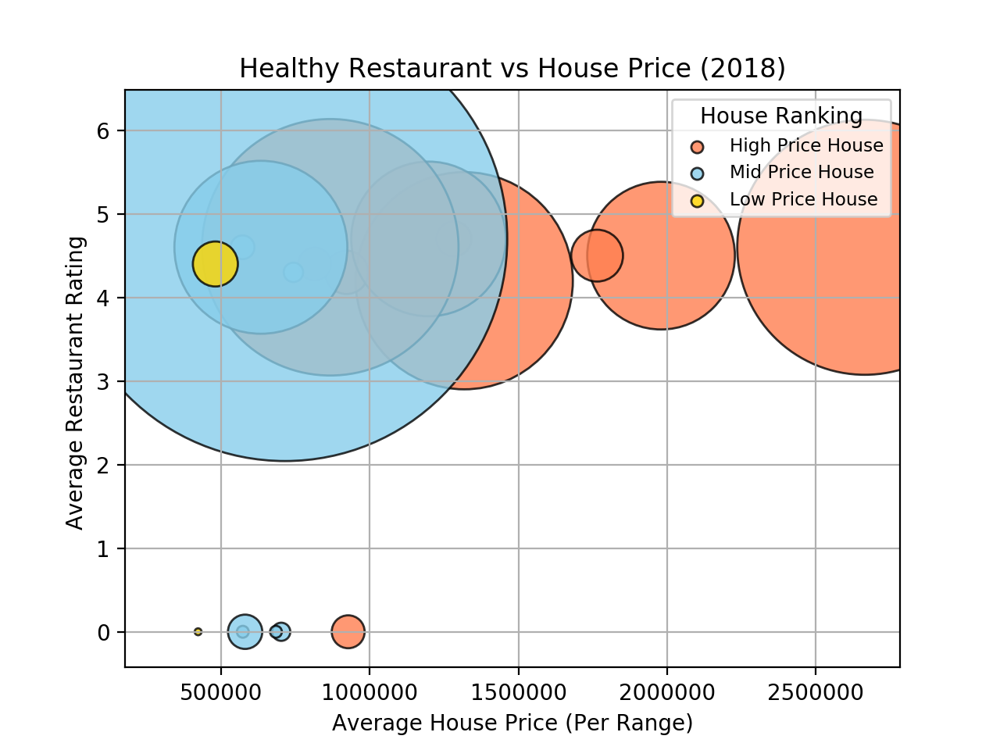

In [129]:
# Build the scatter plots for each city types
plt.scatter(high_h_value, 
            high_h_fare, 
            s=10*high_h_count, c="coral", 
            edgecolor="black", linewidths=1, marker="o", 
            alpha=0.8, label="High Price House")

plt.scatter(Mid_h_value, 
            Mid_h_fare, 
            s=10*Mid_h_count, c="skyblue", 
            edgecolor="black", linewidths=1, marker="o", 
            alpha=0.8, label="Mid Price House")

plt.scatter(Low_h_value, 
            Low_h_fare, 
            s=10*Low_h_count, c="gold", 
            edgecolor="black", linewidths=1, marker="o", 
            alpha=0.8, label="Low Price House")

# Incorporate the other graph properties
plt.title("Healthy Restaurant vs House Price (2018)")
plt.ylabel("Average Restaurant Rating ")
plt.xlabel("Average House Price (Per Range)")
plt.grid(True)

# Create a legend
lgnd = plt.legend(fontsize="small", mode="Expanded", 
                  numpoints=1, scatterpoints=1, 
                  loc="best", title="House Ranking", 
                  labelspacing=0.5)
lgnd.legendHandles[0]._sizes = [30]
lgnd.legendHandles[1]._sizes = [30]
lgnd.legendHandles[2]._sizes = [30]

# Incorporate a text label regarding circle size
#plt.text(42, 35, "Note:\nCircle size correlates with driver count per city.")

# Save Figure
plt.savefig("Fig1.png")

# Show plot
plt.show()

In [222]:
new_merge_city=new_merge['RegionName']

In [223]:
new_merge_price=new_merge['2018-05']


In [224]:
new_merge_price

0      714700.0
37     633200.0
42     927000.0
43     422000.0
44     921500.0
45     866700.0
53     571700.0
57     572400.0
58     480100.0
59    2665300.0
70     580200.0
71    1197400.0
77    1282500.0
78     814400.0
79     683900.0
80     742700.0
81    1317500.0
90    1764600.0
94     701700.0
95    1979800.0
Name: 2018-05, dtype: float64

In [225]:
new_merge_count=new_merge['counts']

In [216]:
new_merge_count

0     4191
37     635
42      23
43       1
44      40
45    1397
53      12
57       3
58      43
59    1381
70      25
71     508
77      26
78      23
79       3
80       8
81    1002
90      57
94       7
95     463
Name: counts, dtype: int64

<IPython.core.display.Javascript object>


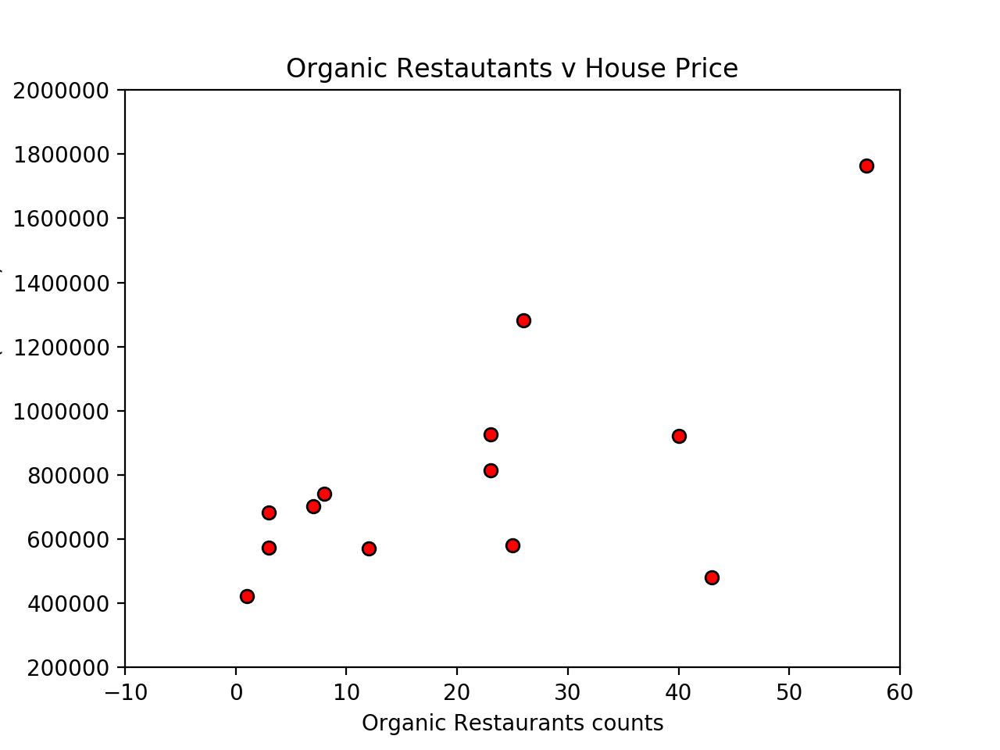

In [230]:
# Tell matplotlib to create a scatter plot based upon the above data
# Tell matplotlib to create a scatter plot based upon the above data
plt.scatter(new_merge_count, new_merge_price, marker="o", facecolors="red", edgecolors="black")
plt.xlim(-10,60)
plt.ylim(200000,2000000)
# Create a title, x label, and y label for our chart
plt.title("Organic Restautants v House Price")
plt.xlabel("Organic Restaurants counts")
plt.ylabel("House Price (Dollars)")


plt.savefig("Restaurant_house_value_count.png")

In [231]:

plt.show()
